In [1]:
from IPython.display import Image

## Valores missing, outlier y correlaciones

**Elaborado por:** Jazmín Fernández Ramírez, Jacqueline Fernández Ramírez, y Nina Odoux.
Máster Universitario de Ciencia de Datos (MUCD) - CUNEF Universidad.

En este notebook se realiza el estudio y preprocesamiento de las variables numéricas y categoricas. Se realizarán los siguientes pasos:

1. Cambio de tipos de variables.
2. Separación en train y test.
3. Análisis de cada variable con gráficos descriptivos.
4. Para variables numéricas: matriz de correlación, estudio de outliers y estudio de valores missing.
5. Para variables categóricas: relleno de valores missing, y estudio de correlaciones con vCramer.


Para los valores outlier por columnas, se tendrá en cuenta los gráficos:

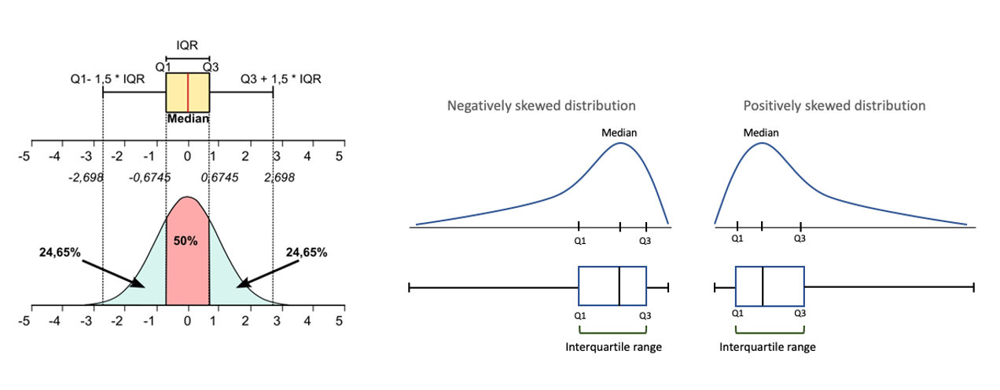

In [5]:
# <img src="../images/analisis_outlier.png">
Image(filename="../images/analisis_outlier.png")

Dentro del tratamiento de los valores missing, se elegirá alguno de los siguientes métodos:

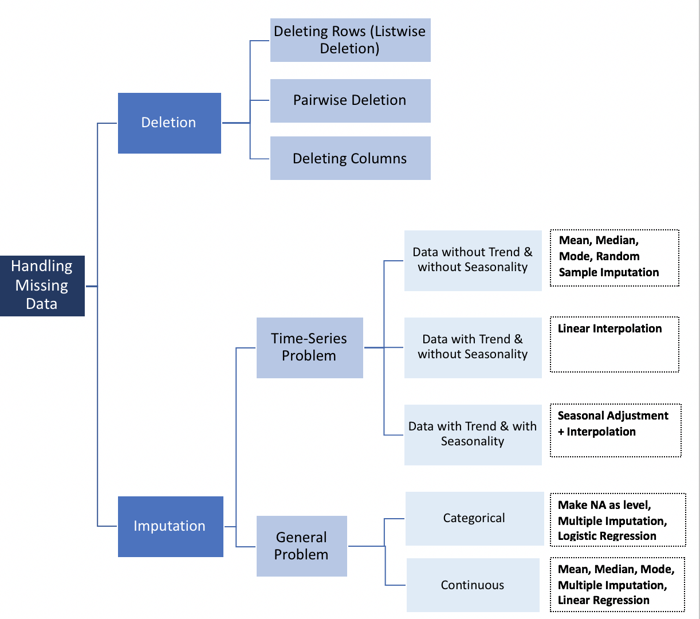

In [8]:
Image(filename="../images/missing.png")

## Importación de liberías

In [7]:
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
import plotly.express as px
import time
import gc
import psutil
from sklearn.impute import KNNImputer
import scipy.stats as ss
import warnings
from sklearn.model_selection import train_test_split
from scipy.stats import chi2_contingency
import sys
import os
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 5000)
seed = np.random.seed(123)

## Funciones 

En este trabajo se va a importar las funciones definidas en el archivo funciones_auxiliares.py mediante el prefijo f_aux. Por ejemplo, para llamar a la función plot_feature, se debe usar la sintaxis f_aux.plot_feature(...).

In [8]:
print(os.getcwd())

C:\Users\jazfe\OneDrive\Documentos\CUNEF\Practica1_EDA\Practica1_EDA\fresh-clone\notebooks


In [21]:
sys.path.append("../src")  
import funciones_auxiliares as f_aux

## Lectura de datos del preprocesado inicial

Lectura de los datos y cambio de tipos de variables

In [24]:
df_application = pd.read_csv("../data/preprocessed_data/bank_data_preprocessed.csv")

df_application.shape

(307511, 122)

In [25]:
df_application.columns

Index(['COMMONAREA_MEDI', 'COMMONAREA_AVG', 'COMMONAREA_MODE',
       'NONLIVINGAPARTMENTS_MODE', 'NONLIVINGAPARTMENTS_AVG',
       'NONLIVINGAPARTMENTS_MEDI', 'FONDKAPREMONT_MODE',
       'LIVINGAPARTMENTS_MODE', 'LIVINGAPARTMENTS_AVG',
       'LIVINGAPARTMENTS_MEDI',
       ...
       'DAYS_ID_PUBLISH', 'DAYS_REGISTRATION', 'DAYS_EMPLOYED', 'DAYS_BIRTH',
       'REGION_POPULATION_RELATIVE', 'NAME_HOUSING_TYPE', 'NAME_FAMILY_STATUS',
       'NAME_EDUCATION_TYPE', 'NAME_INCOME_TYPE', 'SK_ID_CURR'],
      dtype='object', length=122)

In [26]:
list_var_cat, other = f_aux.dame_variables_categoricas(dataset=df_application)
df_application[list_var_cat] = df_application[list_var_cat].astype("category")
list_var_continuous = list(df_application.select_dtypes('float').columns)
df_application[list_var_continuous] = df_application[list_var_continuous].astype(float)
df_application.dtypes

COMMONAREA_MEDI                  float64
COMMONAREA_AVG                   float64
COMMONAREA_MODE                  float64
NONLIVINGAPARTMENTS_MODE         float64
NONLIVINGAPARTMENTS_AVG          float64
NONLIVINGAPARTMENTS_MEDI         float64
FONDKAPREMONT_MODE              category
LIVINGAPARTMENTS_MODE            float64
LIVINGAPARTMENTS_AVG             float64
LIVINGAPARTMENTS_MEDI            float64
FLOORSMIN_AVG                    float64
FLOORSMIN_MODE                   float64
FLOORSMIN_MEDI                   float64
YEARS_BUILD_MEDI                 float64
YEARS_BUILD_MODE                 float64
YEARS_BUILD_AVG                  float64
OWN_CAR_AGE                      float64
LANDAREA_MEDI                    float64
LANDAREA_MODE                    float64
LANDAREA_AVG                     float64
BASEMENTAREA_MEDI                float64
BASEMENTAREA_AVG                 float64
BASEMENTAREA_MODE                float64
EXT_SOURCE_1                     float64
NONLIVINGAREA_MO

In [29]:
df_application.describe()

,COMMONAREA_MEDI,COMMONAREA_AVG,COMMONAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAPARTMENTS_AVG,NONLIVINGAPARTMENTS_MEDI,LIVINGAPARTMENTS_MODE,LIVINGAPARTMENTS_AVG,LIVINGAPARTMENTS_MEDI,FLOORSMIN_AVG,FLOORSMIN_MODE,FLOORSMIN_MEDI,YEARS_BUILD_MEDI,YEARS_BUILD_MODE,YEARS_BUILD_AVG,OWN_CAR_AGE,LANDAREA_MEDI,LANDAREA_MODE,LANDAREA_AVG,BASEMENTAREA_MEDI,BASEMENTAREA_AVG,BASEMENTAREA_MODE,EXT_SOURCE_1,NONLIVINGAREA_MODE,NONLIVINGAREA_AVG,NONLIVINGAREA_MEDI,ELEVATORS_MEDI,ELEVATORS_AVG,ELEVATORS_MODE,APARTMENTS_MEDI,APARTMENTS_AVG,APARTMENTS_MODE,ENTRANCES_MEDI,ENTRANCES_AVG,ENTRANCES_MODE,LIVINGAREA_AVG,LIVINGAREA_MODE,LIVINGAREA_MEDI,FLOORSMAX_MODE,FLOORSMAX_MEDI,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BEGINEXPLUATATION_AVG,TOTALAREA_MODE,EXT_SOURCE_3,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,EXT_SOURCE_2,AMT_GOODS_PRICE,AMT_ANNUITY,CNT_FAM_MEMBERS,DAYS_LAST_PHONE_CHANGE,AMT_CREDIT,AMT_INCOME_TOTAL,DAYS_ID_PUBLISH,DAYS_REGISTRATION,DAYS_EMPLOYED,DAYS_BIRTH,REGION_POPULATION_RELATIVE,SK_ID_CURR
count,92646.000000,92646.000000,92646.000000,93997.000000,93997.000000,93997.000000,97312.000000,97312.000000,97312.000000,98869.000000,98869.000000,98869.000000,103023.000000,103023.000000,103023.000000,104582.000000,124921.000000,124921.000000,124921.000000,127568.000000,127568.000000,127568.000000,134133.000000,137829.000000,137829.000000,137829.000000,143620.000000,143620.000000,143620.000000,151450.000000,151450.00000,151450.000000,152683.000000,152683.000000,152683.000000,153161.000000,153161.000000,153161.000000,154491.000000,154491.000000,154491.000000,157504.000000,157504.000000,157504.000000,159080.000000,246546.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,306490.000000,306490.000000,306490.000000,306490.000000,3.068510e+05,3.072330e+05,307499.000000,307509.000000,307510.000000,3.075110e+05,3.075110e+05,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000
mean,0.044595,0.044621,0.042553,0.008076,0.008809,0.008651,0.105645,0.100775,0.101954,0.231894,0.228058,0.231625,0.755746,0.759637,0.752471,12.061091,0.067169,0.064958,0.066333,0.087955,0.088442,0.087543,0.502130,0.027022,0.028358,0.028236,0.078078,0.078942,0.074490,0.117850,0.11744,0.114231,0.149213,0.149725,0.145193,0.107399,0.105975,0.108607,0.222315,0.225897,0.226282,0.977065,0.977752,0.977735,0.102547,0.510853,0.006402,0.007000,0.034362,0.267395,0.265474,1.899974,1.422245,0.143421,1.405292,0.100049,5.143927e-01,5.383962e+05,27108.573909,2.152665,-962.858788,5.990260e+05,1.687979e+05,-2994.202373,-4986.120328,63815.045904,-16036.995067,0.020868,278180.518577
std,0.076144,0.076036,0.074445,0.046276,0.047732,0.047415,0.097880,0.092576,0.093642,0.161380,0.161160,0.161934,0.112066,0.110111,0.113280,11.944812,0.082167,0.081750,0.081184,0.082179,0.082438,0.084307,0.211062,0.070254,0.069523,0.070166,0.134467,0.134576,0.132256,0.109076,0.10824,0.107936,0.100368,0.100049,0.100977,0.110565,0.111845,0.112260,0.143709,0.145067,0.144641,0.064575,0.059897,0.059223,0.107462,0.194844,0.083849,0.110757,0.204685,0.916002,0.794056,1.869295,2.400989,0.446698,2.379803,0.362291,1.910602e-01,3.694465e+05,14493.737315,0.910682,826.808487,4.024908e+05,2.371231e+05,1509.450419,3522.886321,141275.766519,4363.988632,0.013831,102790.175348
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.014568,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000527,0.000000,0.000000,0.000000,0.00

## Separación en train y test estratificado

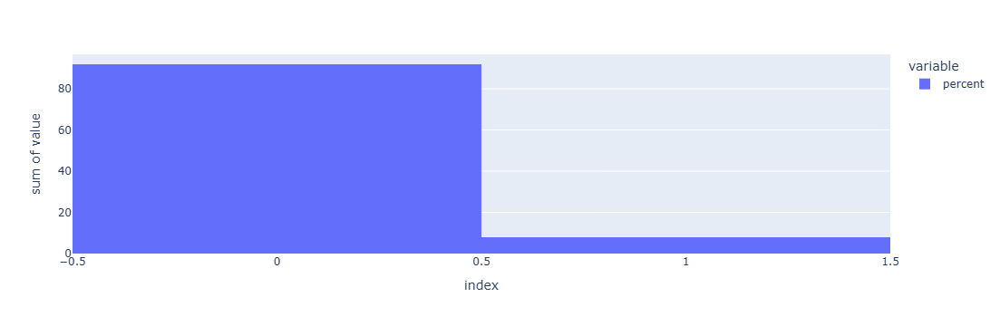

In [31]:
pd_plot_target_status = df_application['TARGET']\
        .value_counts(normalize=True)\
        .mul(100).rename('percent').reset_index()

pd_plot_target_status_conteo = df_application['TARGET'].value_counts().reset_index()
pd_plot_target_status_pc = pd.merge(pd_plot_target_status, 
                                  pd_plot_target_status_conteo, on=['index'], how='inner')

fig = px.histogram(pd_plot_target_status_pc, x="index", y=['percent'])
fig.show()

In [35]:
X_df_application, X_df_application_test, y_df_application, y_df_application_test = train_test_split(df_application.drop('TARGET',axis=1), 
                                                                     df_application['TARGET'], 
                                                                     stratify=df_application['TARGET'], 
                                                                     test_size=0.2)
df_application_train = pd.concat([X_df_application, y_df_application],axis=1)
df_application_test = pd.concat([X_df_application_test, y_df_application_test],axis=1)

In [36]:
print('== Train\n', df_application_train['TARGET'].value_counts(normalize=True))
print('== Test\n', df_application_test['TARGET'].value_counts(normalize=True))

== Train
 0    0.919271
1    0.080729
Name: TARGET, dtype: float64
== Test
 0    0.919272
1    0.080728
Name: TARGET, dtype: float64


En el presente código, se llevó a cabo un estudio minucioso de la variable objetivo TARGET para entender su distribución y tratar el desequilibrio notable existente. En un principio, se determinó la distribución porcentual y la totalidad de cada clase de TARGET en el DataFrame df_application. Esto hizo evidente que el 91.93% de los registros son de la clase 0 y únicamente el 8.07% pertenecen a la clase 1. Se aplicó una separación estratificada para preservar la proporción de clases en los conjuntos de datos de entrenamiento y prueba. De este modo, se empleó la función train_test_split de sklearn, garantizando una representación justa de ambas clases en los datos de entrenamiento y prueba.

Por otro lado, para confirmar la estratificación, se comprobaron las proporciones de cada clase en los dos grupos. Los hallazgos corroboraron que las distribuciones de TARGET se conservaron constantes tanto en los datos de entrenamiento como en los de prueba, lo cual es vital para prevenir prejuicios en el modelo y asegurar una valoración equitativa. Este cuidadoso enfoque en la separación y validación de los datos es esencial para garantizar la robustez y exactitud de los modelos de aprendizaje automático que se formarán en dichos datos. Por lo tanto, se asegura que el modelo pueda generalizar adecuadamente nuevos datos y ofrecer proyecciones confiables.

## Visualización descriptiva de los datos

Se ve el número de valores nulos por filas y por columnas

In [40]:
pd_series_null_columns = df_application_train.isnull().sum().sort_values(ascending=False)
pd_series_null_rows = df_application_train.isnull().sum(axis=1).sort_values(ascending=False)
print(pd_series_null_columns.shape, pd_series_null_rows.shape)

pd_null_columnas = pd.DataFrame(pd_series_null_columns, columns=['column_nulls'])     
pd_null_filas = pd.DataFrame(pd_series_null_rows, columns=['row_nulls'])  
pd_null_filas['target'] = df_application_train['TARGET'].copy()
pd_null_columnas['column_percentage'] = pd_null_columnas['column_nulls']/df_application_train.shape[0]
pd_null_filas['row_percentage']= pd_null_filas['row_nulls']/df_application_train.shape[1]

(122,) (246008,)


In [42]:
pd_null_columnas

,column_nulls,column_percentage
COMMONAREA_MEDI,171830,0.698473
COMMONAREA_MODE,171830,0.698473
COMMONAREA_AVG,171830,0.698473
NONLIVINGAPARTMENTS_MODE,170798,0.694278
NONLIVINGAPARTMENTS_MEDI,170798,0.694278
NONLIVINGAPARTMENTS_AVG,170798,0.694278
FONDKAPREMONT_MODE,168191,0.683681
LIVINGAPARTMENTS_AVG,168151,0.683518
LIVINGAPARTMENTS_MEDI,168151,0.683518
LIVINGAPARTMENTS_MODE,168151,0.683518


In [44]:
pd_null_filas.head()

,row_nulls,target,row_percentage
116937,61,0,0.5
244833,61,0,0.5
197736,61,0,0.5
133770,61,0,0.5
269492,61,0,0.5


En este apartado, pd_series_null_columns y pd_series_null_rows, determinan la cantidad total de valores nulos en cada columna y fila, respectivamente, y las organizan de manera descendente para detectar con eficacia las columnas y filas con mayor cantidad de valores nulos. Cabe mencionar que, detectar la ubicación de los valores nulos es esencial para el siguiente paso en la gestión de datos, debido a que facilita la toma de decisiones fundamentadas respecto a si se deben modificar filas/columnas, atribuir valores nulos o tratar los nulos de una forma distinta.

## Distribución del resto de variables

In [47]:
def set_plot_style():
    """Sets the general style for plots."""
    sns.set_style("whitegrid")
    plt.rcParams['figure.dpi'] = 100
    plt.rcParams['font.size'] = 10
    plt.rcParams['axes.titlesize'] = 12
    plt.rcParams['axes.labelsize'] = 10
    plt.rcParams['xtick.labelsize'] = 9
    plt.rcParams['ytick.labelsize'] = 9

def clear_memory():
    """Clears memory."""
    plt.close('all')
    gc.collect()

def optimize_figure_size(n_categories, label_length):
    """Optimizes figure size."""
    if n_categories > 10 or label_length > 15:
        return (15, 6)
    return (12, 5)

def plot_feature(df, col_name, isContinuous, target, max_categories=15, sample_size=50000):
    """
    Function to create custom exploratory plots with Seaborn, optimizing design based on the 
    characteristics of the analyzed variable (continuous or categorical) and its relationship with the target variable.

    Parameters:
    -----------
    - df : pandas.DataFrame
        The dataset containing the variables to analyze.
    - col_name : str
        Name of the column to analyze within the DataFrame.
    - isContinuous : bool
        Indicates if the column is a continuous variable (True) or categorical (False).
    - target : str
        Name of the target variable to analyze the relationship with the column.
    - max_categories : int, optional (default=15)
        Maximum number of categories to visualize for categorical variables (categories with the lowest frequency will be excluded if this limit is exceeded).
    - sample_size : int, optional (default=50000)
        Maximum sample size to optimize performance for large datasets.   
        
    Output:
    -------
    - fig : matplotlib.figure.Figure
        Generated figure with the plots. If an error occurs during plot generation, 
        None is returned.

    Process Description:
    ---------------------
    1. *Data reduction for large datasets*: If the number of rows in the DataFrame exceeds 
       sample_size, a random sample is taken to optimize processing speed.
    2. *Dynamic figure size adjustment*: Figure size is dynamically calculated based on the 
       number of unique values in the analyzed column (col_name) and the length of its labels.
    3. *Plots for continuous variables*:
       - *Histogram*: Displays the variable distribution. Includes lines for mean and median.
       - *Boxplot*: Visualizes the variable distribution by categories of the target variable.
    4. *Plots for categorical variables*:
       - *Category count*: Shows the frequency of the main categories.
       - *Proportion by target*: Visualizes the proportion of the target variable based on the categories.
    5. *Outlier cleaning (for continuous variables)*: Extreme values are excluded using the 
       1st and 99th percentiles.
    6. *Label control and rotation*: Optimizes the X-axis labels for better readability, adjusting the rotation based on label length and the number of categories.

    Recommended Usage:
    ------------------
    Use this function for exploratory data analysis (EDA) when you need to understand:
    - The distribution of a continuous or categorical variable.
    - The relationship between an independent variable and the target variable.
    
    Error Handling:
    ---------------
    If an error occurs during execution (e.g., if a column does not exist in the DataFrame or if 
    the data type is incorrect), the function closes the created figure and returns None.  
    """
    
    # Sampling if the dataset is large
    if len(df) > sample_size:
        df = df.sample(n=sample_size, random_state=42)
    
    # Calculate metrics for size
    n_unique = len(df[col_name].unique())
    max_label_len = df[col_name].astype(str).str.len().max()
    figsize = optimize_figure_size(n_unique, max_label_len)
    
    # Create figure
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize)
    
    # Custom color palette
    palette = sns.color_palette(['#2ecc71', '#e74c3c', '#3498db'])
    
    try:
        # Calculate null values information
        nulls = df[col_name].isnull().sum()
        null_pct = (nulls / len(df)) * 100
        
        if isContinuous:
            # Remove outliers
            q1, q3 = df[col_name].quantile([0.01, 0.99])
            df_clean = df[(df[col_name] >= q1) & (df[col_name] <= q3)]
            
            # Distribution plot
            sns.histplot(
                data=df_clean,
                x=col_name,
                ax=ax1,
                color=palette[0],
                kde=True,
                bins=30
            )
            
            # Add lines for mean and median
            mean_val = df_clean[col_name].mean()
            median_val = df_clean[col_name].median()
            ax1.axvline(mean_val, color=palette[1], linestyle='--', label=f'Mean: {mean_val:.2f}')
            ax1.axvline(median_val, color=palette[2], linestyle='--', label=f'Median: {median_val:.2f}')
            ax1.legend(fontsize=8)
            
            # Boxplot
            sns.boxplot(
                x=target,
                y=col_name,
                data=df_clean,
                ax=ax2,
                palette=[palette[0], palette[1]]
            )
            
        else:
            # Limit categories for categorical variables
            value_counts = df[col_name].value_counts()
            if len(value_counts) > max_categories:
                top_cats = value_counts.nlargest(max_categories).index
                df = df[df[col_name].isin(top_cats)]
                value_counts = value_counts[top_cats]
                
            # Count plot
            sns.countplot(
                data=df,
                x=col_name,
                order=value_counts.index,
                ax=ax1,
                color=palette[0]
            )
            
            # Proportion plot by target
            target_props = df.groupby(col_name)[target].value_counts(normalize=True).unstack()
            target_props.plot(
                kind='bar',
                ax=ax2,
                color=[palette[0], palette[1]],
                width=0.8
            )
            ax2.set_ylabel(f'Proportion of {target}')
        
        # Set titles and labels
        ax1.set_title(f'Distribution of {col_name}\nNulls: {nulls:,} ({null_pct:.1f}%)')
        ax2.set_title(f'Relationship with {target}')
        
        # Adjust labels
        for ax in [ax1, ax2]:
            if not isContinuous:
                labels = ax.get_xticklabels()
                if len(labels) > 0:
                    max_len = max(len(str(l.get_text())) for l in labels)
                    rotation = 90 if max_len > 10 or len(labels) > 5 else 45
                    ax.set_xticklabels(
                        labels, 
                        rotation=rotation, 
                        ha='right' if rotation == 90 else 'right',
                        fontsize=8
                    )
            
            # Adjust grid
            ax.grid(True, alpha=0.3)
            
            # Adjust limits
            if not isContinuous:
                ax.set_xlabel(col_name, fontsize=9)
        
        # Adjust space
        plt.tight_layout()
        return fig
        
    except Exception as e:
        plt.close(fig)
        print(f"Error in {col_name}: {str(e)}")
        return None


In [49]:
def plot_all_features(df, target_col='TARGET', batch_size=3, memory_threshold=85):
    """
    Function to generate exploratory plots for all features in a dataset,
    optimizing memory usage and processing columns in batches.

    Parameters:
    -----------
    - df : pandas.DataFrame
        The dataset containing the features and target variable.
    - target_col : str, optional (default='TARGET')
        Name of the target column to analyze relationships with other features.
    - batch_size : int, optional (default=3)
        Number of columns to process simultaneously in each batch to optimize performance.
    - memory_threshold : int, optional (default=85)
        Maximum memory usage percentage allowed before forcing resource cleanup.  
        
    Process Description:
    ---------------------
    1. *Initial Setup*:
       - Configures the visual style for plots using a custom function (`set_plot_style`).
       - Excludes the target column (`target_col`) from the list of columns to process.
       - Calculates the total number of columns to analyze.

    2. *Batch Processing*:
       - Divides the columns into batches (`batch_size`) to avoid memory overload on large datasets.
       - Before processing a batch, checks memory usage using `psutil.virtual_memory()`.
       - If memory usage exceeds the defined threshold (`memory_threshold`), forces memory cleanup 
         by invoking `clear_memory()`.

    3. *Plot Generation*:
       - For each column in the batch:
         - Determines whether it is a continuous or categorical variable, based on its data type 
           and the number of unique values.
         - Calls the `plot_feature` function to generate the corresponding plots. If the function 
           returns a valid plot, it is displayed and then closed to free up resources.
       - Cleans up memory after processing each column to optimize resource usage.

    4. *Pause Between Batches*:
       - Introduces a brief delay between batches to avoid overloading the system, particularly useful 
         in resource-constrained environments.

    5. *Error Handling*:
       - Captures exceptions for individual columns and continues processing others, ensuring 
         the process does not stop due to isolated errors.
       - Allows manual interruption with a `KeyboardInterrupt` (Ctrl + C), ensuring resource cleanup 
         before termination.  

    Output:
    -------
    - Displays the generated plots for each column and automatically closes them to optimize 
      memory usage.
    - Prints progress messages to the console, including processed batches and columns with errors.

    Recommended Usage:
    ------------------
    This function is ideal for exploratory data analysis (EDA) when:
    - Working with a dataset with a large number of features.
    - Automating the generation of plots for all columns while optimizing resource usage.
    - Identifying general patterns in the relationship between features and the target variable.

    Error Handling:
    ------------------
    - If a column cannot be processed for any reason (e.g., invalid values or unexpected errors), 
      the function prints the error to the console and continues with the next column.
    - Allows manual interruption via Ctrl + C, ensuring memory cleanup upon termination.
    """
    # Configure style
    set_plot_style()
    
    # Prepare columns
    columns = [col for col in df.columns if col != target_col]
    total_cols = len(columns)
    
    print(f"Starting analysis of {total_cols} features")
    
    try:
        for i in range(0, total_cols, batch_size):
            # Check memory
            if psutil.virtual_memory().percent > memory_threshold:
                clear_memory()
                print("\nCleaning memory...")
                time.sleep(2)
            
            batch_cols = columns[i:i + batch_size]
            print(f"\nProcessing batch {i//batch_size + 1} of {(total_cols + batch_size - 1)//batch_size}")
            
            for col in batch_cols:
                try:
                    # Determine variable type
                    is_continuous = (
                        df[col].dtype in [float, int] and 
                        len(df[col].unique()) > 10
                    )
                    
                    # Create plot
                    fig = plot_feature(
                        df=df,
                        col_name=col,
                        isContinuous=is_continuous,
                        target=target_col,
                        max_categories=15,    # Limit for categories
                        sample_size=50000     # Limit for records
                    )
                    
                    if fig is not None:
                        plt.show()
                        plt.close(fig)
                    
                    # Clean memory
                    clear_memory()
                    
                except Exception as e:
                    print(f"Error processing {col}: {str(e)}")
                    continue
            
            # Pause between batches
            time.sleep(1)
        
        print("\nProcess completed successfully.")
        
    except KeyboardInterrupt:
        print("\nProcess interrupted by the user.")
        clear_memory()
    
    finally:
        clear_memory()


Starting analysis of 121 features

Processing batch 1 of 41


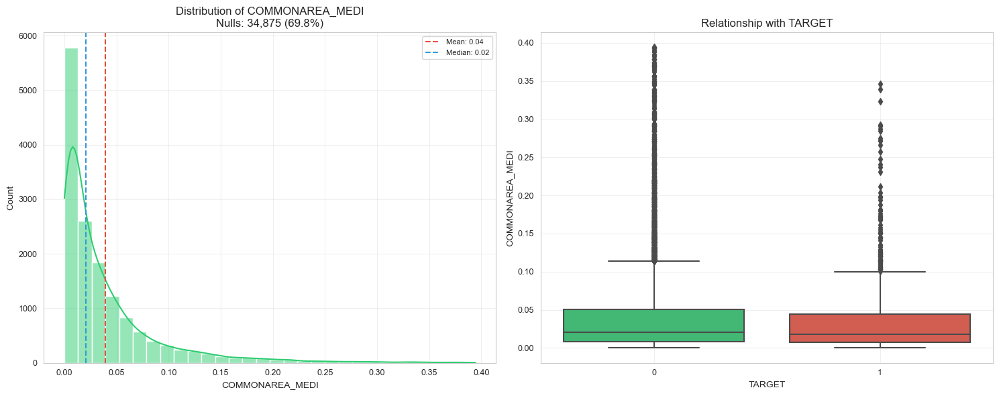

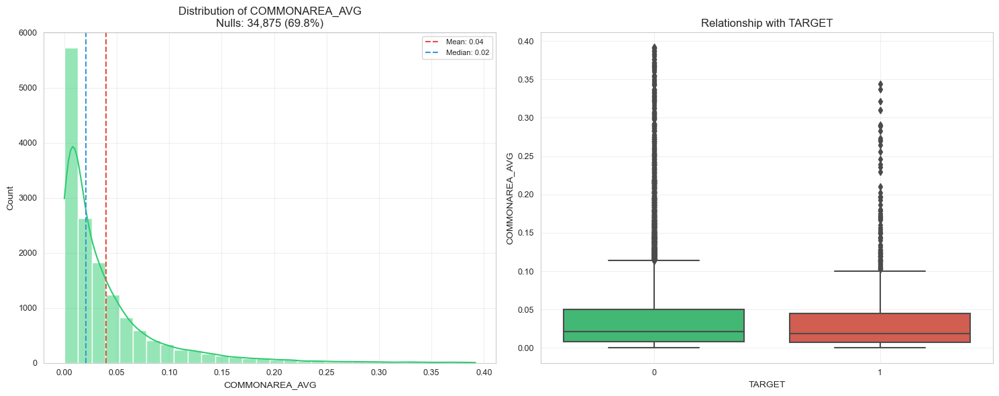

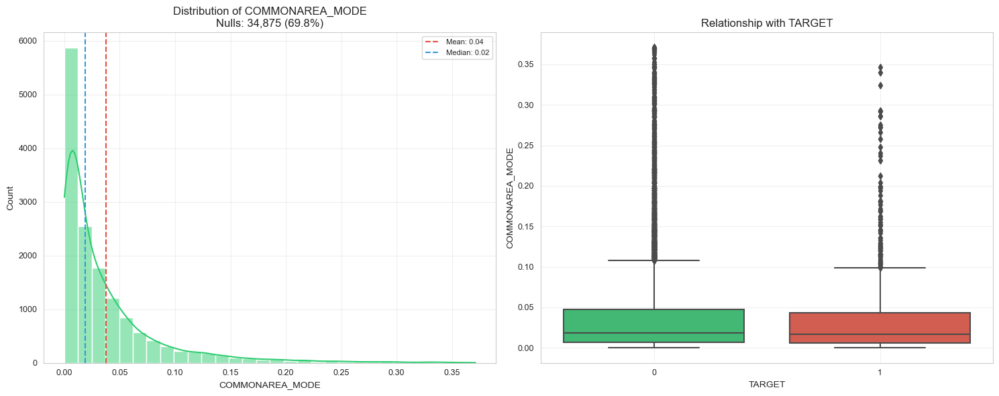


Processing batch 2 of 41


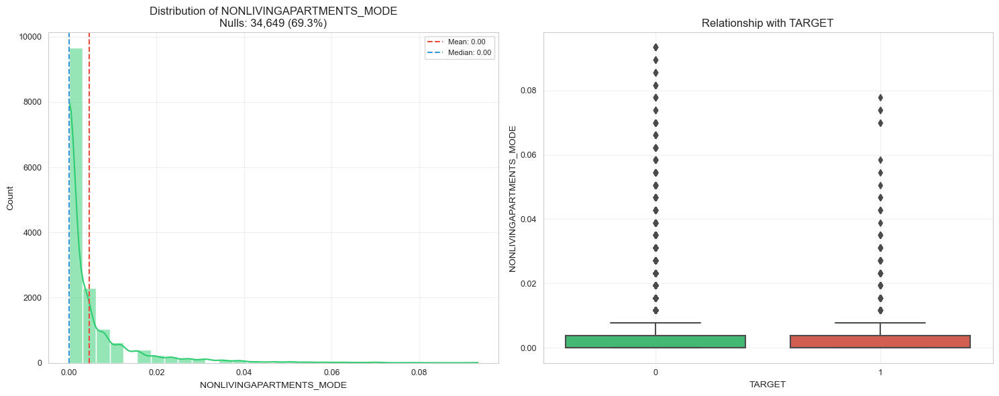

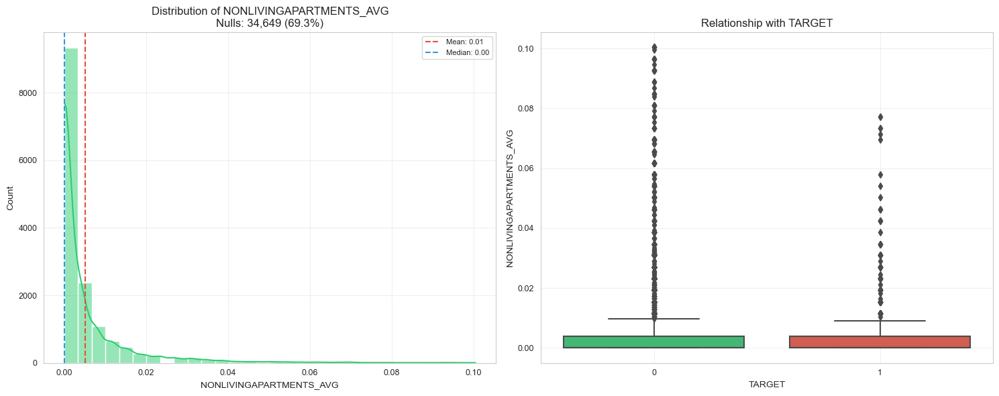

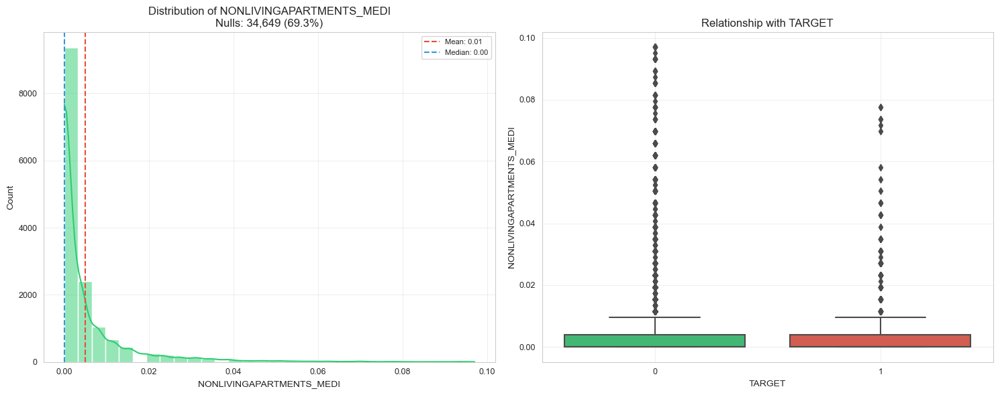


Processing batch 3 of 41


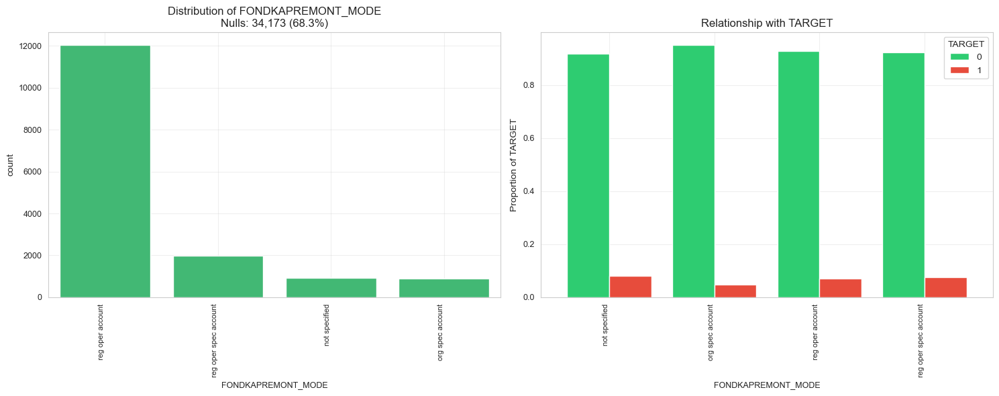

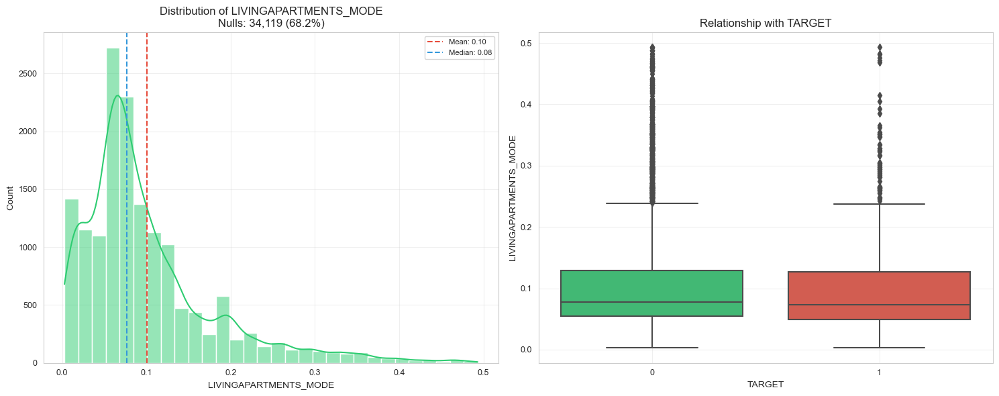

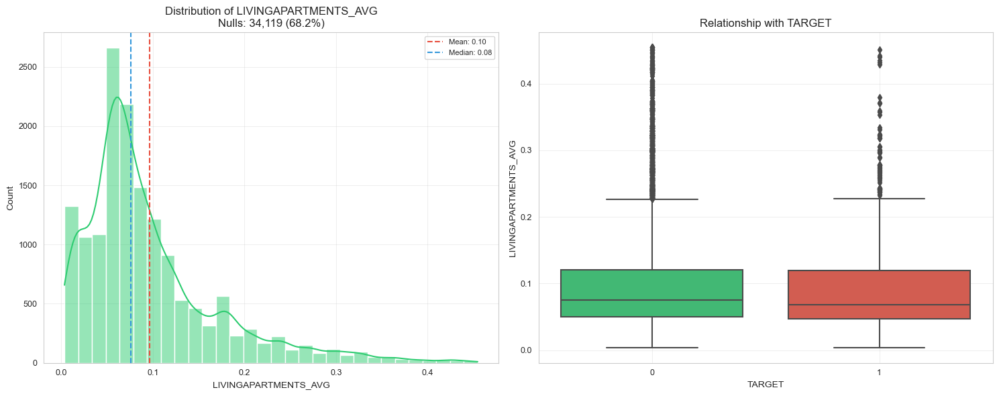


Processing batch 4 of 41


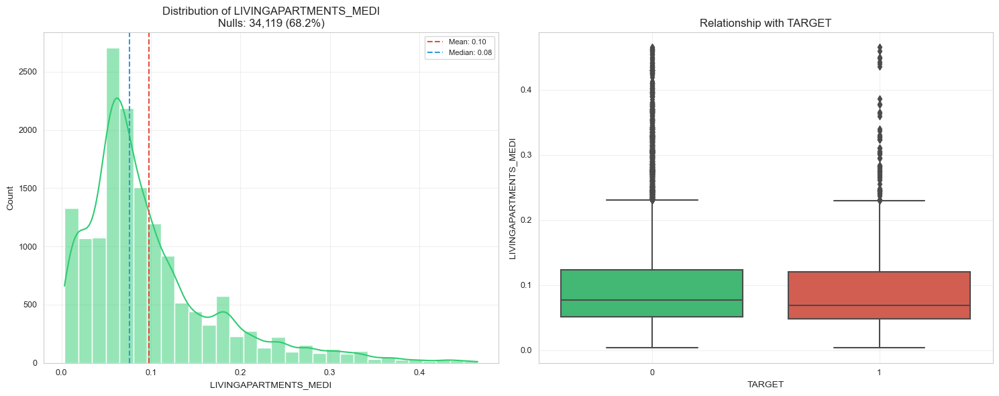

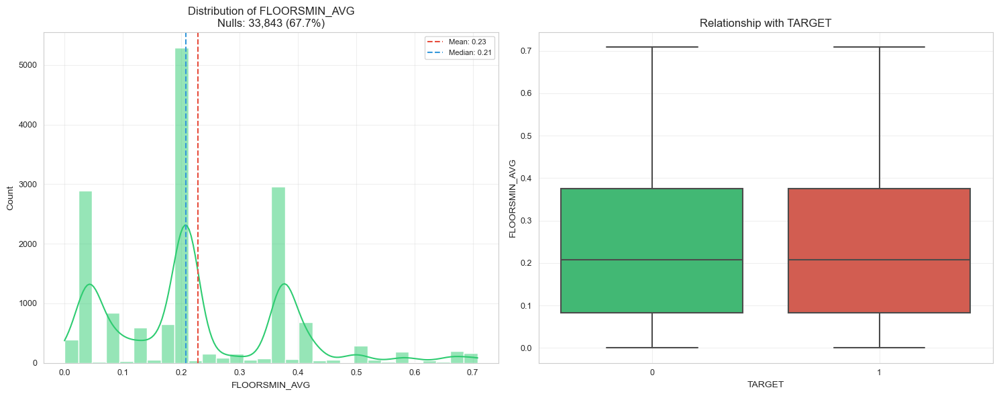

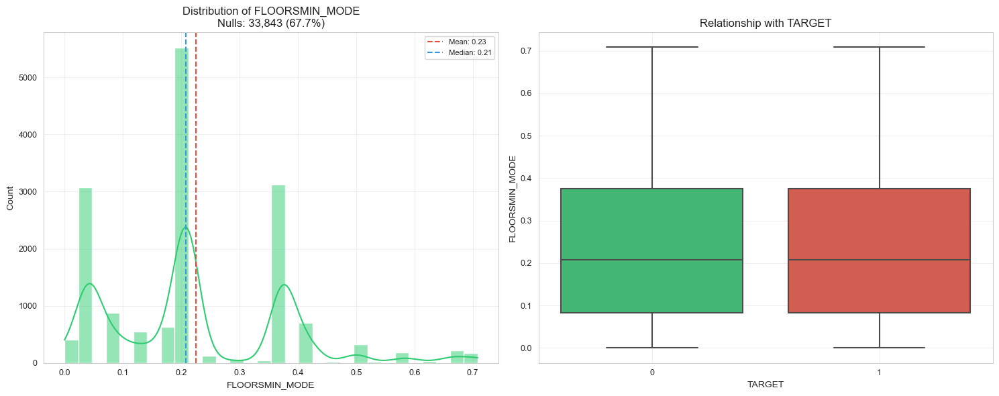


Processing batch 5 of 41


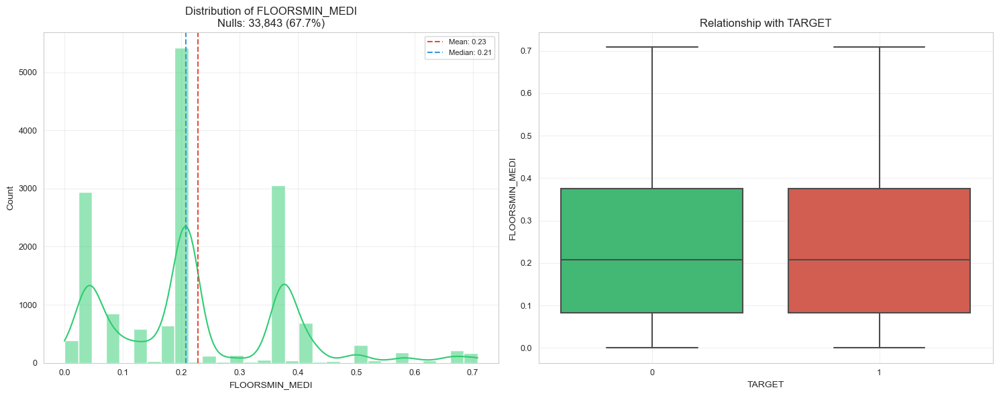

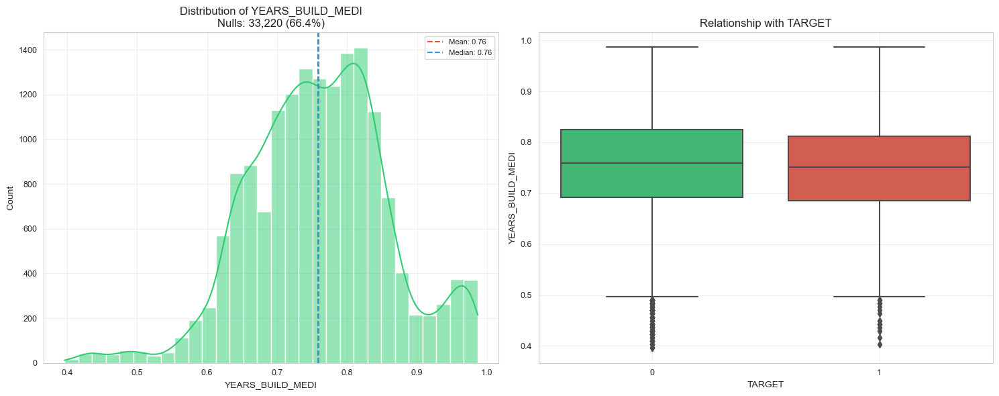

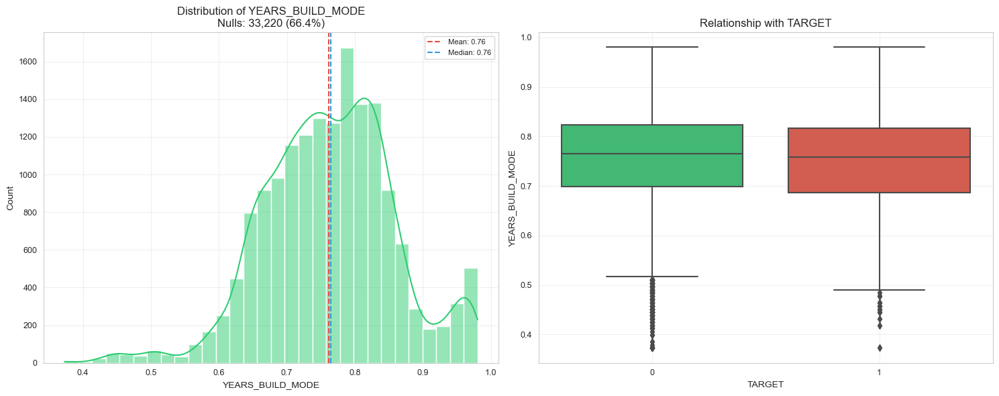


Processing batch 6 of 41


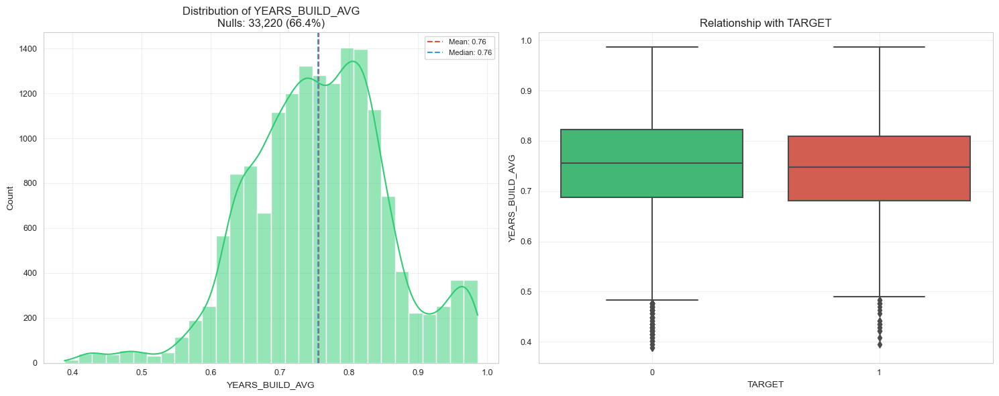

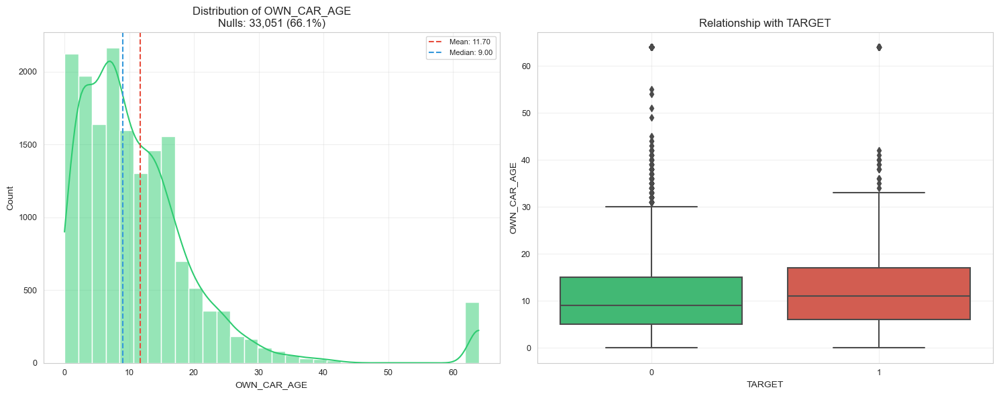

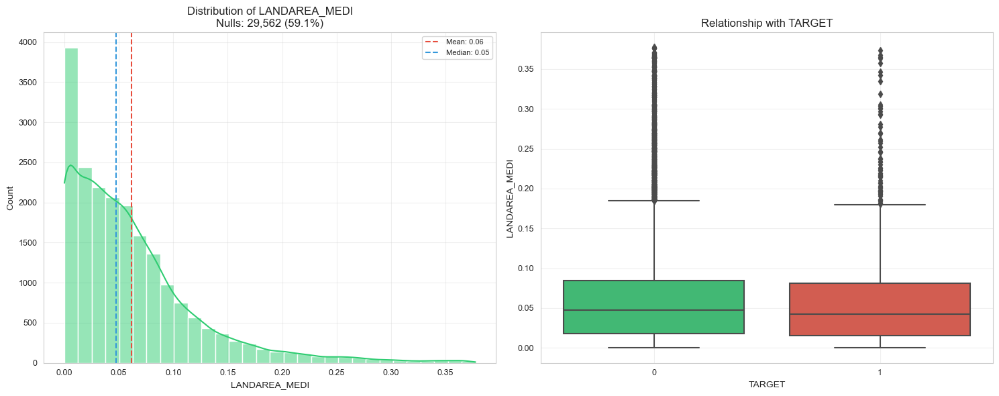


Processing batch 7 of 41


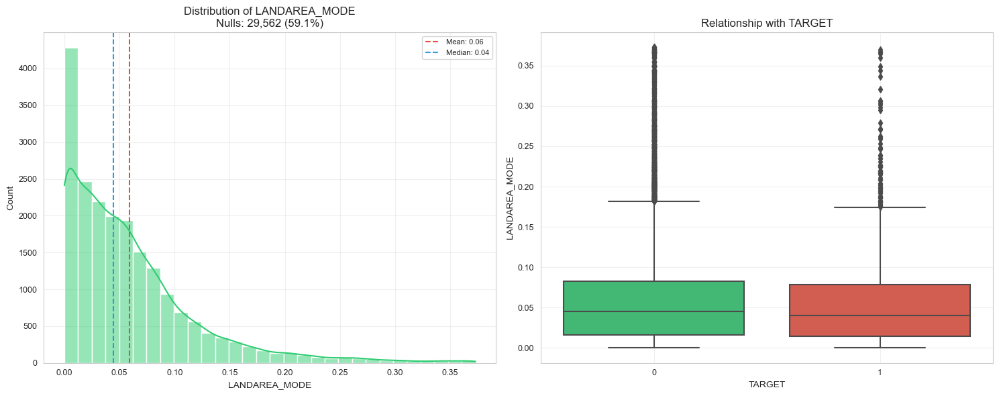

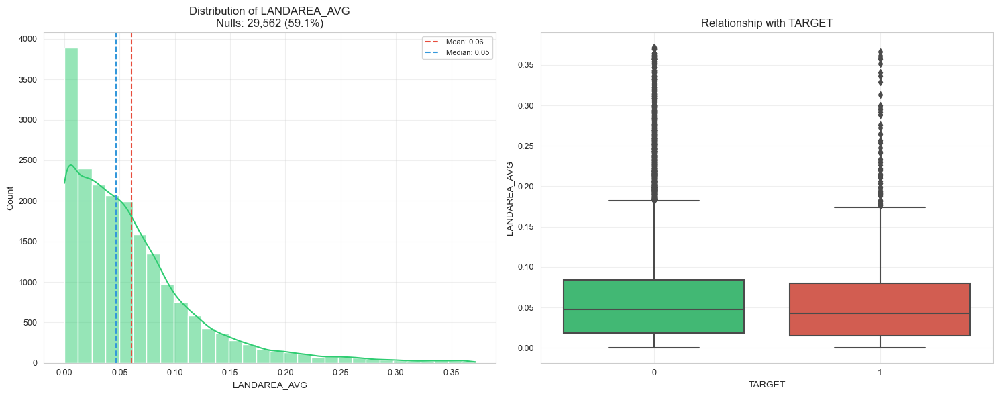

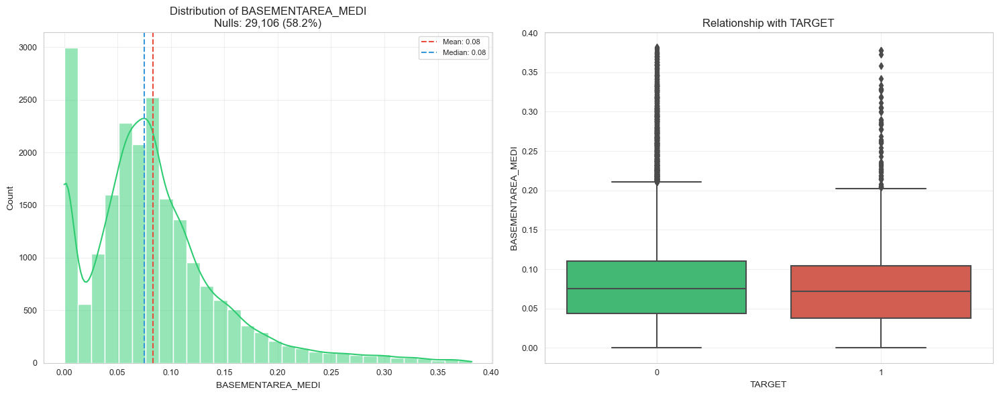


Processing batch 8 of 41


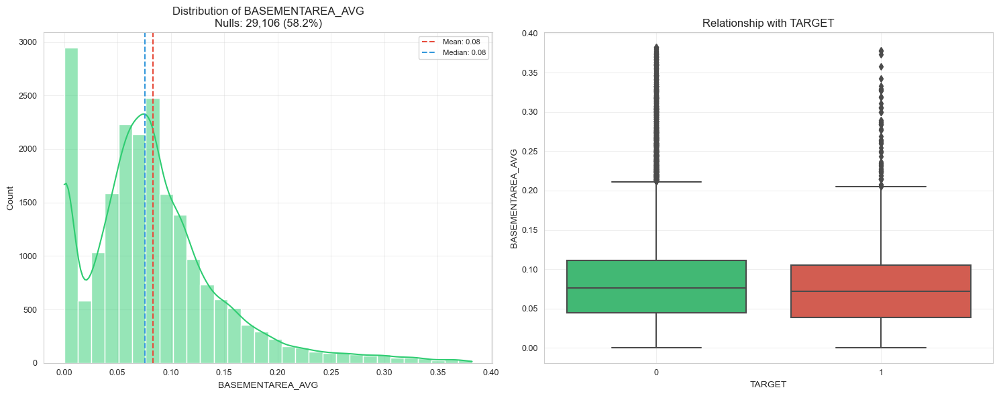

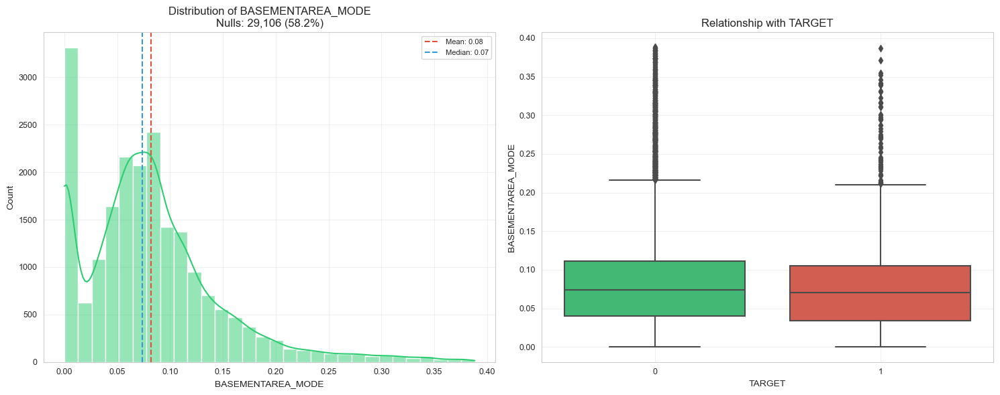

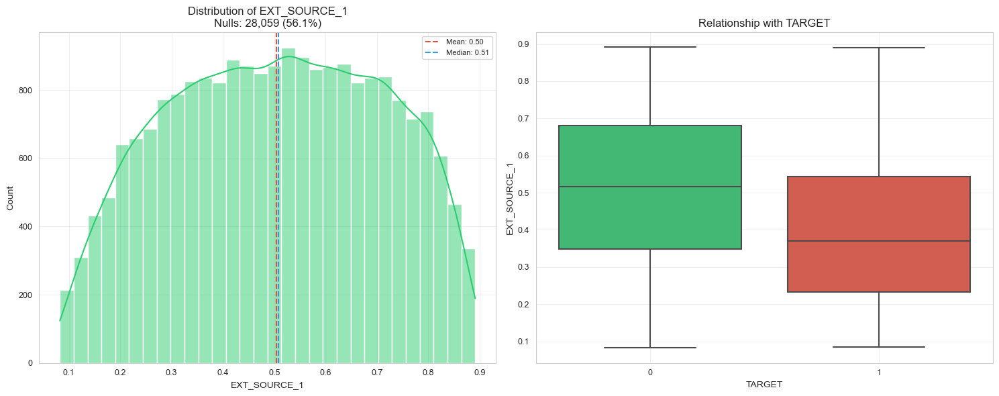


Processing batch 9 of 41


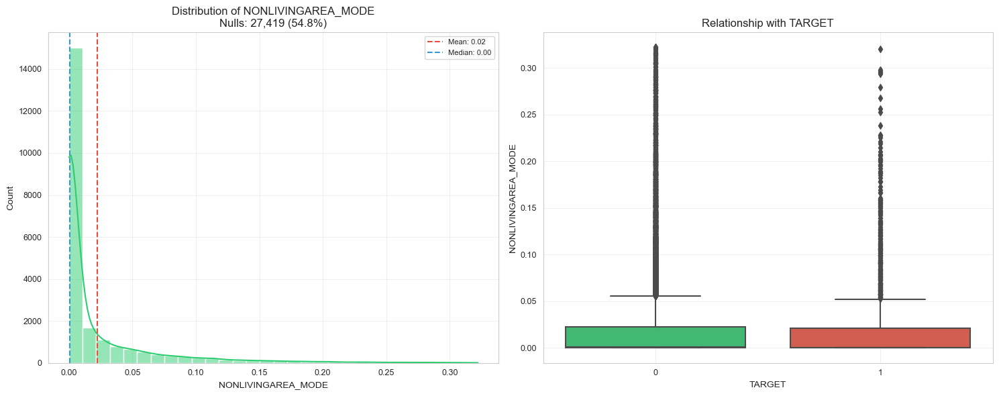

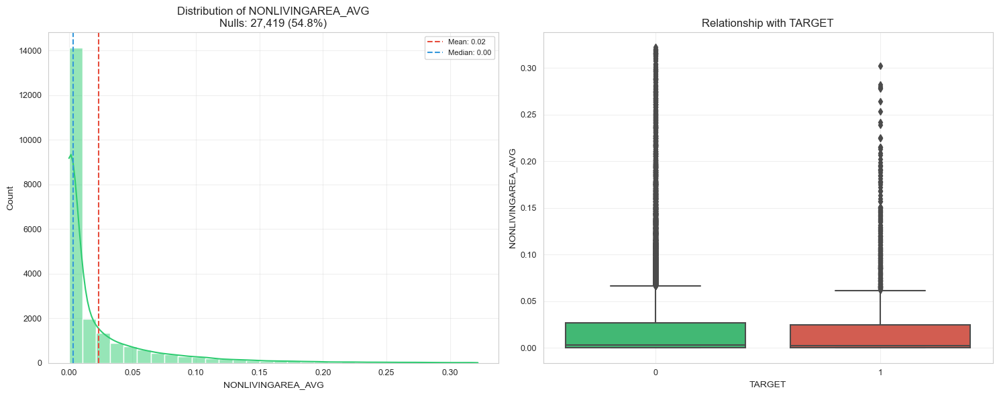

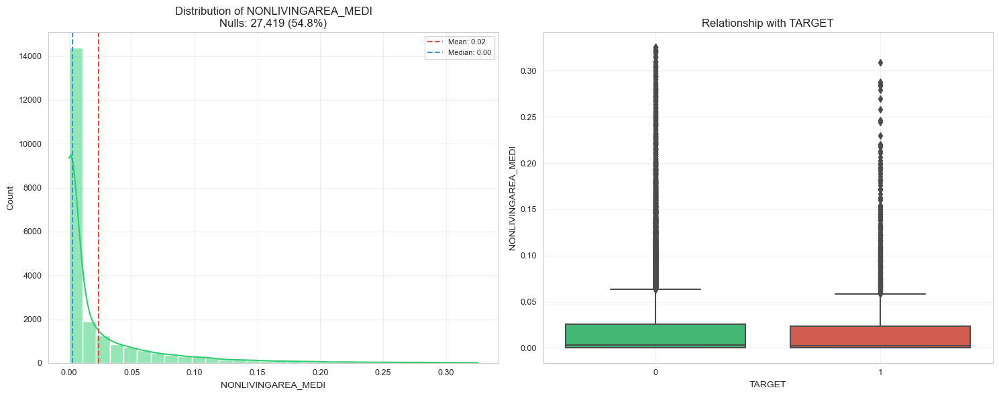


Processing batch 10 of 41


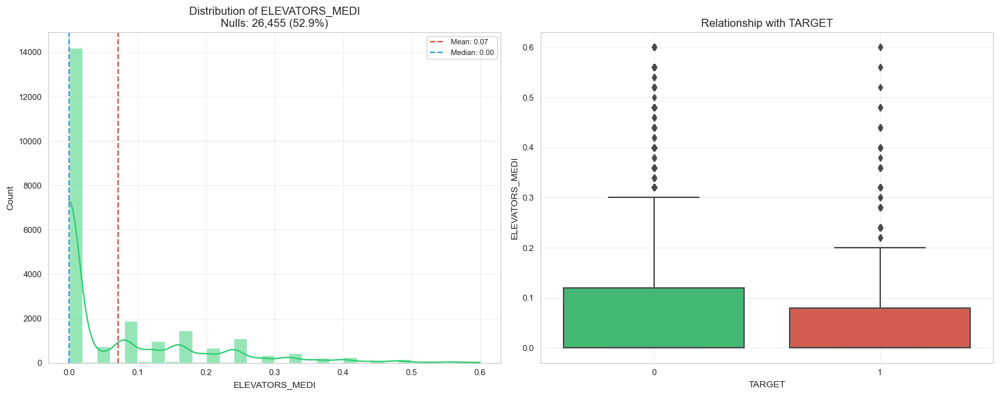

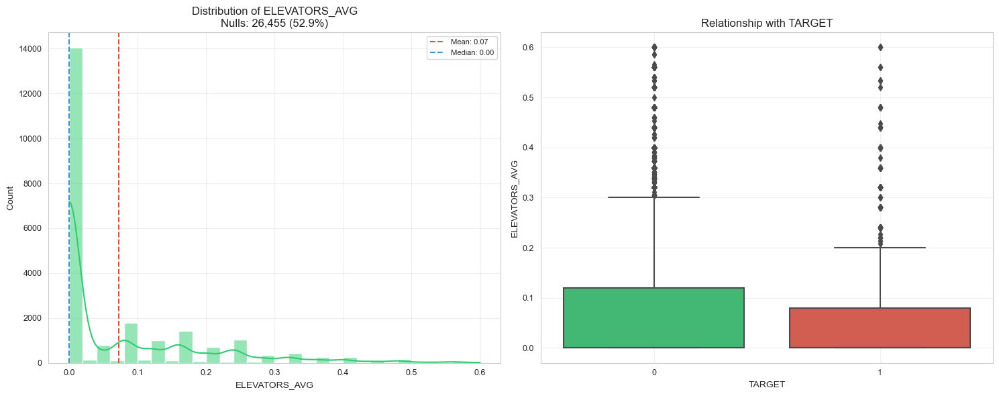

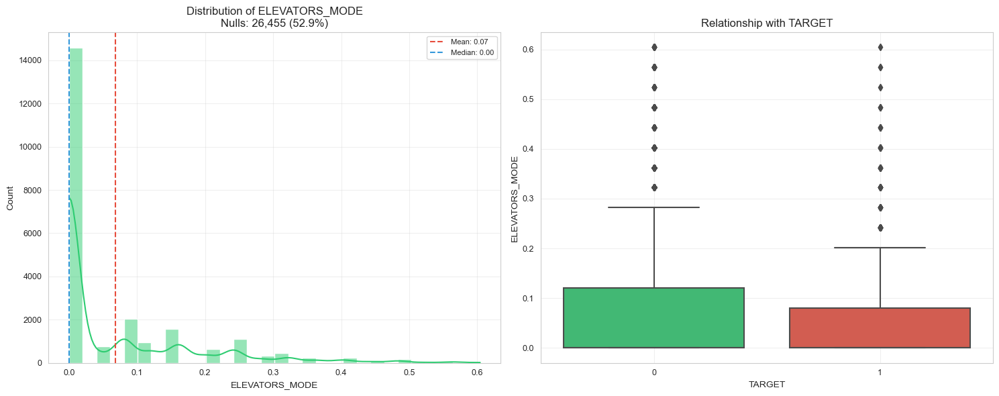


Processing batch 11 of 41


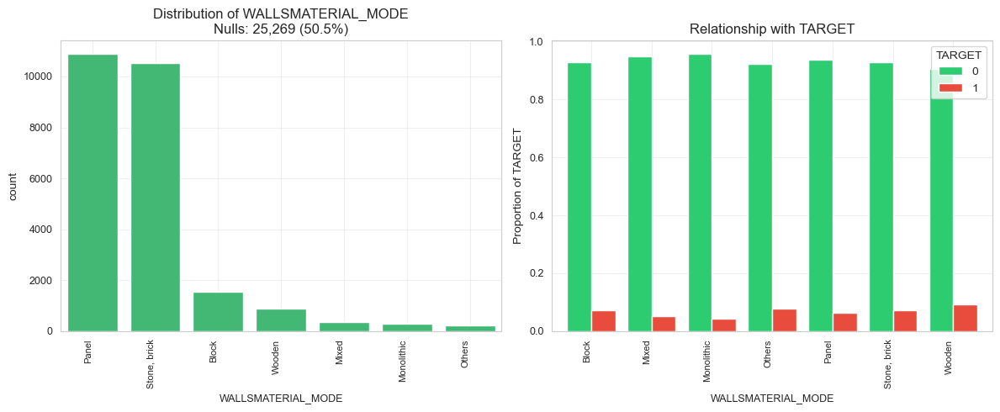

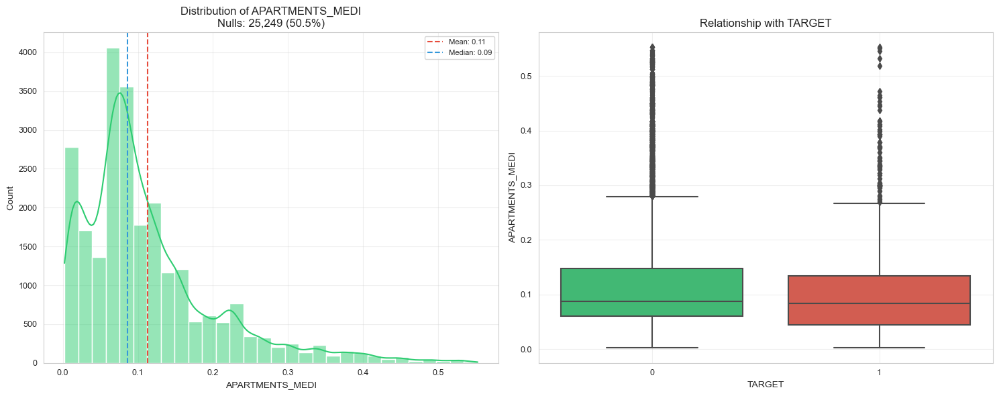

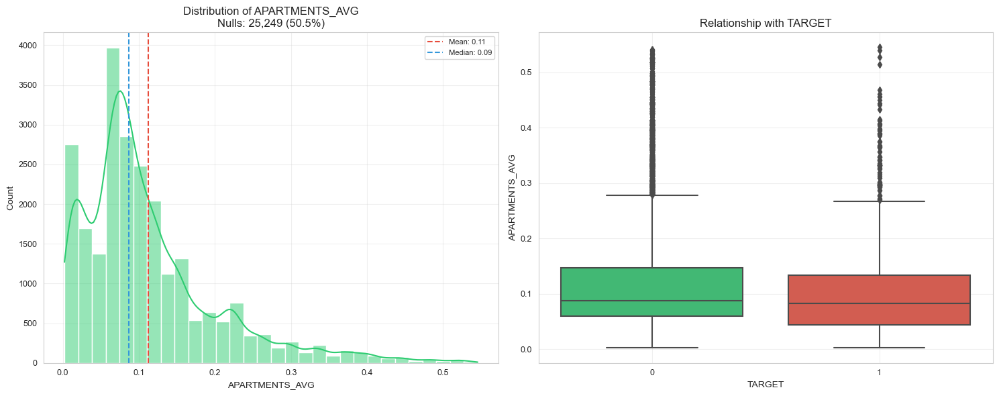


Processing batch 12 of 41


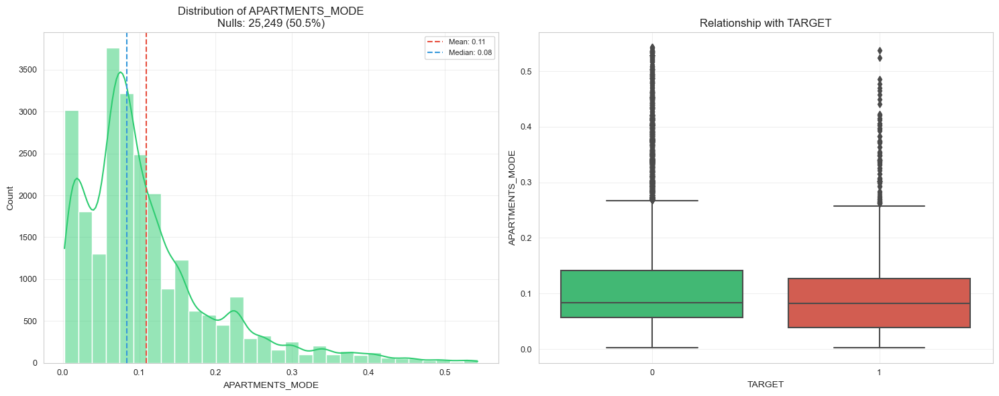

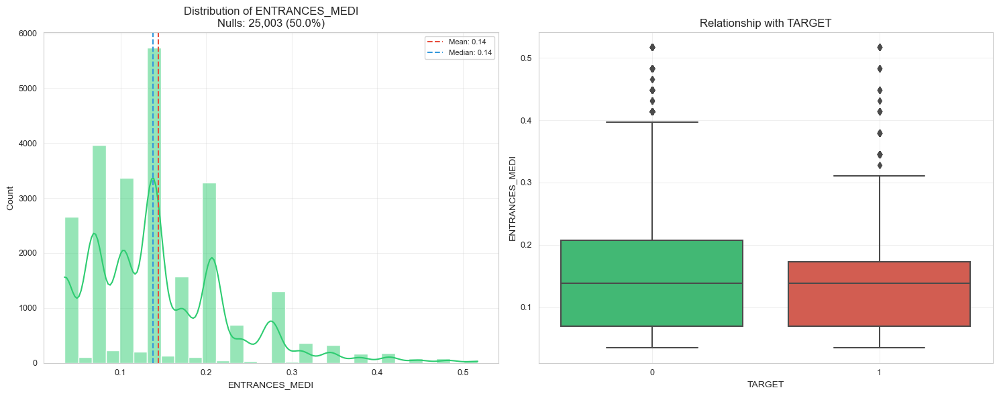

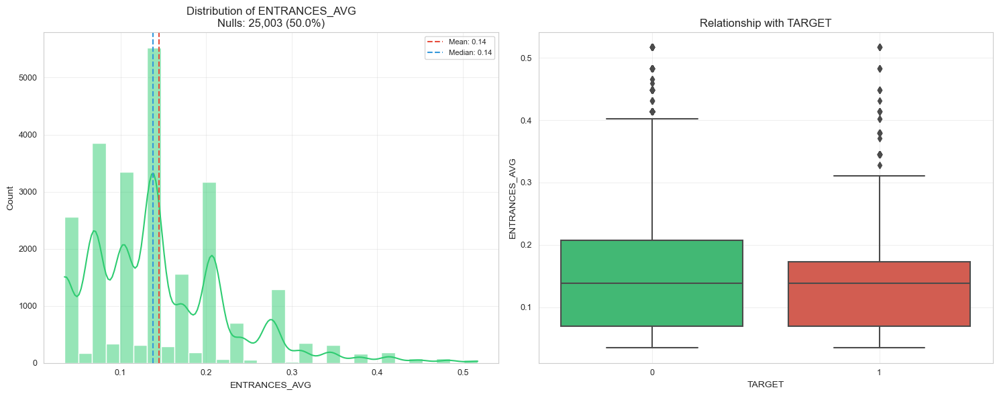


Processing batch 13 of 41


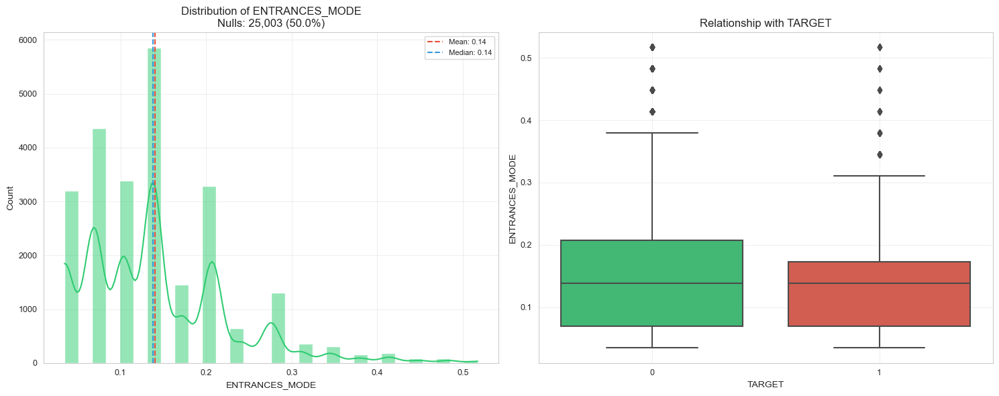

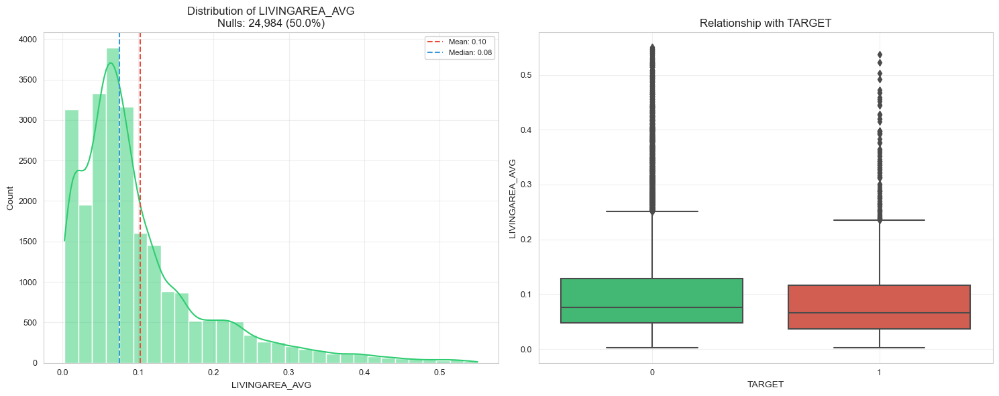

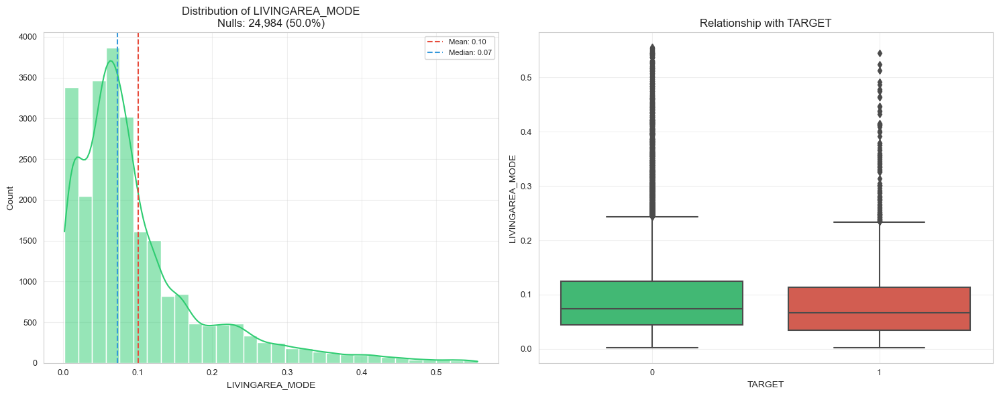


Processing batch 14 of 41


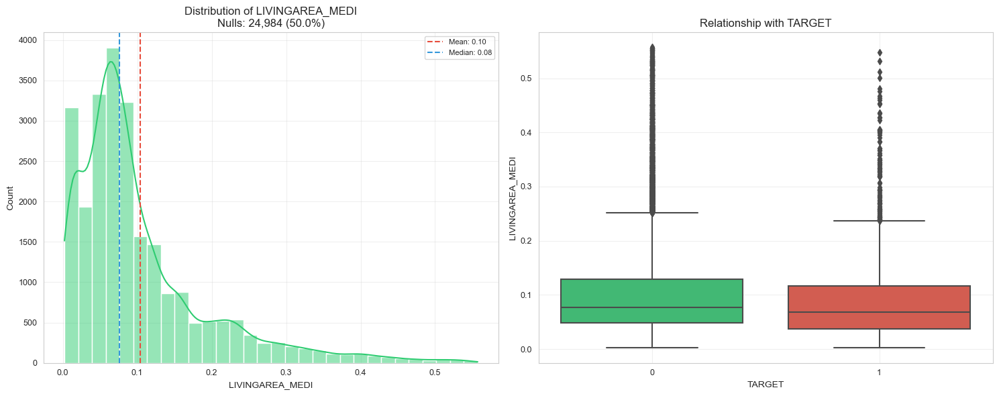

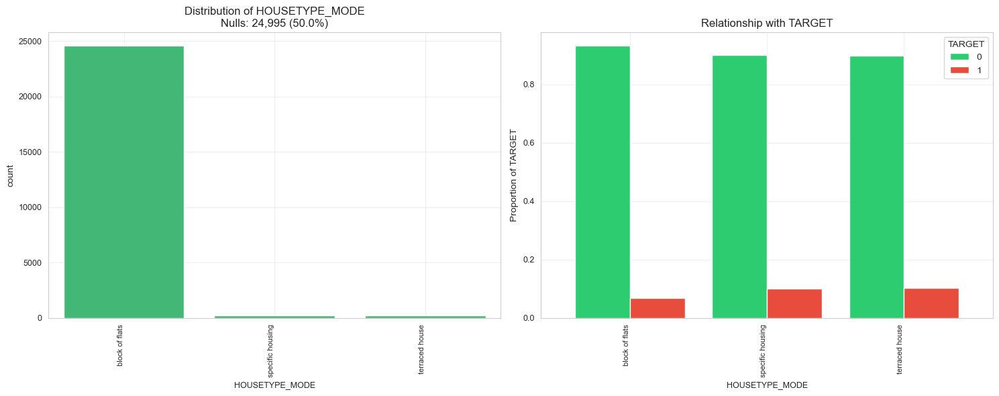

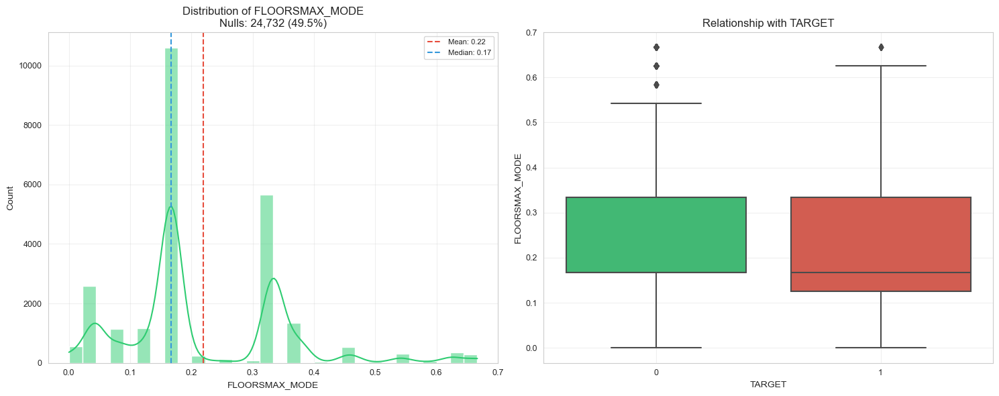


Processing batch 15 of 41


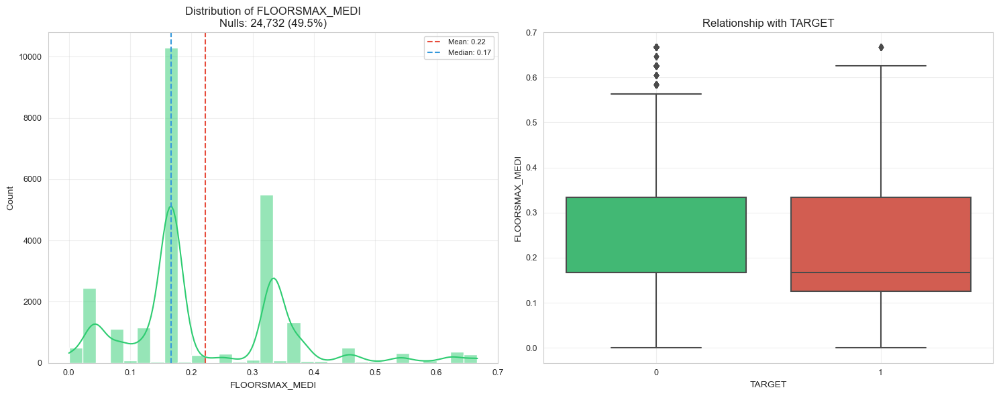

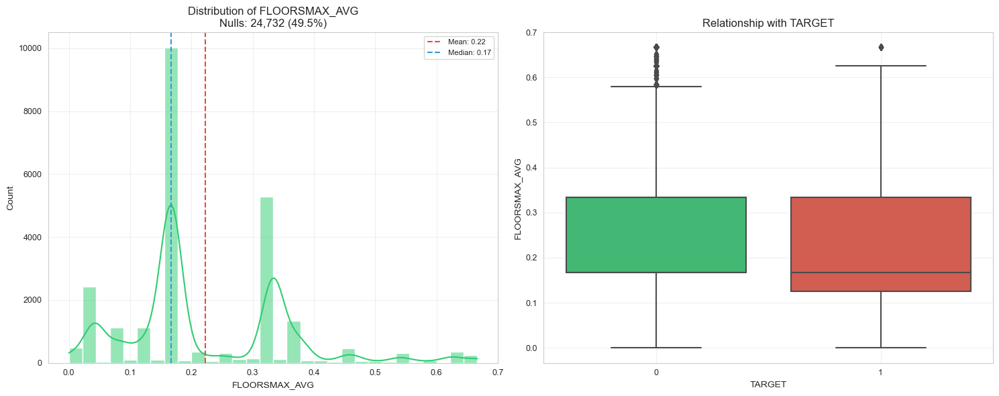

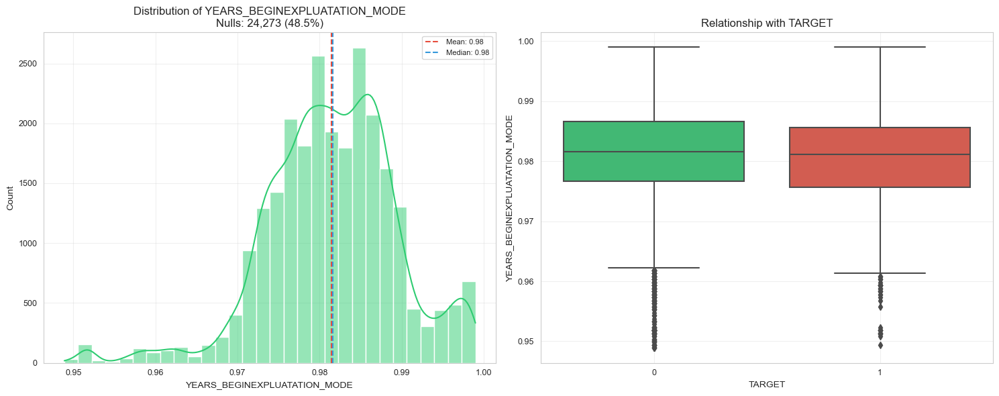


Processing batch 16 of 41


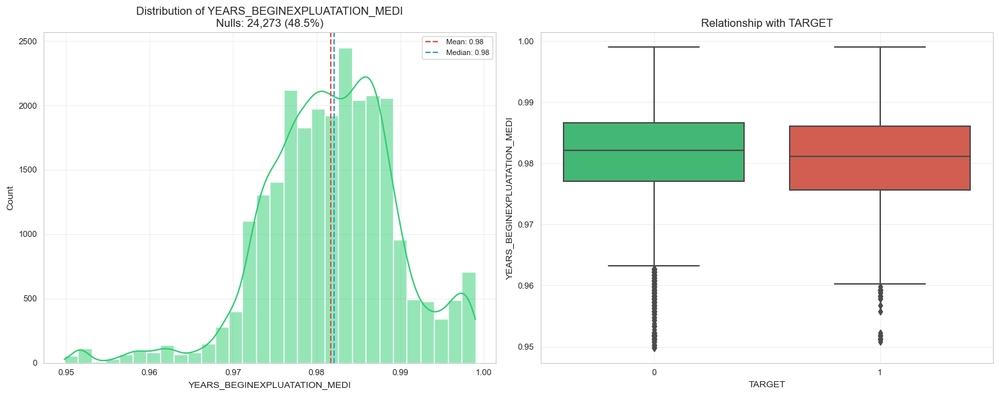

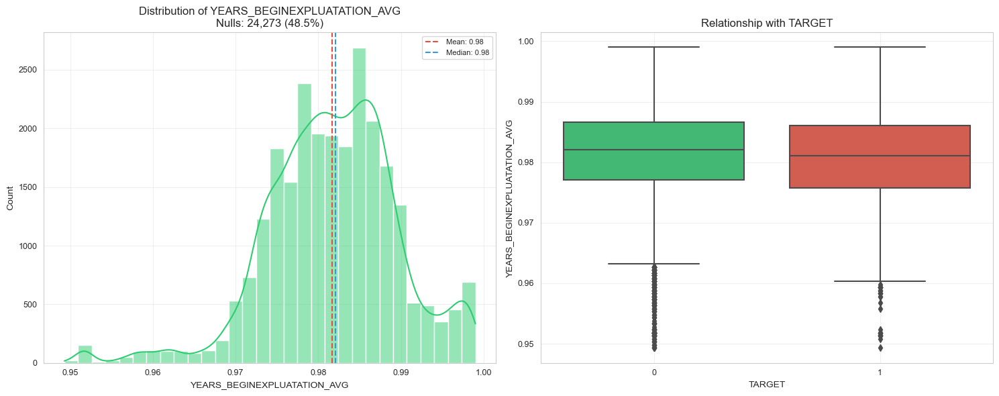

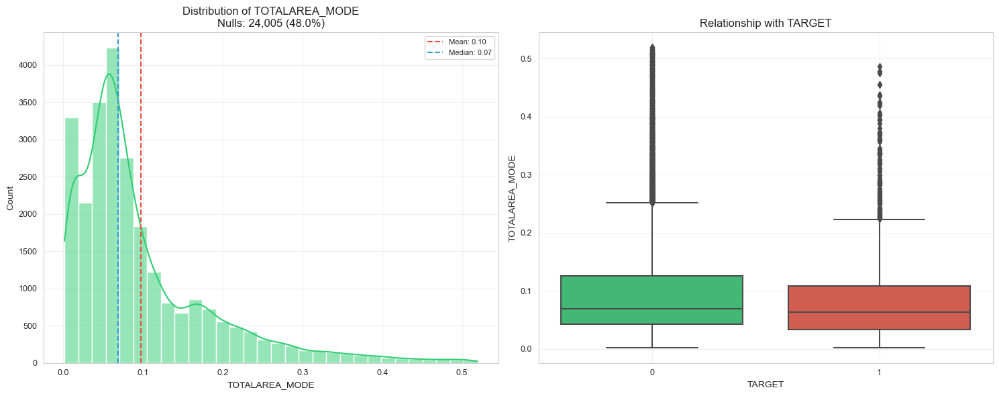


Processing batch 17 of 41


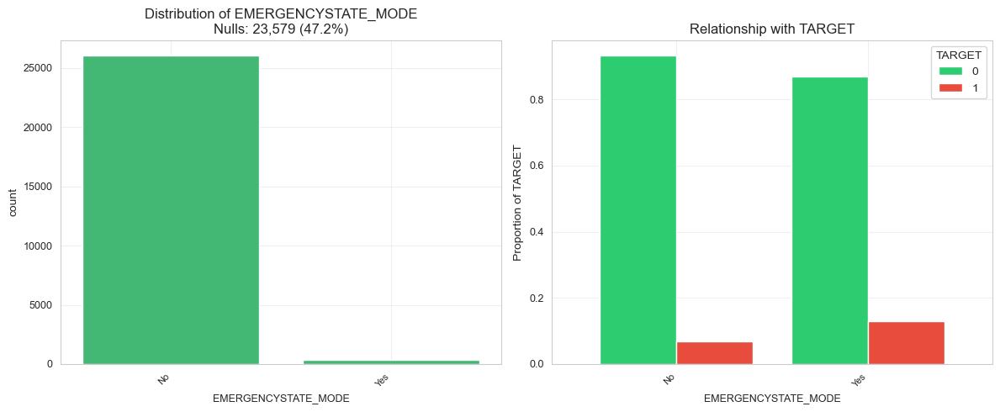

Error in OCCUPATION_TYPE: operands could not be broadcast together with shape (18,) (15,)


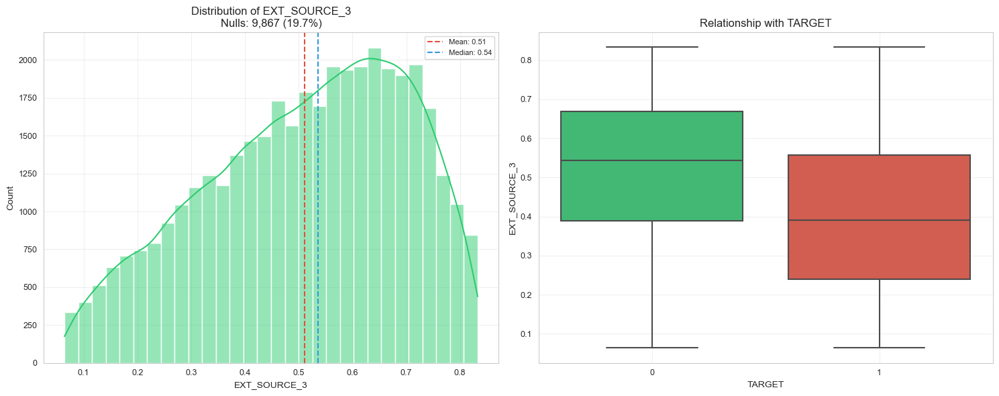


Processing batch 18 of 41


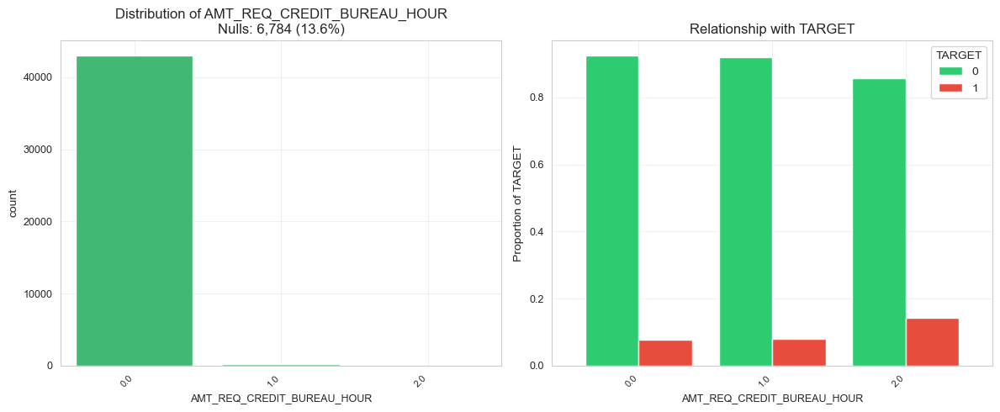

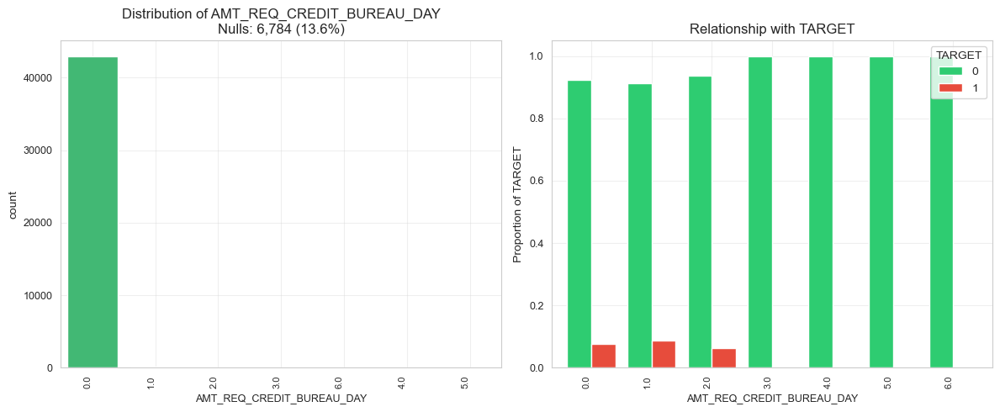

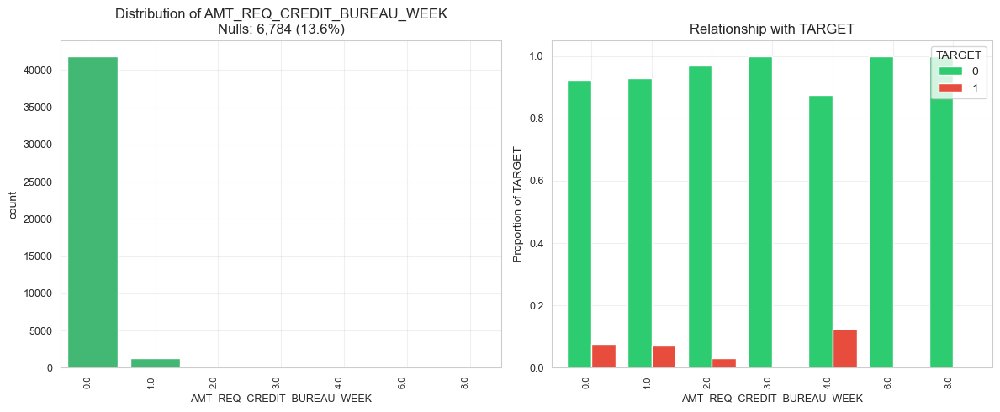


Processing batch 19 of 41


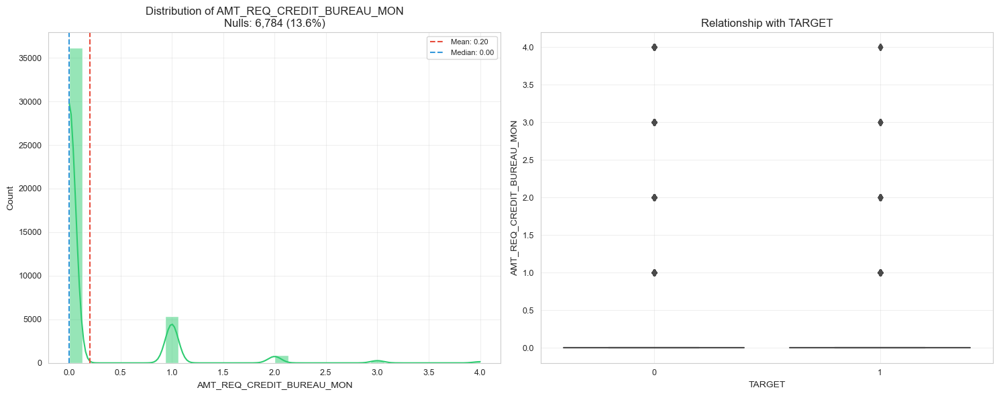

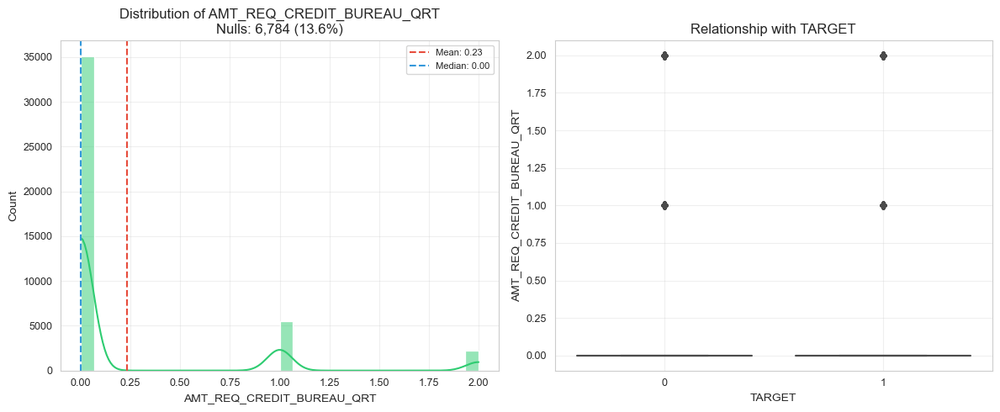

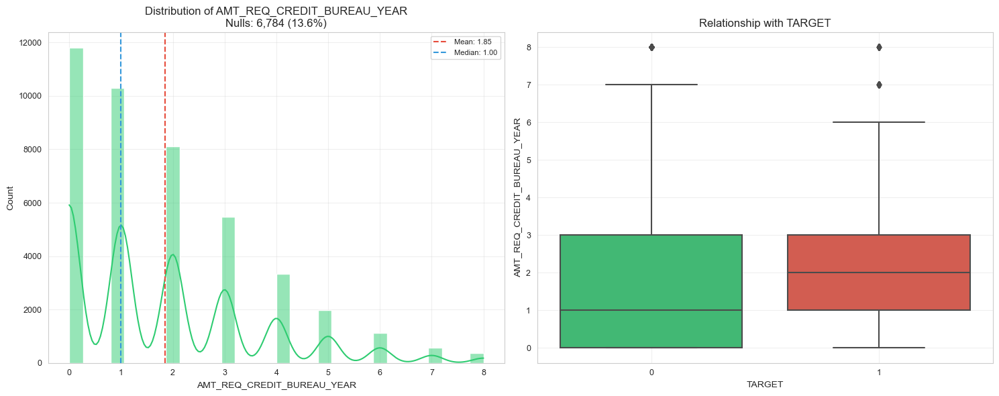


Processing batch 20 of 41


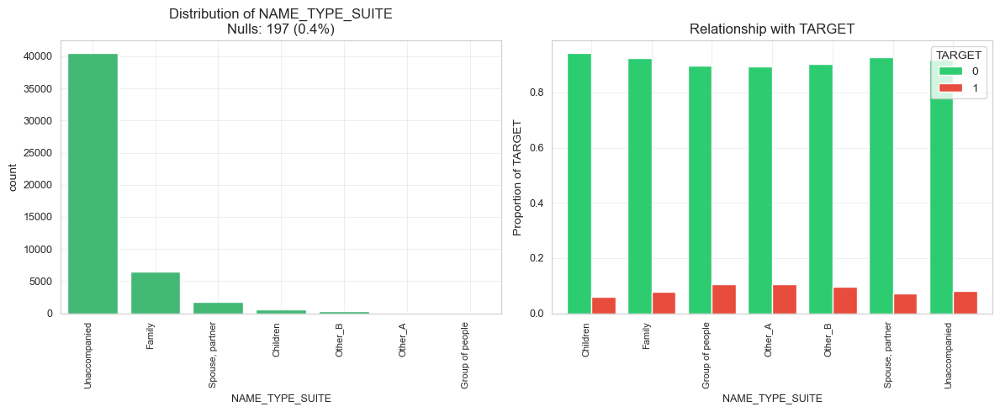

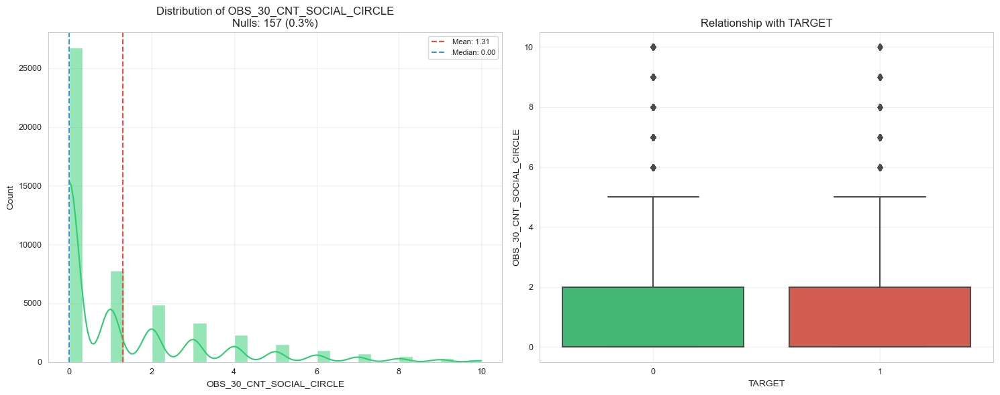

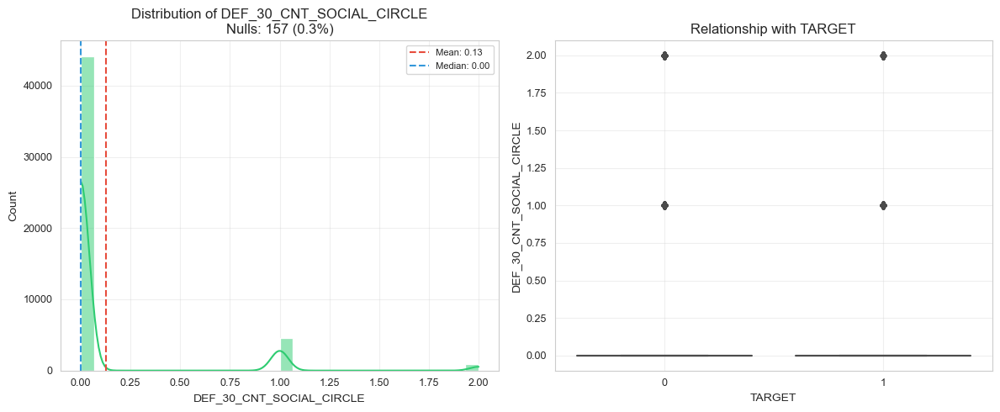


Processing batch 21 of 41


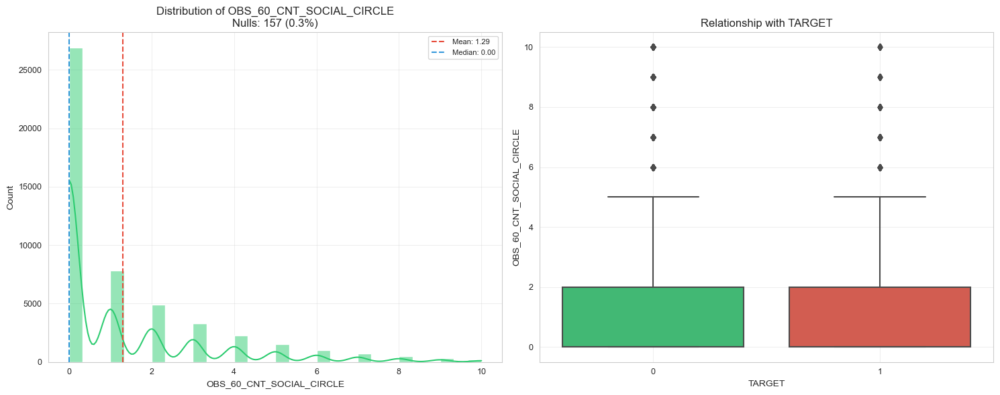

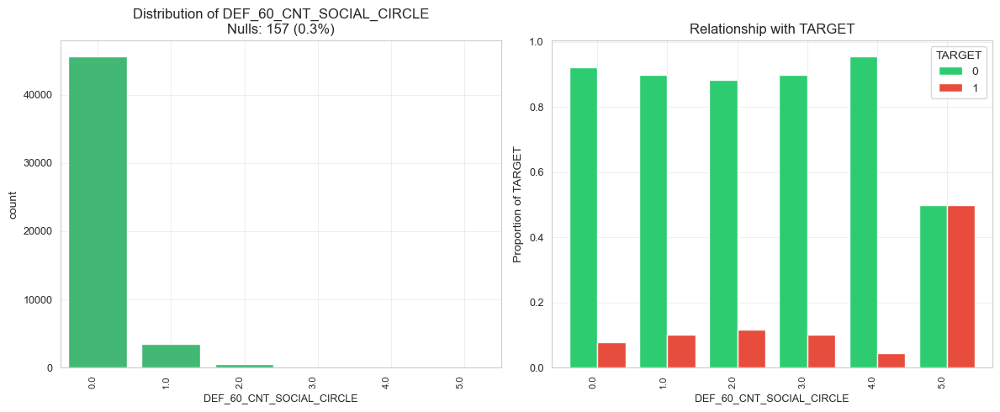

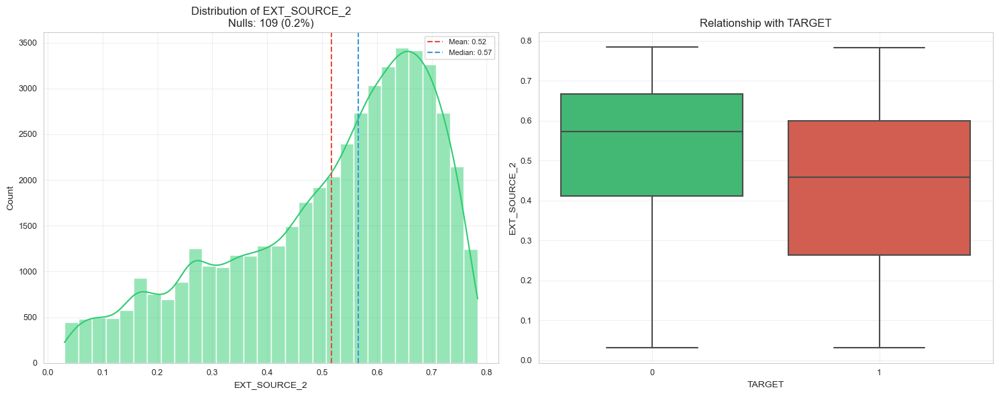


Processing batch 22 of 41


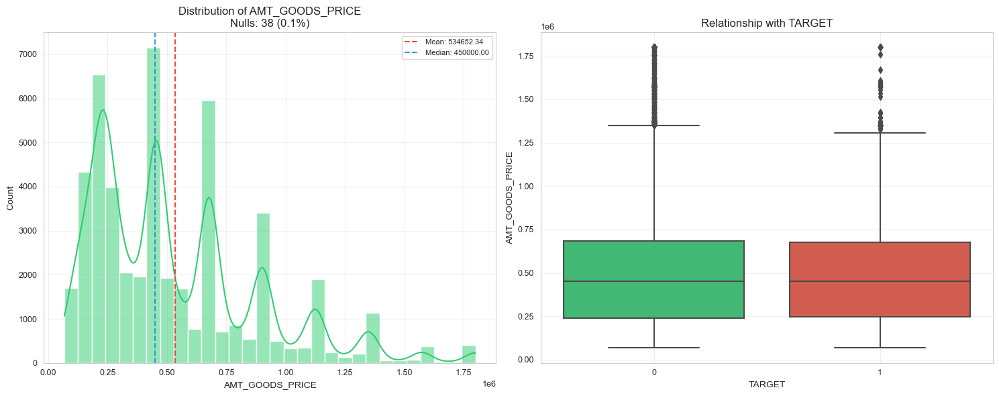

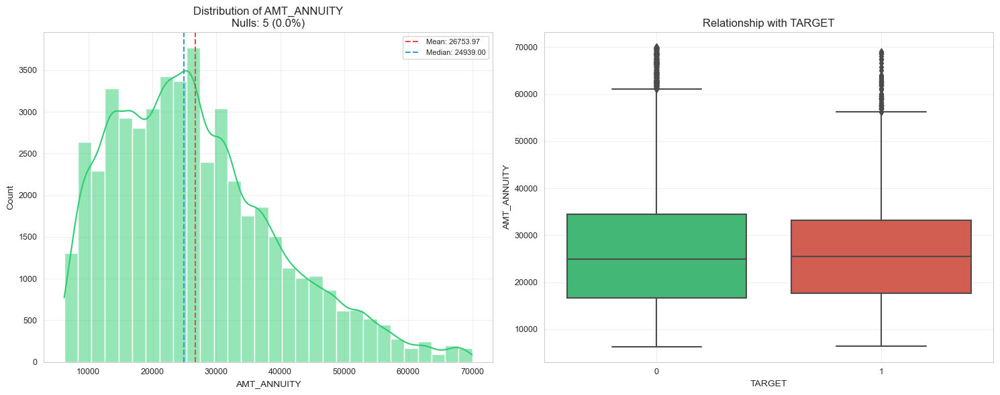

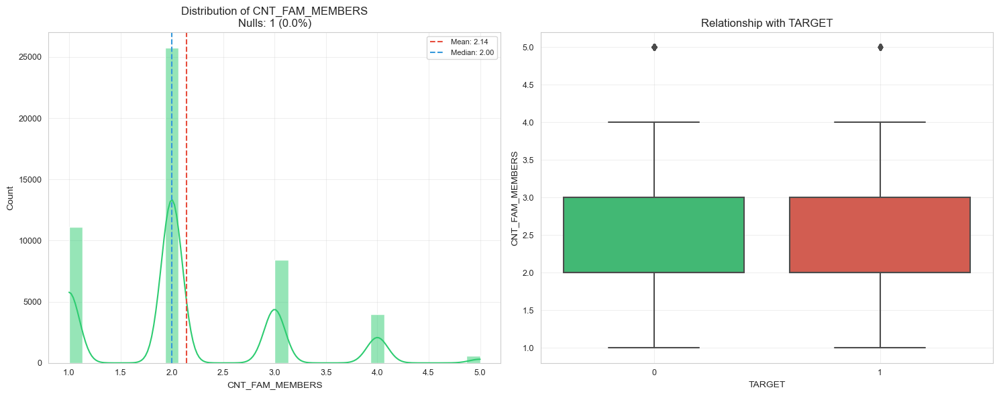


Processing batch 23 of 41


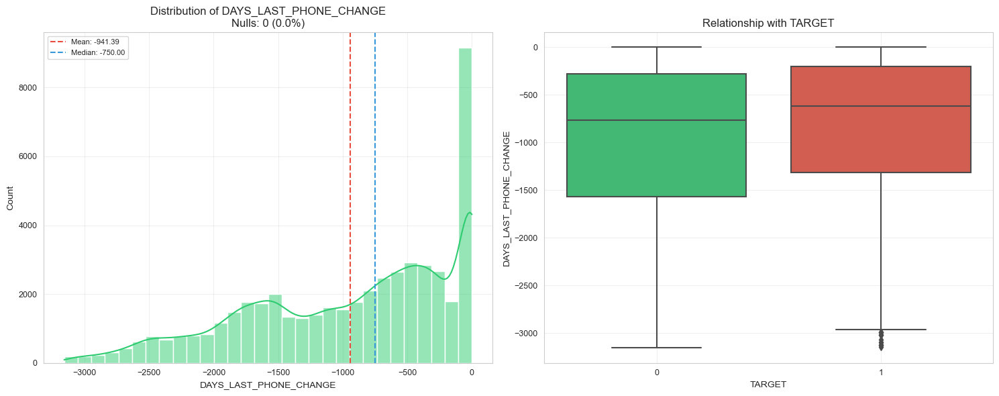

Error in CNT_CHILDREN: operands could not be broadcast together with shape (15,) (13,)


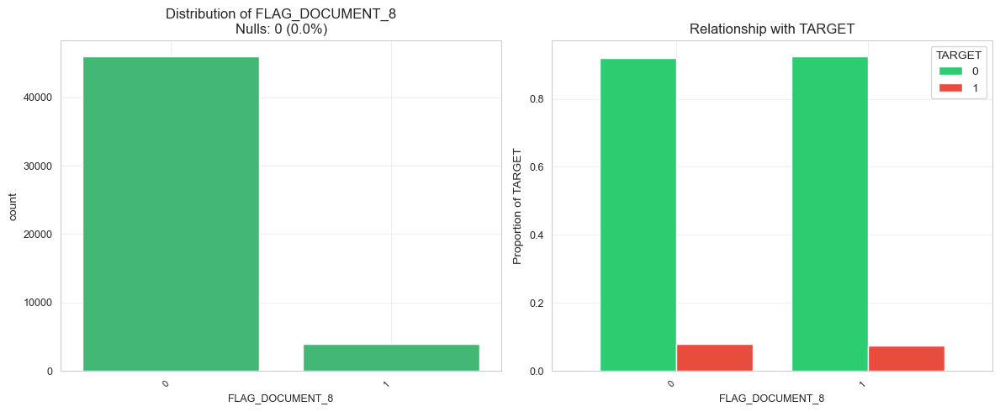


Processing batch 24 of 41


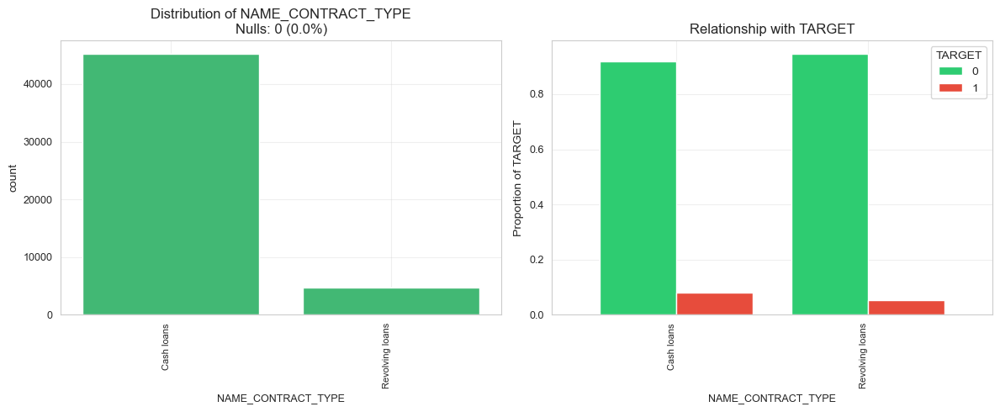

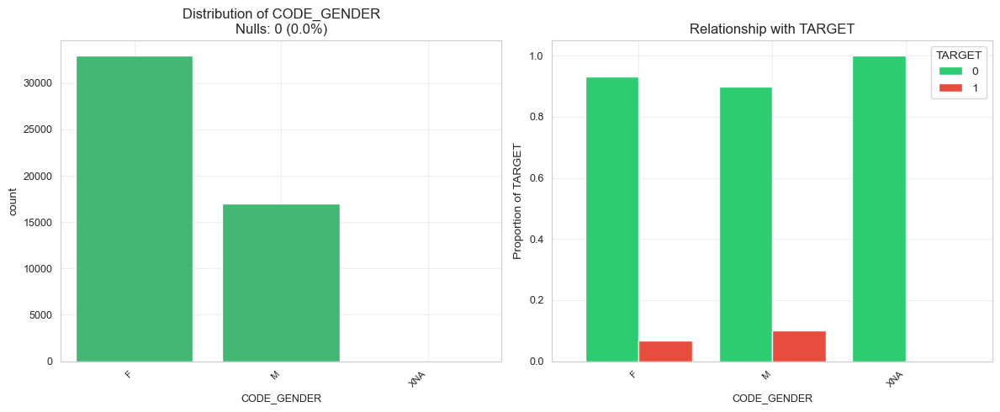

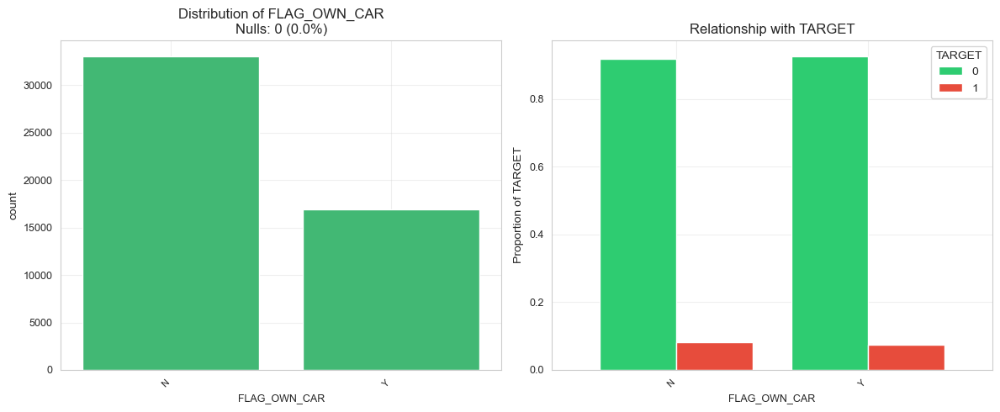


Processing batch 25 of 41


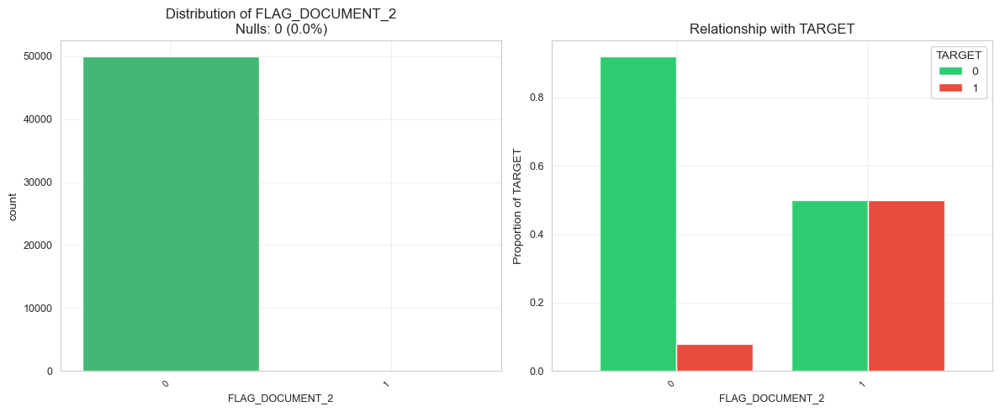

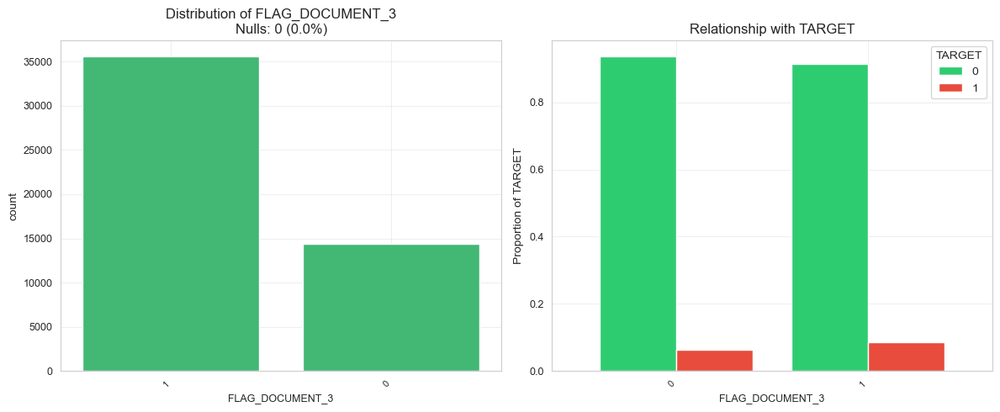

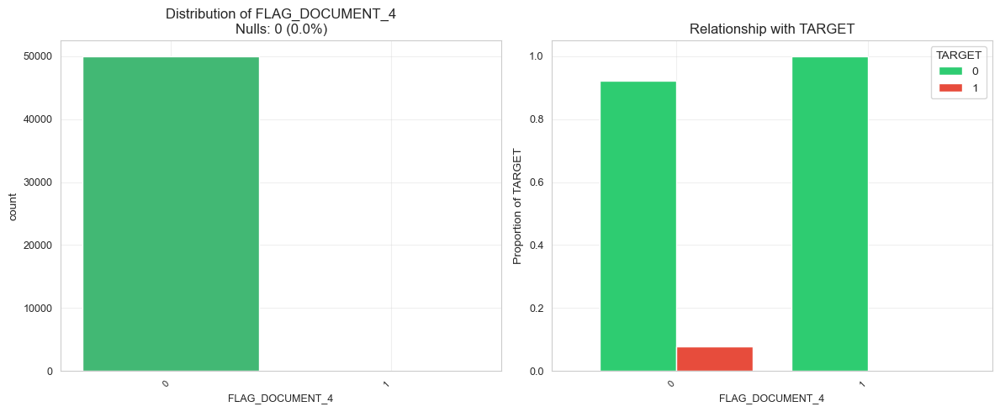


Processing batch 26 of 41


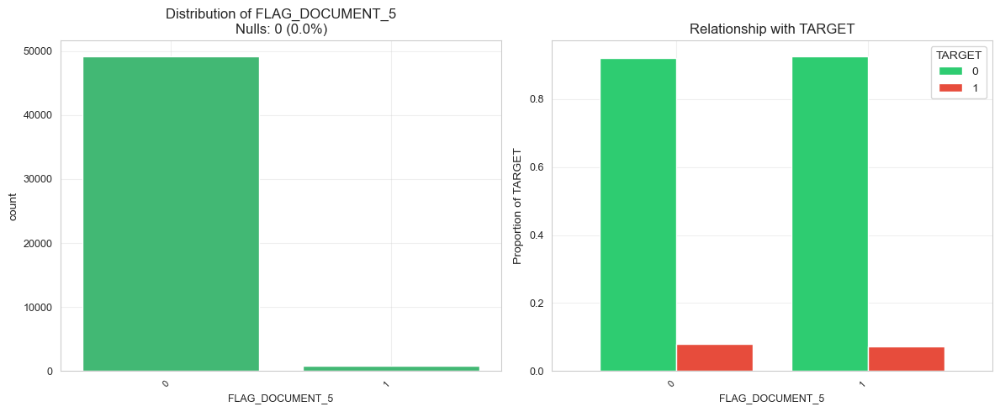

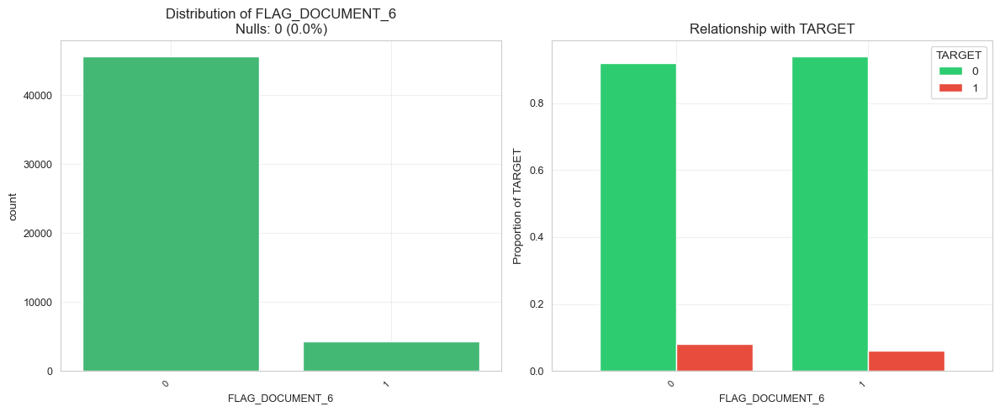

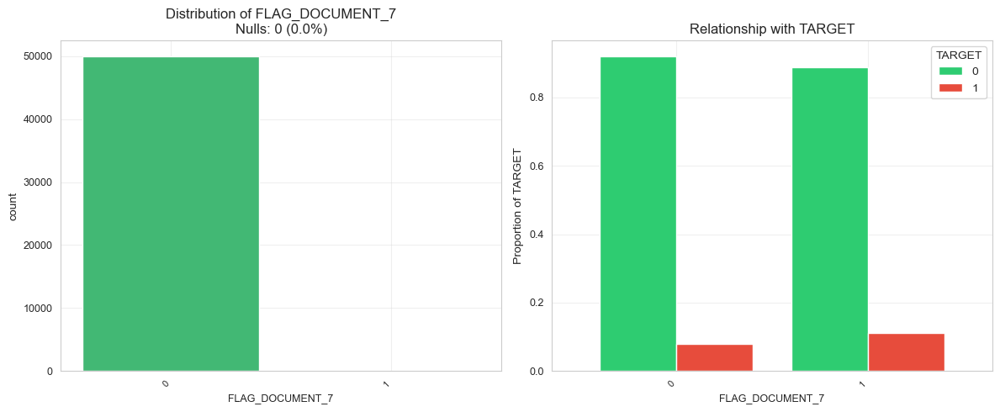


Processing batch 27 of 41


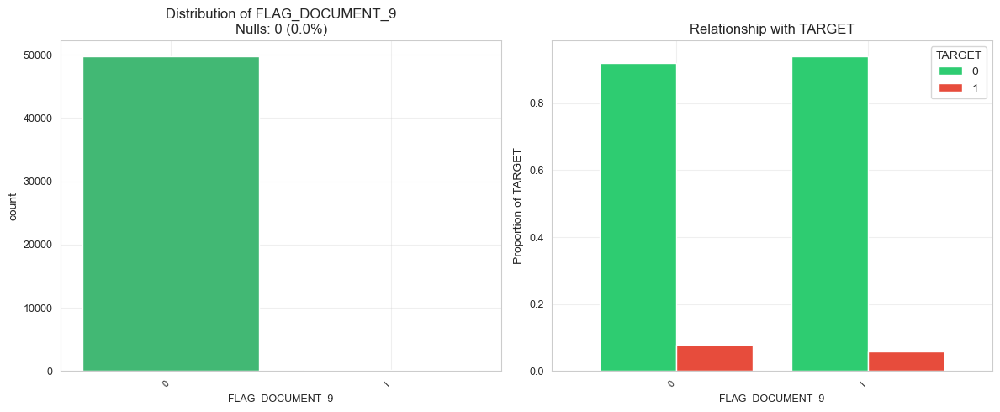

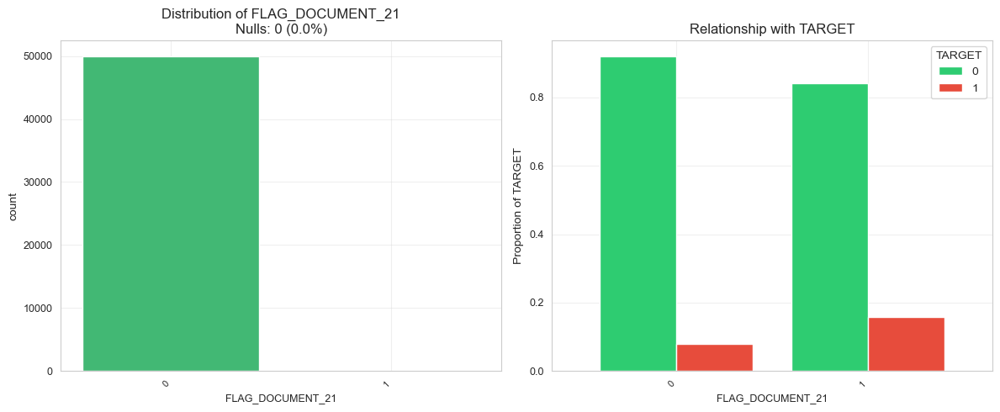

Error in FLAG_DOCUMENT_10: Length of passed values is 2, index implies 4.

Processing batch 28 of 41


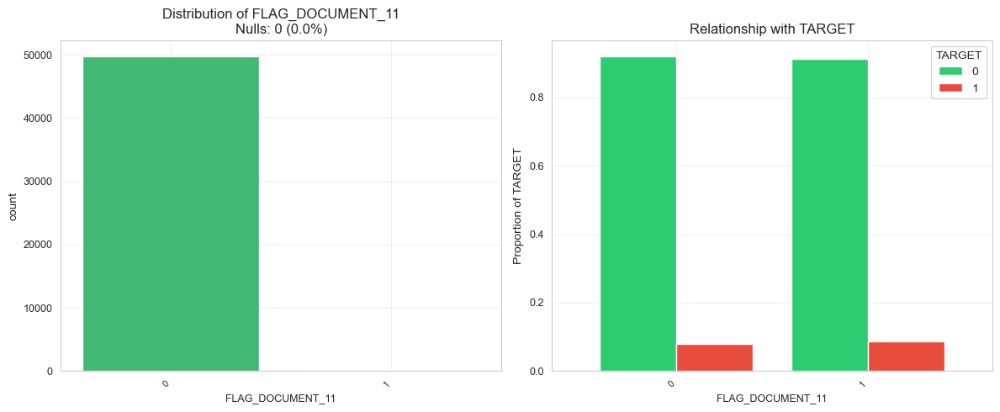

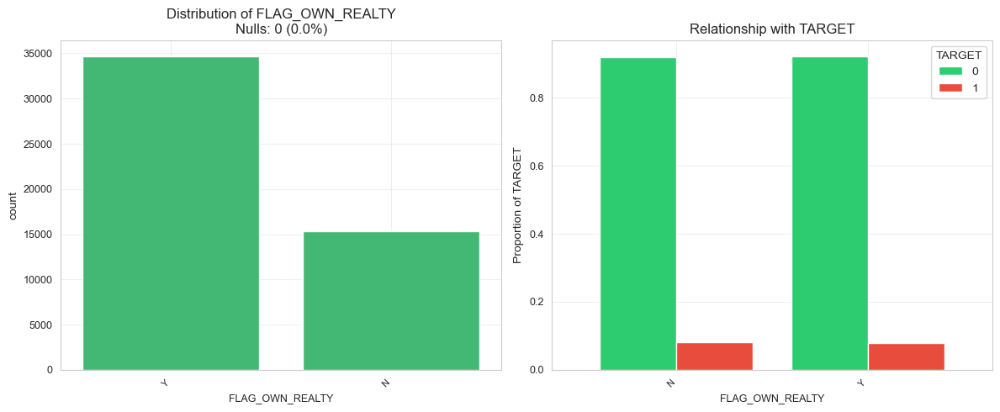

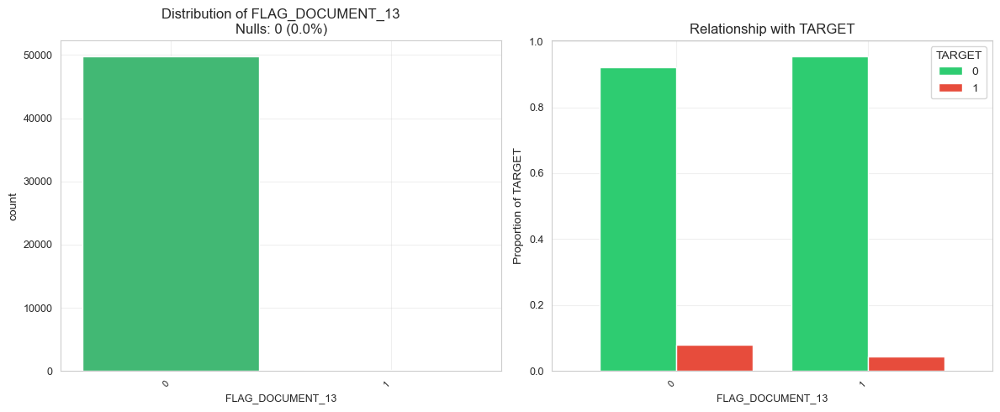


Processing batch 29 of 41


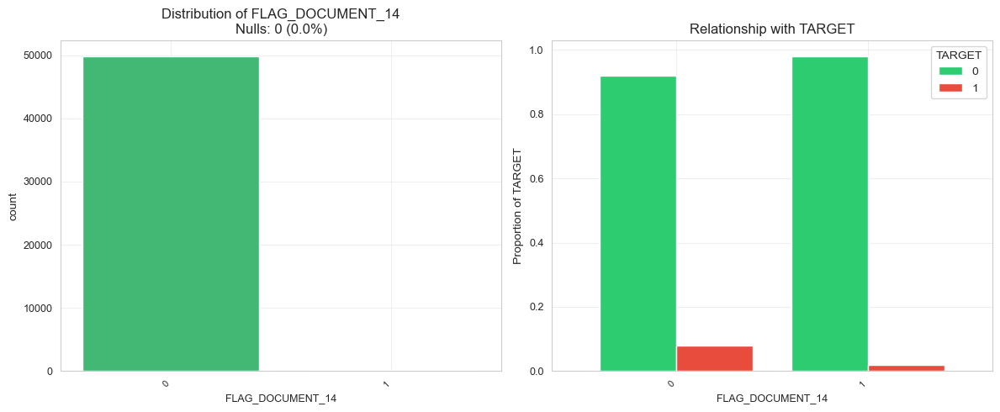

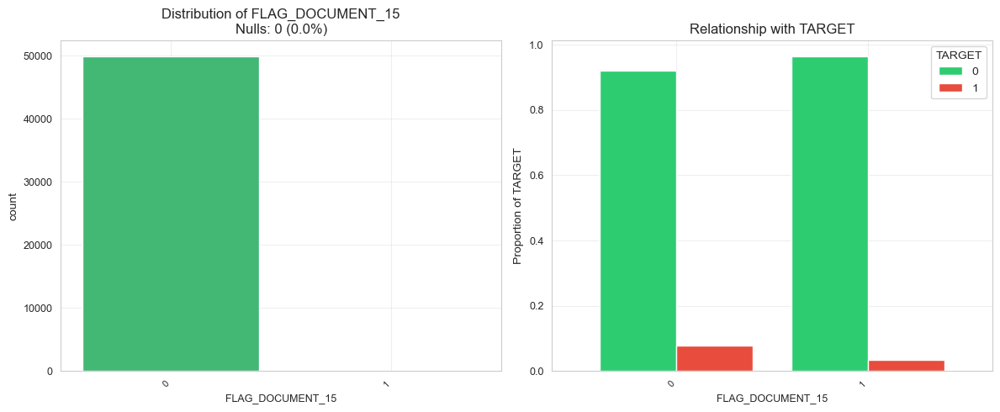

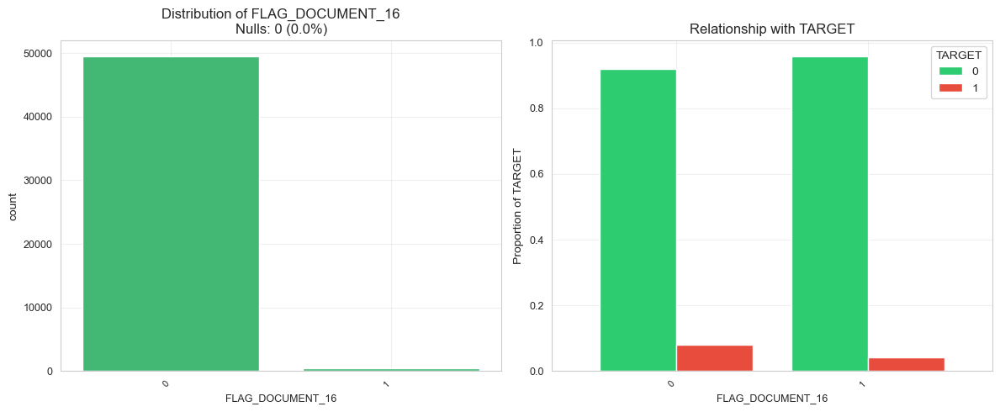


Processing batch 30 of 41


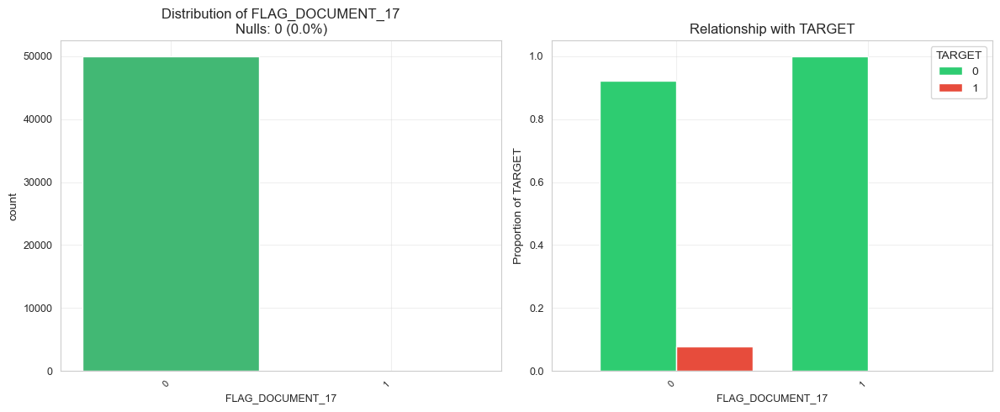

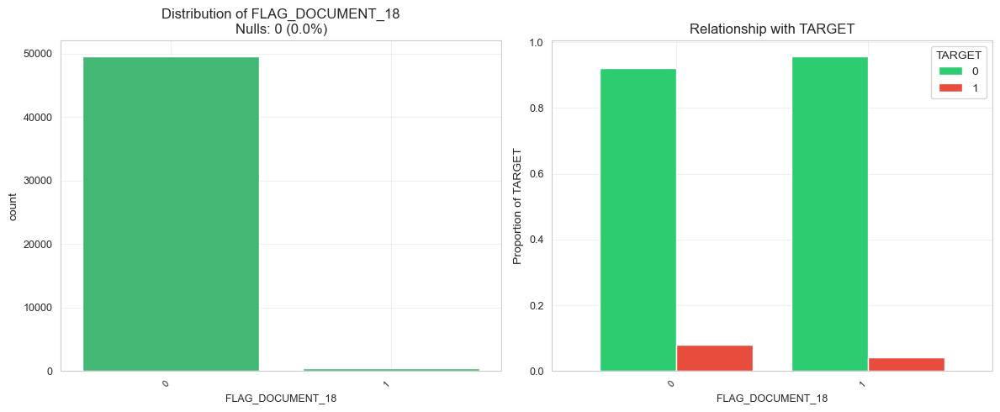

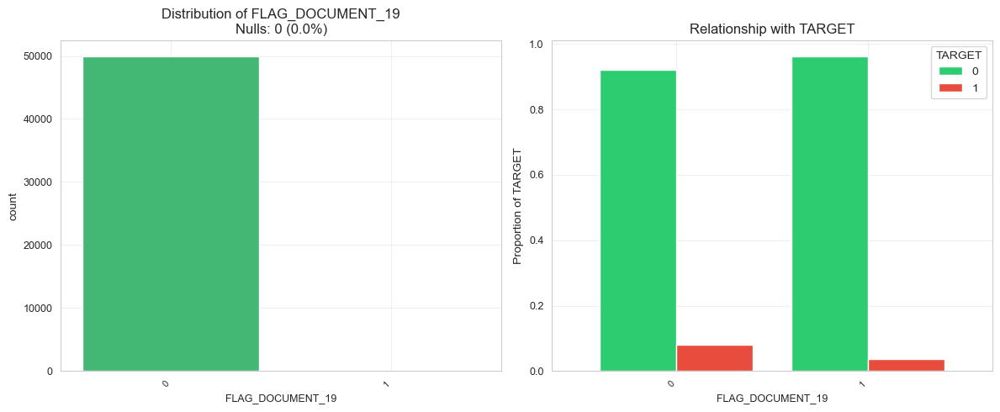


Processing batch 31 of 41


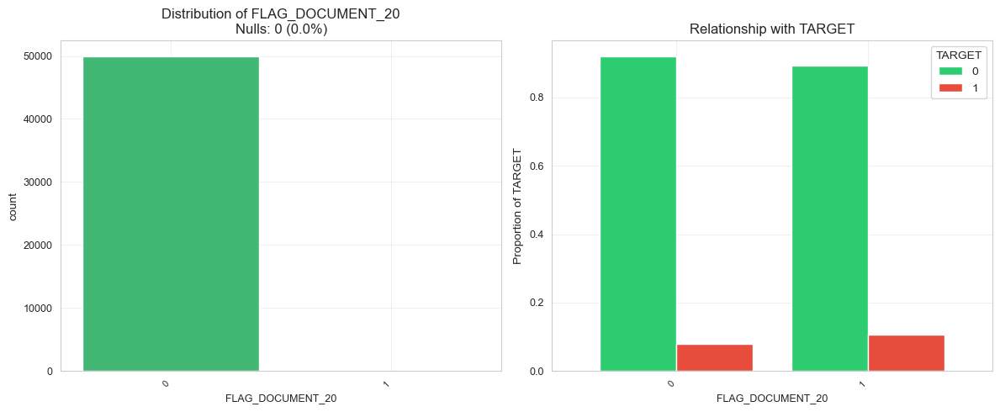

Error in FLAG_DOCUMENT_12: Length of passed values is 2, index implies 4.


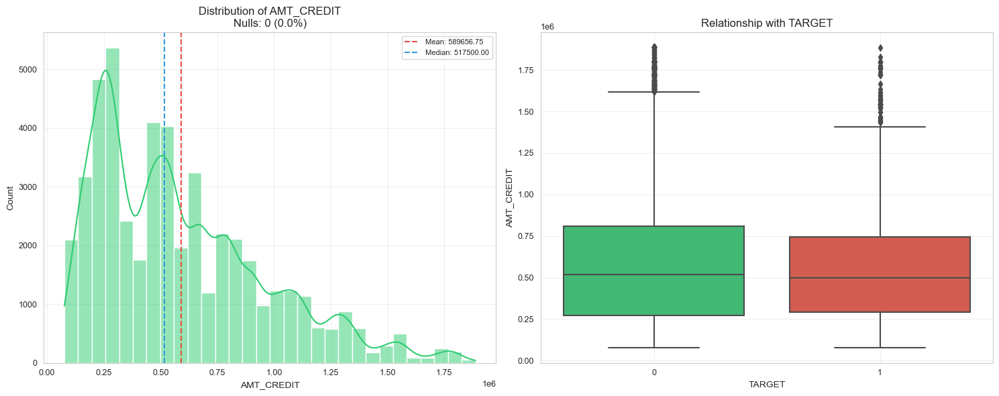


Processing batch 32 of 41


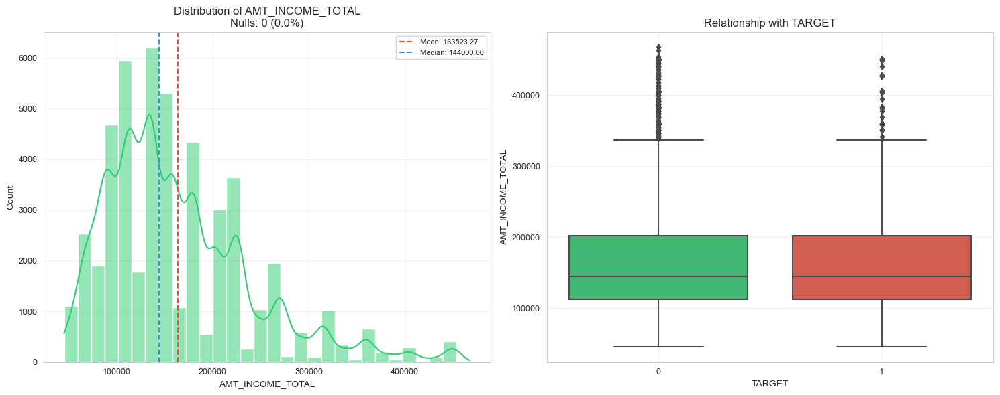

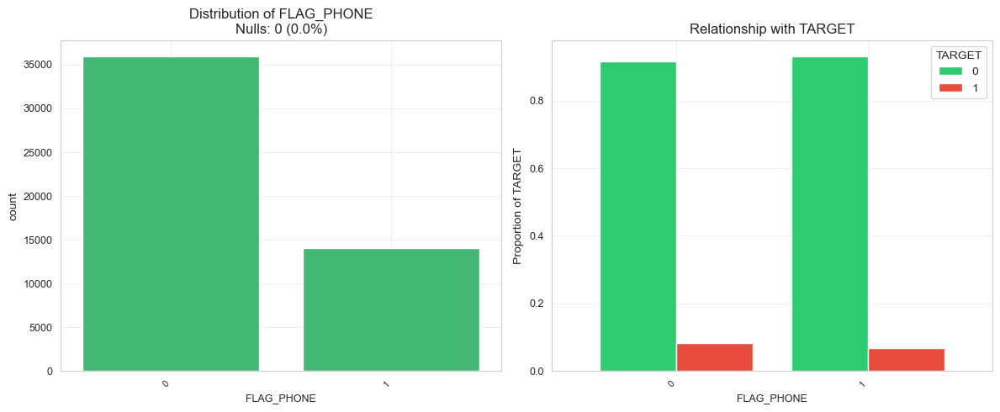

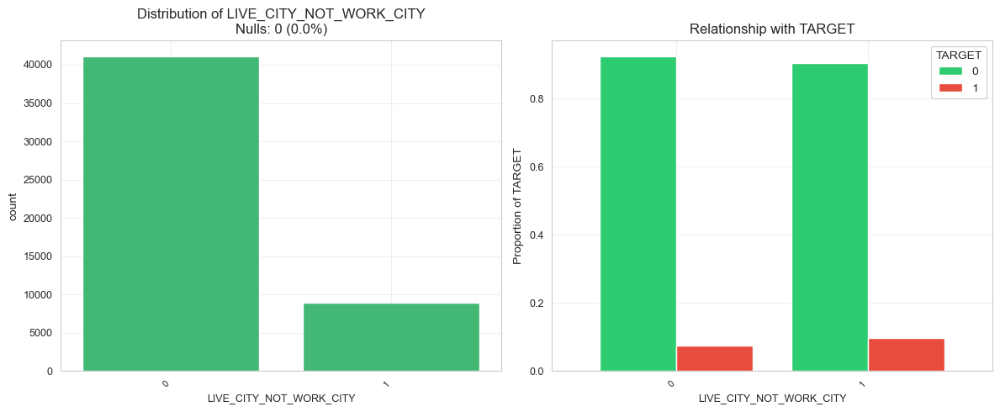


Processing batch 33 of 41


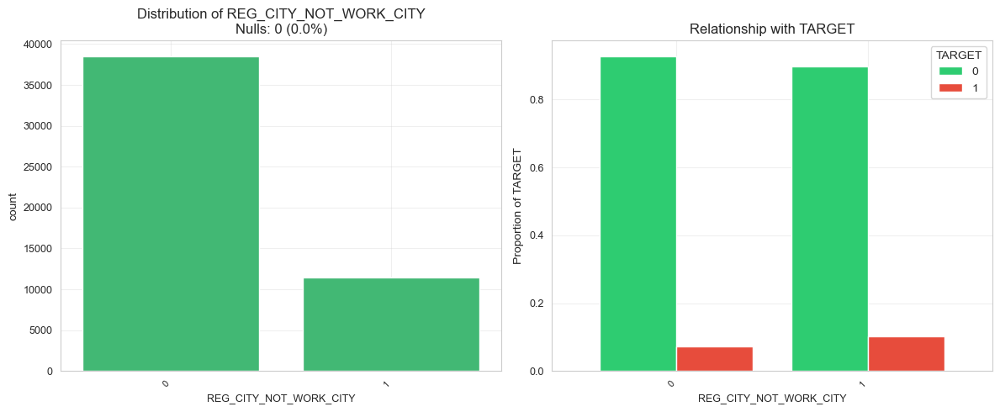

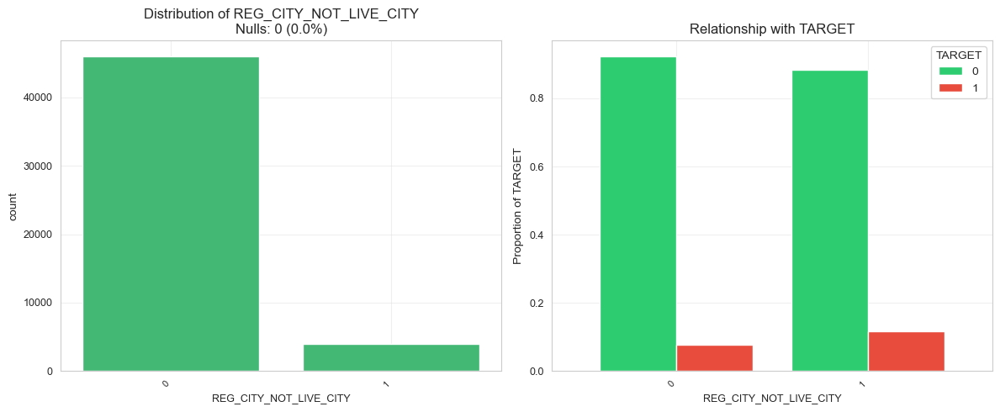

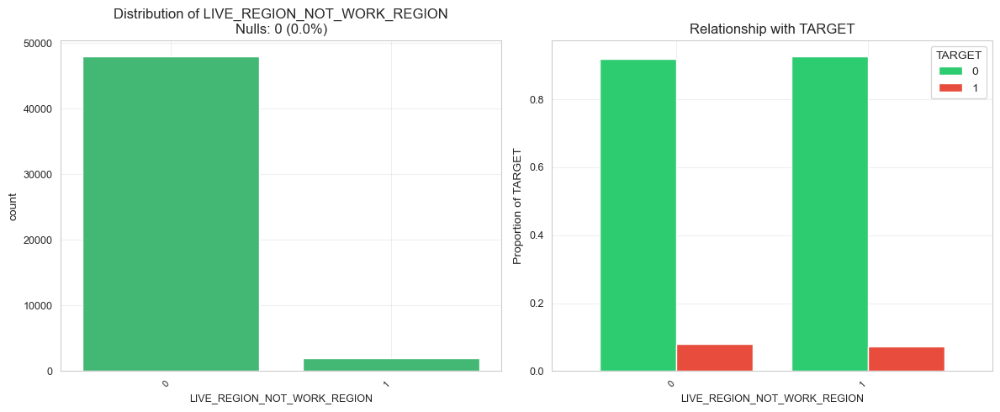


Processing batch 34 of 41


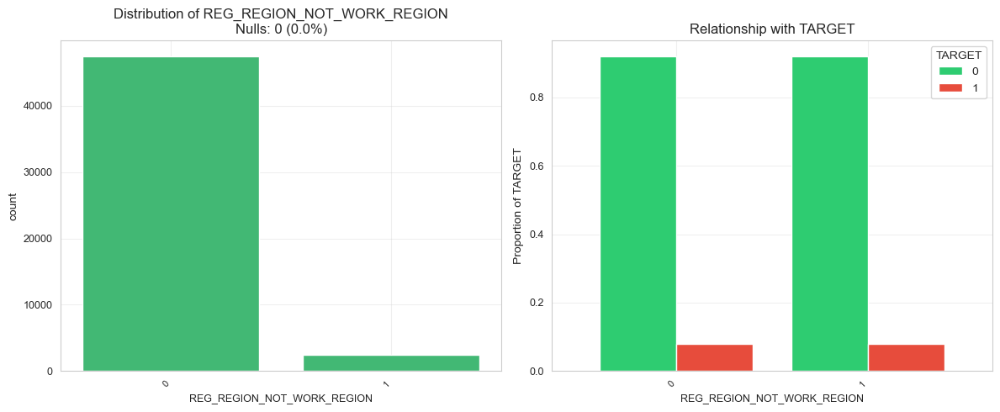

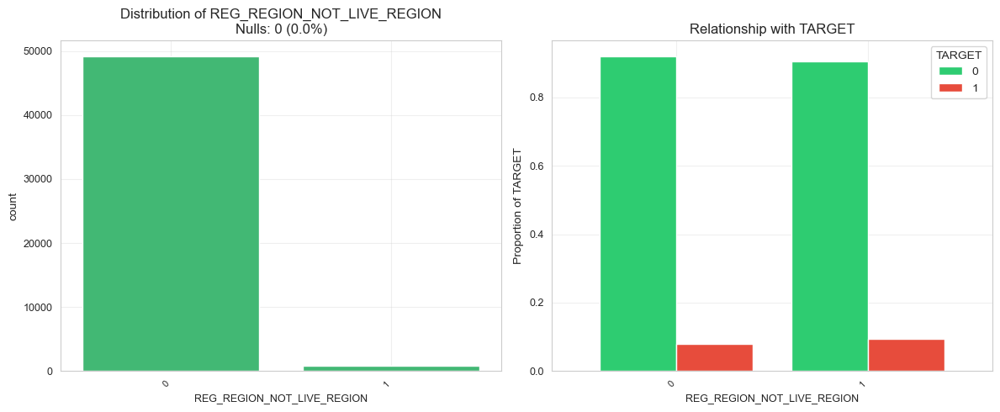

Error in HOUR_APPR_PROCESS_START: operands could not be broadcast together with shape (24,) (15,)

Processing batch 35 of 41


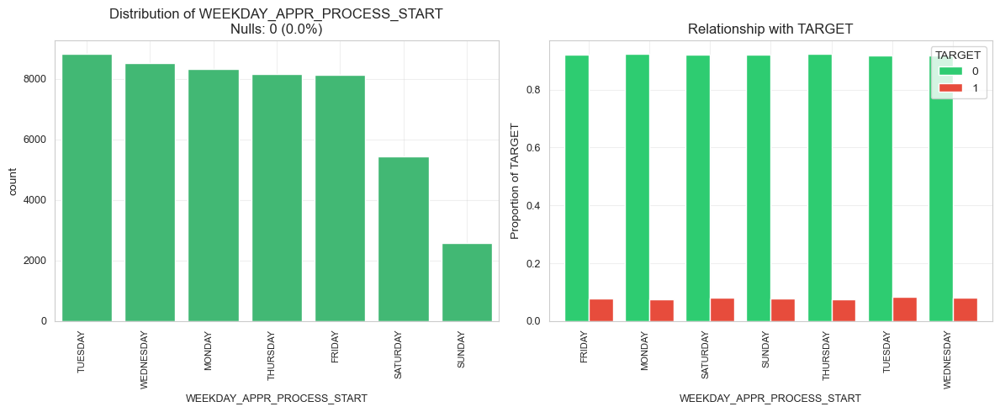

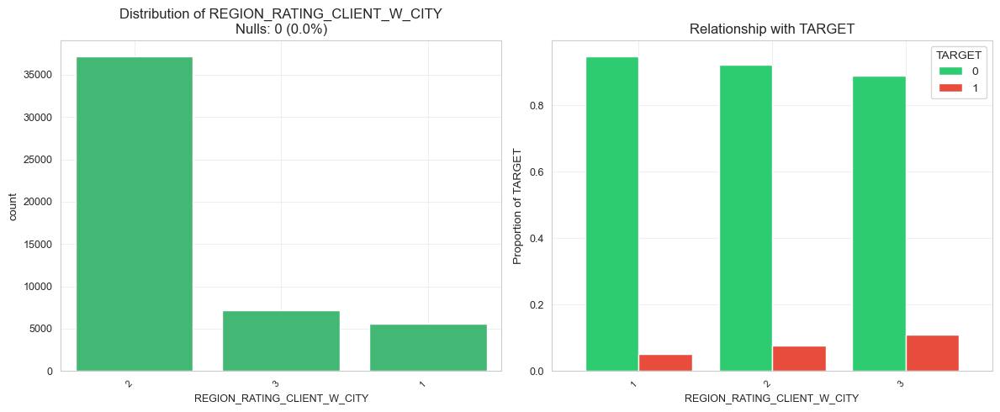

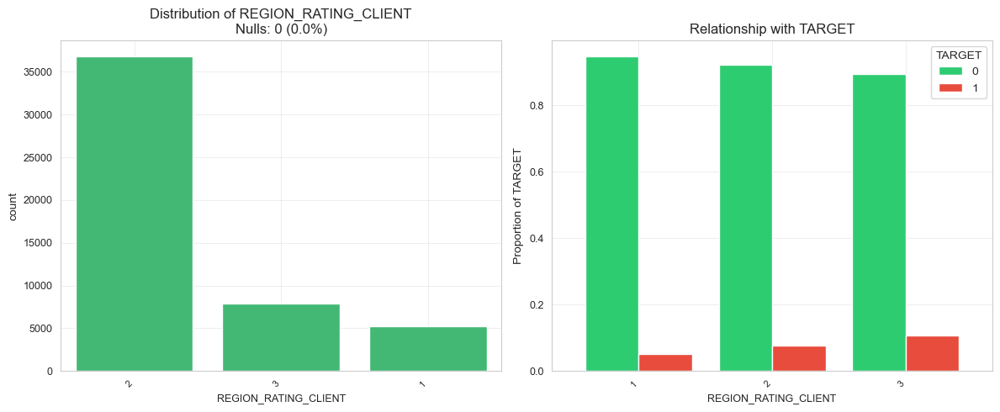


Processing batch 36 of 41


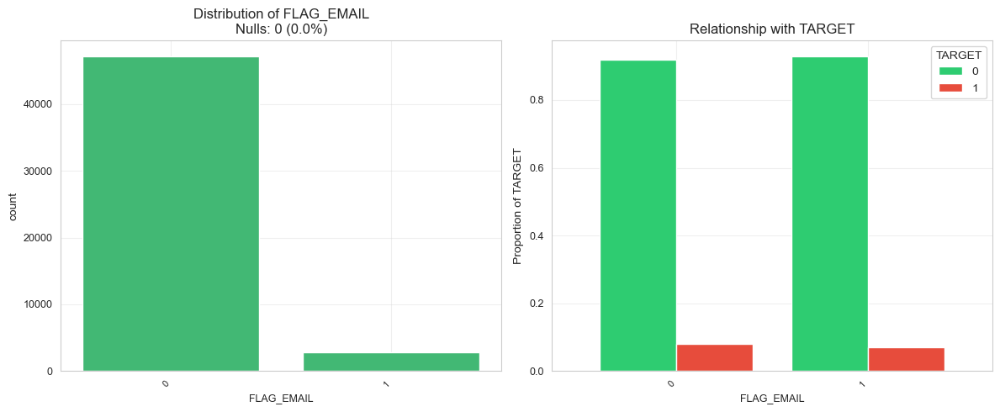

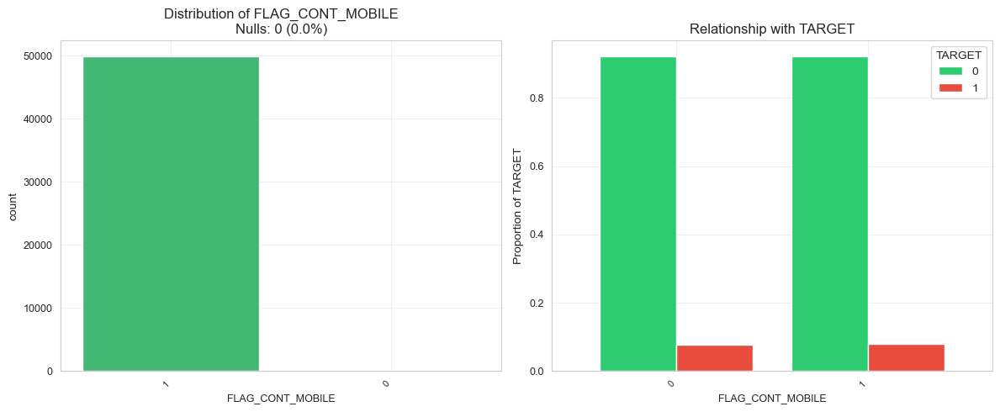

Error in ORGANIZATION_TYPE: operands could not be broadcast together with shape (58,) (15,)

Processing batch 37 of 41


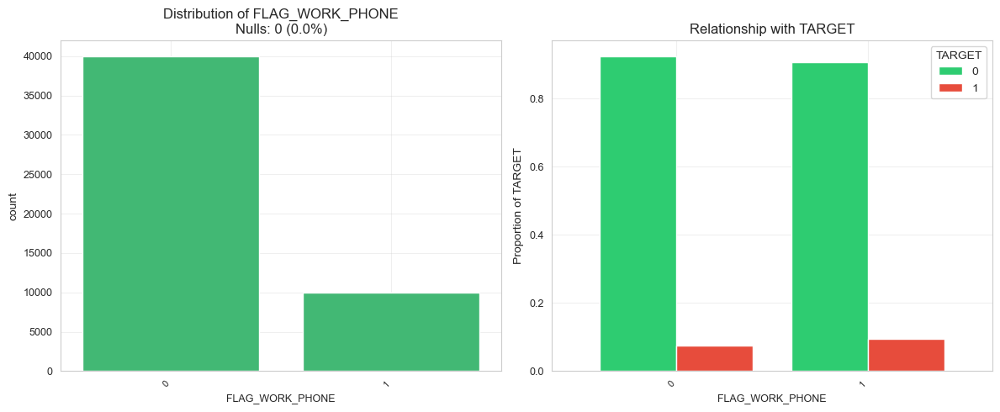

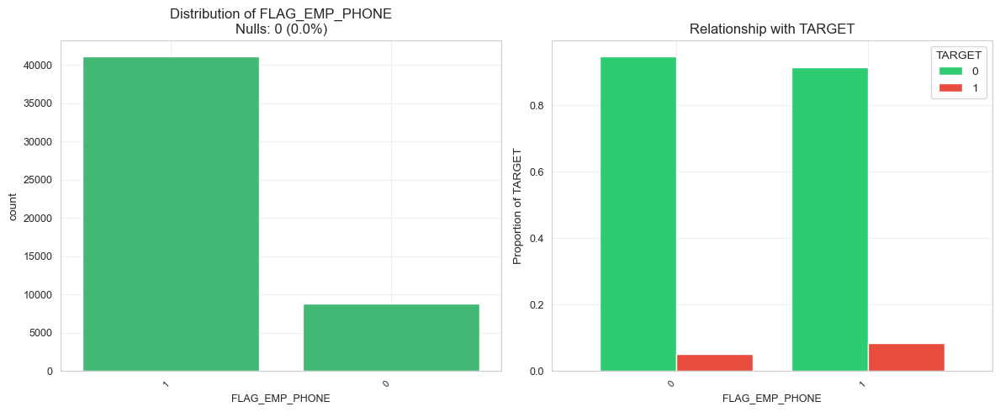

Error in FLAG_MOBIL: Length of passed values is 2, index implies 4.

Processing batch 38 of 41


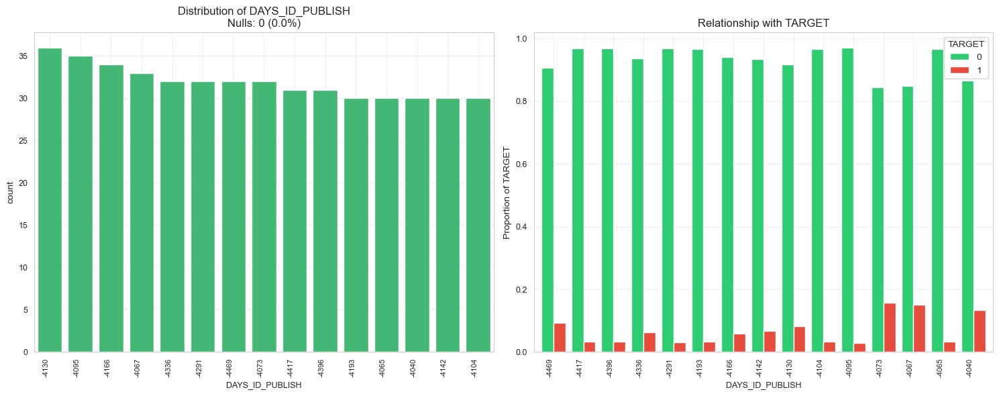

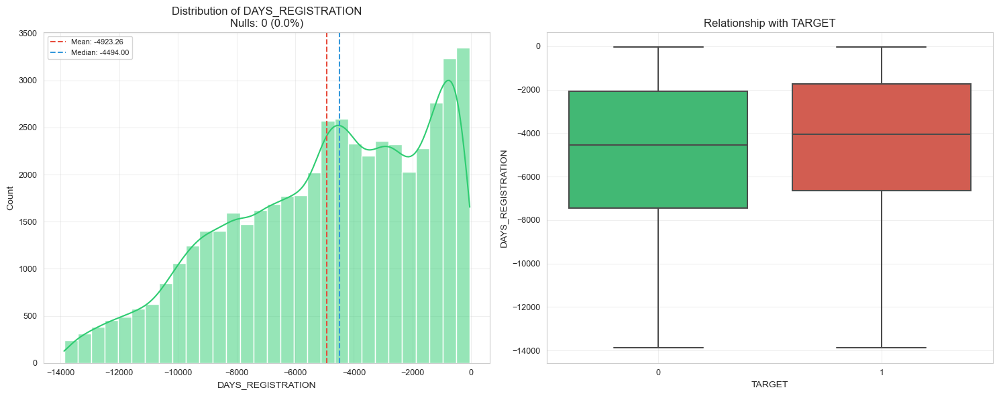

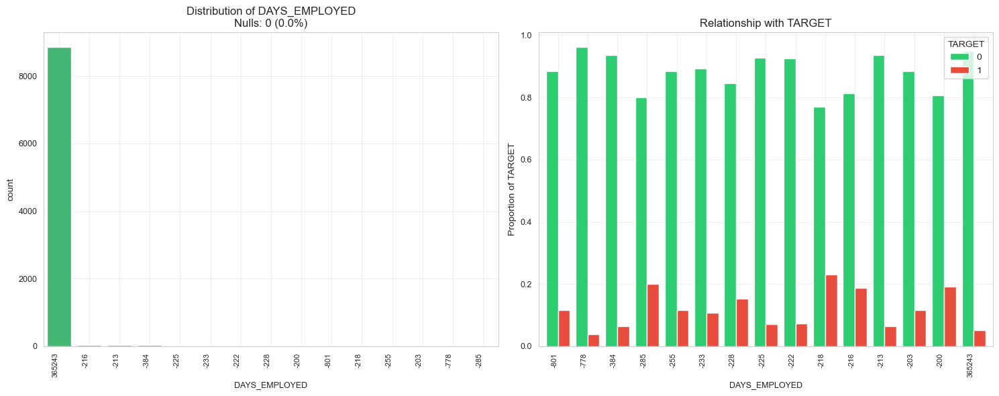


Processing batch 39 of 41


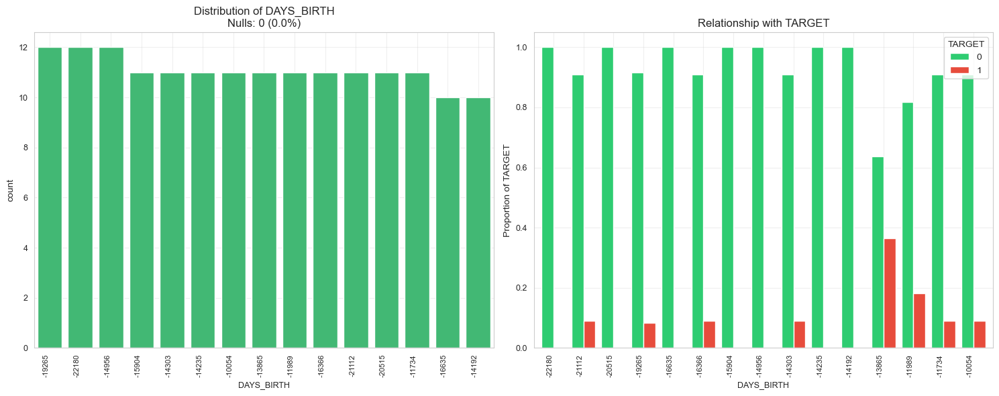

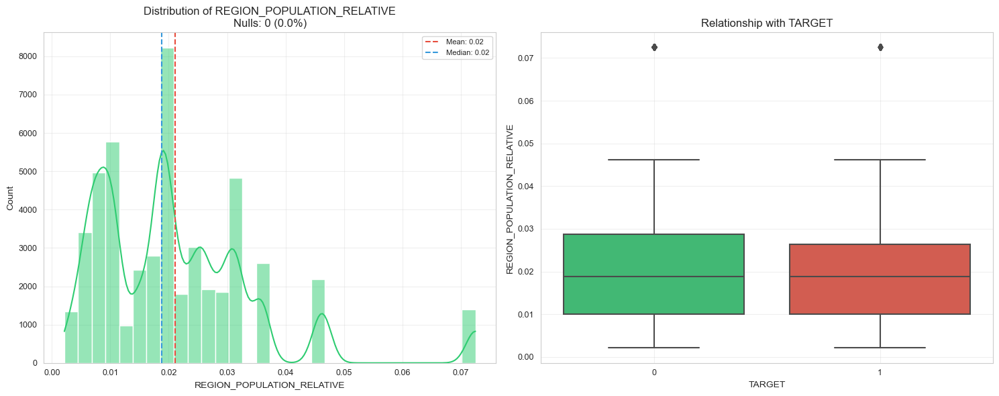

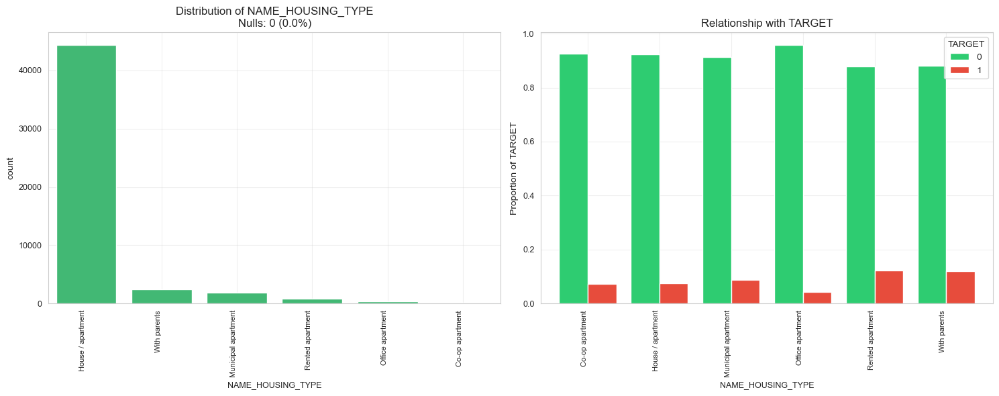


Processing batch 40 of 41


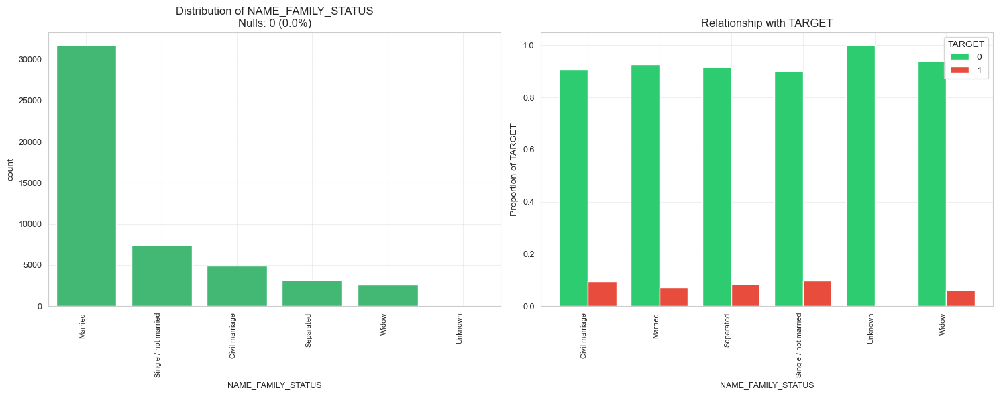

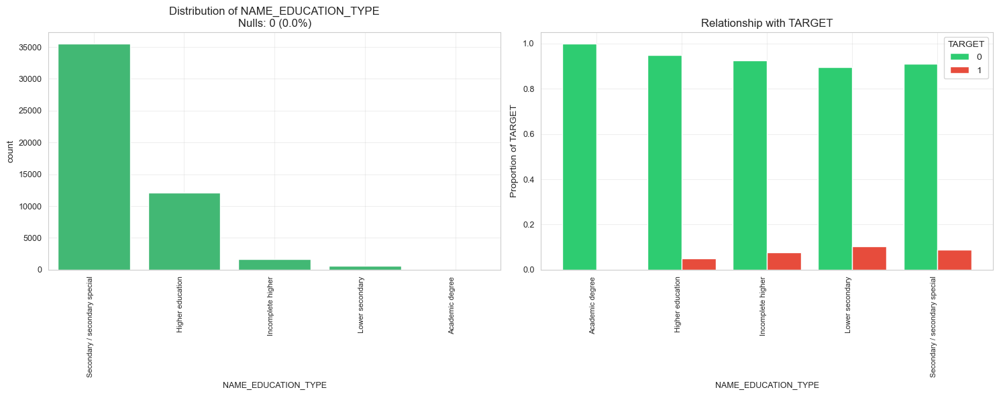

Error in NAME_INCOME_TYPE: operands could not be broadcast together with shape (8,) (7,)

Processing batch 41 of 41


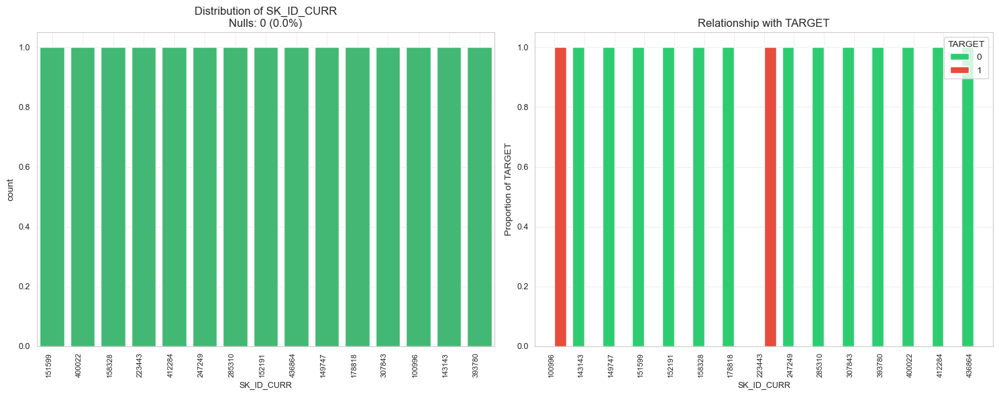


Process completed successfully.


In [51]:
# Start visualization
plot_all_features(
    df=df_application_train,
    target_col='TARGET',
    batch_size=3,           # 3 graphs per batch
    memory_threshold=85     # Clean memory at 85%
)

## Análisis de los gráficos

El código establece el estilo de los gráficos y maximiza la utilización de la memoria al generar visualizaciones para cada elemento del dataset df_application_train. La función plot_feature produce gráficos concretos basados en la categoría de variable (continua o categórica) y proporciona una perspectiva minuciosa de la distribución de cada característica y su vínculo con la variable meta (TARGET). Esto comprende diagramas de distribución y boxplots para variables continuas, al igual que diagramas de conteo y proporciones para variables categóricas. Mediante el uso de una gama de colores a medida y la modificación automática del tamaño de las figuras, se garantiza que las visualizaciones sean nítidas y entendibles.

La función principal plot_all_features gestiona el análisis por lotes, facilitando el procesamiento y visualización de grandes datasets sin saturar la memoria del sistema. Este método, mediante la comprobación del uso de memoria y la limpieza periódica de los recursos, garantiza que el análisis sea eficaz y sostenible. Adicionalmente, la selección de grandes datasets incrementa la rapidez y el desempeño del análisis sin comprometer la representatividad de los datos. 

Por último, se recalca que a partir de estos gráficos se puede analizar las distribuciones de las variables y su relación con la variable objetivo "TARGET". Entre los principales resultados se encuentra: 

* **EXT_SOURCE_1:** El gráfico de la variable EXT_SOURCE_1 revela que presenta una distribución bastante equilibrada con una leve tendencia hacia el valor medio. Además, los clientes con valores superiores en EXT_SOURCE_1 tienen una probabilidad menor de incurrir en el TARGET, es decir que los clientes con valores superiores en EXT_SOURCE_1 suelen tener un riesgo asociado más bajo, lo que indica que esta variable podría ser un indicador significativo para medir la probabilidad de cumplimiento de pagos.

* **NAME_CONTRACT_TYPE:** La gráfica de la variable NAME_CONTRACT_TYPE muestra que los "Cash loans" (préstamos en efectivo) son significativamente más comunes que los "Revolving loans" (créditos renovables). Los "Cash loans" son préstamos otorgados en una suma fija que los clientes deben devolver en cuotas preestablecidas, mientras que los "Revolving loans" permiten a los clientes retirar fondos hasta un límite acordado y pagar en función del monto utilizado. A partir de esto, de acuerdo con la variable objetivo se comprueba que es más usual tener un retraso en el pago del préstamo en "cash loans", lo cual se puede deber a que estos préstamos suelen ser por montos más grandes y específicos, lo que puede representar una carga financiera más significativa para el prestatario. Por su parte,  en los "revolving loans", el prestatario solo está obligado a pagar un mínimo cada mes, lo que puede incentivar un pago más regular, aunque sea pequeño.

* **NAME_EDUCATION_TYPE:** Los datos indican que los individuos con grados de educación superior tienen menos tendencia a postergar los pagos de los préstamos. Primero, en los pagos aplazados (1 en rojo), se nota una reducción considerable en la proporción de los pagos aplazados conforme se eleva el nivel de educación. Por ejemplo, los individuos con educación superior y grado académico presentan una proporción significativamente inferior de pagos demorados en comparación con los que poseen "Secondary / secondary especial" o "Lower secondary".  En contraste, en los pagos sin demora (0 en verde), la proporción de pagos sin demora se incrementa con grados educativos superiores, lo que indica una correlación positiva entre el pago y la formación académica.

* **DAYS_EMPLOYED:** El gráfico de la variable DAYS_EMPLOYED indica que conforme se incrementa la cantidad de días empleados, la proporción de clientes con TARGET equivalente a 0 también se incrementa de manera notable. Esto es comprensible ya que los individuos que han estado trabajando durante un periodo prolongado suelen poseer una mayor estabilidad económica y un ingreso constante, lo que disminuye la probabilidad de incumplimiento de pagos. Además, las capacidades y experiencia obtenidas durante un trabajo extendido pueden convertirse en mejores oportunidades de empleo y una mayor habilidad para gestionar deudas.

* **AMT_CREDIT:** La gráfica de la variable AMT_CREDIT indica que las cantidades de crédito generalmente se encuentran en un rango de bajo a medio, con picos en determinados intervalos que representan los valores más habituales. Los clientes que no enfrentan dificultades de pago (TARGET=0) suelen poseer créditos más elevados y repartidos en una gama más extensa en contraste con los que tienen dificultades de pago (TARGET=1). Esto indica que los clientes con créditos más elevados, probablemente debido a condiciones financieras más favorables, tienen menos posibilidad de no cumplir con sus obligaciones de pago.
  
* **AMT_INCOME_TOTAL:** El gráfico de la variable AMT_INCOME_TOTAL indica que la mayor parte de los ingresos totales de las personas se sitúan en un intervalo de bajo a medio. El promedio de los ingresos se sitúa cerca de 185,838.27, mientras que la mediana es de 144,000. Esto señala que existen algunas personas con ingresos considerablemente elevados que superan el promedio. En relación con la variable TARGET, el diagrama de caja (boxplot) muestra que las personas sin dificultades de pago (TARGET=0) suelen tener ingresos más elevados y repartidos en un espectro más extenso en contraste con las que tienen dificultades de pago (TARGET=1). Esto indica que los clientes con ingresos superiores tienen una probabilidad reducida de incumplir con sus pagos, posiblemente debido a una mayor estabilidad económica.
      
* **NAME_HOUSING_TYPE:** A partir del gráfico, se analiza que la variable NAME_HOUSING_TYPE exhibe la distribución de los diferentes tipos de vivienda y su vínculo con la variable TARGET. El diagrama a la izquierda muestra que "House / apartment" es la categoría de vivienda más habitual, con más de 40,000 casos, seguida por "With parents" y otras categorías menos comunes como "Municipal apartment" y "Rented apartment". El gráfico de la derecha resalta que los dos grupos con las proporciones más elevadas de clientes con dificultades de pago (TARGET=1) son "Apartamento alquilado" y "Con padres", lo que indica que residir en apartamentos alquilados o con padres podría estar vinculado a una mayor posibilidad de incumplimiento de pagos, probablemente debido a una estabilidad financiera inferior a la de aquellos que poseen o alquilan viviendas de otro tipo.

## - Tratamiento de las variables continuas
A continuación, se tratan los valores missing, las correlaciones de las variables continuas y los outlier.

In [54]:
list_var_continuous

['COMMONAREA_MEDI',
 'COMMONAREA_AVG',
 'COMMONAREA_MODE',
 'NONLIVINGAPARTMENTS_MODE',
 'NONLIVINGAPARTMENTS_AVG',
 'NONLIVINGAPARTMENTS_MEDI',
 'LIVINGAPARTMENTS_MODE',
 'LIVINGAPARTMENTS_AVG',
 'LIVINGAPARTMENTS_MEDI',
 'FLOORSMIN_AVG',
 'FLOORSMIN_MODE',
 'FLOORSMIN_MEDI',
 'YEARS_BUILD_MEDI',
 'YEARS_BUILD_MODE',
 'YEARS_BUILD_AVG',
 'OWN_CAR_AGE',
 'LANDAREA_MEDI',
 'LANDAREA_MODE',
 'LANDAREA_AVG',
 'BASEMENTAREA_MEDI',
 'BASEMENTAREA_AVG',
 'BASEMENTAREA_MODE',
 'EXT_SOURCE_1',
 'NONLIVINGAREA_MODE',
 'NONLIVINGAREA_AVG',
 'NONLIVINGAREA_MEDI',
 'ELEVATORS_MEDI',
 'ELEVATORS_AVG',
 'ELEVATORS_MODE',
 'APARTMENTS_MEDI',
 'APARTMENTS_AVG',
 'APARTMENTS_MODE',
 'ENTRANCES_MEDI',
 'ENTRANCES_AVG',
 'ENTRANCES_MODE',
 'LIVINGAREA_AVG',
 'LIVINGAREA_MODE',
 'LIVINGAREA_MEDI',
 'FLOORSMAX_MODE',
 'FLOORSMAX_MEDI',
 'FLOORSMAX_AVG',
 'YEARS_BEGINEXPLUATATION_MODE',
 'YEARS_BEGINEXPLUATATION_MEDI',
 'YEARS_BEGINEXPLUATATION_AVG',
 'TOTALAREA_MODE',
 'EXT_SOURCE_3',
 'AMT_REQ_CREDIT_BURE

## Tratamiento de outliers

Los valores outlier se pueden sustituir por la media, mediana, valores extremos (media+3std o media-3std). Tras el siguiente análisis, hemos decidido como primera iteración dejarlos sin sustituir. Una vez llegue al modelo se pueden realizar iteraciones utilizando diferentes métodos para comprobar si esto mejora el modelo.

In [56]:
f_aux.get_deviation_of_mean_perc(df_application_train, list_var_continuous, target='TARGET', multiplier=3)

,0.0,1.0,variable,sum_outlier_values,percentage_sum_null_values
0,0.943844,0.056156,COMMONAREA_MEDI,1389,0.005646
1,0.944767,0.055233,COMMONAREA_AVG,1376,0.005593
2,0.939839,0.060161,COMMONAREA_MODE,1363,0.005540
3,0.926554,0.073446,NONLIVINGAPARTMENTS_MODE,531,0.002158
4,0.932743,0.067257,NONLIVINGAPARTMENTS_AVG,565,0.002297
5,0.930728,0.069272,NONLIVINGAPARTMENTS_MEDI,563,0.002289
6,0.944095,0.055905,LIVINGAPARTMENTS_MODE,1431,0.005817
7,0.948313,0.051687,LIVINGAPARTMENTS_AVG,1393,0.005662
8,0.947820,0.052180,LIVINGAPARTMENTS_MEDI,1399,0.005687
9,0.970588,0.029412,FLOORSMIN_AVG,476,0.001935


#### Distribución entre clases:

- Variables como DEF_30_CNT_SOCIAL_CIRCLE y DEF_60_CNT_SOCIAL_CIRCLE muestran proporciones elevadas en la clase 1.0 (12.17% y 12.94%, respectivamente), sugiriendo que son indicadores relevantes de riesgo crediticio. La alta presencia de valores en la clase 1.0 indica que los clientes con mayores valores en estas variables tienen una mayor probabilidad de incumplir con los pagos. Esto refuerza la necesidad de monitorear de cerca estos indicadores para mitigar el riesgo crediticio.

#### Valores Atípicos (Outliers):

- Variables como COMMONAREA_MEDI, COMMONAREA_AVG, y COMMONAREA_MODE presentan un número considerable de valores atípicos:

* COMMONAREA_MEDI: 1389 valores atípicos (0.56% de los datos totales).

* COMMONAREA_AVG: 1376 valores atípicos (0.55% de los datos totales).

* COMMONAREA_MODE: 1363 valores atípicos (0.55% de los datos totales).

- Otras variables con niveles significativos de outliers incluyen:

* LIVINGAPARTMENTS_MODE: 1431 valores atípicos (0.58%).

* YEARS_BUILD_MEDI: 965 valores atípicos (0.39%).

* OWN_CAR_AGE: 2670 valores atípicos (1.08%).

Esta variabilidad sugiere la necesidad de aplicar transformaciones de datos para normalizar las distribuciones y mejorar la precisión de los modelos predictivos.
  
#### Porcentaje de Valores Nulos:

Algunas variables presentan un porcentaje significativo de valores nulos:

* OWN_CAR_AGE: 1.08% de valores nulos.

* AMT_REQ_CREDIT_BUREAU_HOUR: 0.52% de valores nulos.

* OBS_30_CNT_SOCIAL_CIRCLE: 1.99% de valores nulos.

Es crucial manejar estos valores nulos mediante imputación o eliminación, dependiendo de la importancia de la variable en el análisis. Las técnicas de imputación pueden incluir la media, la mediana, o el uso de diversos algoritmos.
  
#### Variables Clave para el Riesgo:

- Variables como OBS_30_CNT_SOCIAL_CIRCLE (8.8% en la clase 1.0) y AMT_REQ_CREDIT_BUREAU_YEAR (8.9%) son indicadores clave del comportamiento de pago. Estos predictores necesitan un manejo adecuado de los valores nulos y atípicos para garantizar su eficacia en los modelos de riesgo crediticio.

## Correlaciones

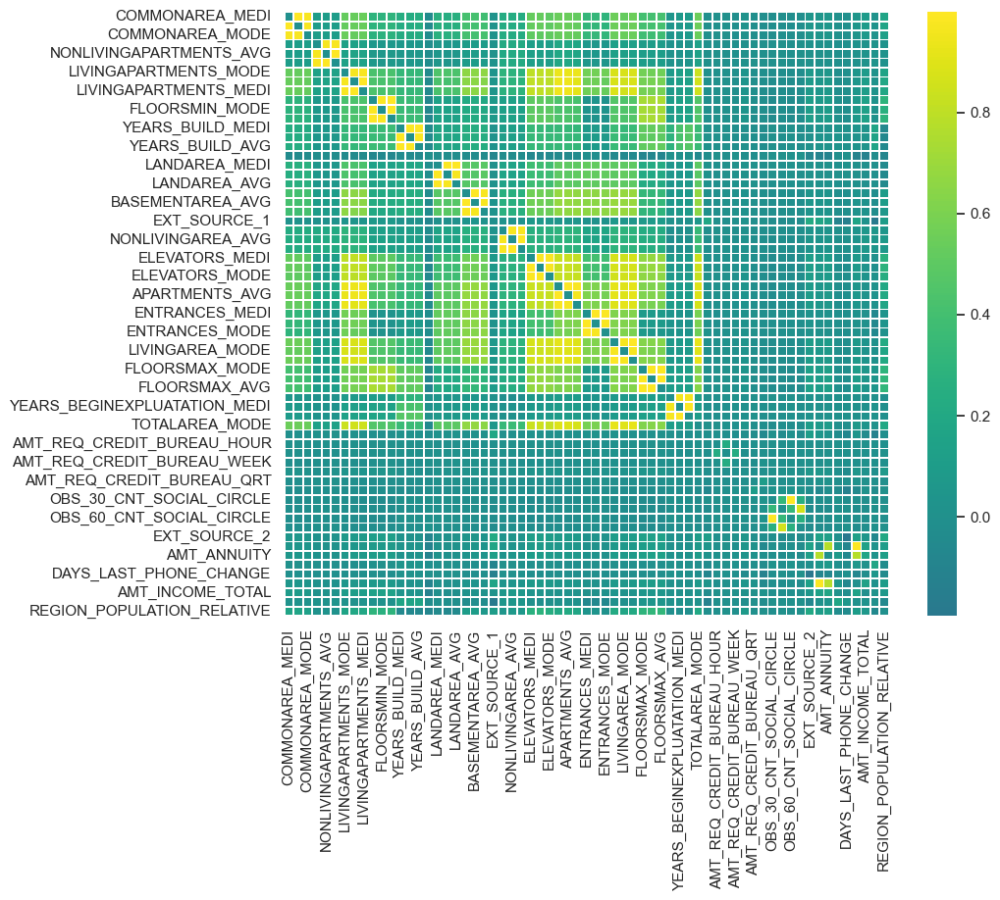

0

In [59]:
f_aux.get_corr_matrix(dataset = df_application_train[list_var_continuous], 
                metodo='pearson', size_figure=[10,8])

## Análisis de la matriz de correlación

Analizando la matriz de correlación del conjunto de datos BAF, se observa un patrón significativo de correlaciones moderadas a fuertes (valores entre 0.4 y 0.8) entre las variables relacionadas con las características de los apartamentos y áreas comunes (COMMONAREA_MEDI, LIVINGAPARTMENTS_MODE, NONLIVINGAPARTMENTS_AVG). Esto sugiere una estructura coherente en la forma en que las propiedades están organizadas y documentadas en el sistema bancario, lo cual es relevante para la detección de patrones potencialmente fraudulentos. Asimismo, variables como COMMONAREA_MEDI y COMMONAREA_MODE, y YEARS_BUILD_MEDI y YEARS_BUILD_AVG, presentan altas correlaciones. Esta redundancia sugiere que pueden capturar información similar, lo cual es útil para simplificar el modelo eliminando o combinando estas variables, según el análisis . 

Por otra parte, las variables relacionadas con información crediticia y financiera (AMT_REQ_CREDIT_BUREAU_HOUR, AMT_REQ_CREDIT_BUREAU_WEEK, OBS_30_CNT_SOCIAL_CIRCLE) muestran correlaciones débiles entre sí (valores cercanos a 0), lo que indica independencia en los diferentes aspectos del comportamiento financiero de los clientes. Esta independencia es particularmente valiosa para los modelos de detección de fraude, ya que permite capturar diferentes dimensiones del riesgo sin redundancia informativa.

In [61]:
corr = df_application_train[list_var_continuous].corr('pearson')
new_corr = corr.abs()
new_corr.loc[:,:] = np.tril(new_corr, k=-1) # below main lower triangle of an array
new_corr = new_corr.stack().to_frame('correlation').reset_index().sort_values(by='correlation', ascending=False)
new_corr[new_corr['correlation']>0.6]

,level_0,level_1,correlation
3562,OBS_60_CNT_SOCIAL_CIRCLE,OBS_30_CNT_SOCIAL_CIRCLE,0.998500
922,YEARS_BUILD_AVG,YEARS_BUILD_MEDI,0.998419
724,FLOORSMIN_MEDI,FLOORSMIN_AVG,0.997352
2639,FLOORSMAX_AVG,FLOORSMAX_MEDI,0.997141
2177,ENTRANCES_AVG,ENTRANCES_MEDI,0.996948
1781,ELEVATORS_AVG,ELEVATORS_MEDI,0.996008
65,COMMONAREA_AVG,COMMONAREA_MEDI,0.995816
2440,LIVINGAREA_MEDI,LIVINGAREA_AVG,0.995450
1979,APARTMENTS_AVG,APARTMENTS_MEDI,0.995270
527,LIVINGAPARTMENTS_MEDI,LIVINGAPARTMENTS_AVG,0.994466


* ### Variables con correlación extremadamente alta (> 0.99):

OBS_60_CNT_SOCIAL_CIRCLE y OBS_30_CNT_SOCIAL_CIRCLE (0.9985): Estas dos variables probablemente representan conteos de observaciones sociales en diferentes intervalos de tiempo (60 y 30 días), lo cual indica una relación cercana ya que están midiendo algo muy similar. Podría ser redundante conservar ambas variables, y se podría eliminar una para reducir la multicolinealidad. Otros ejemplos con correlaciones cercanas a 1 incluyen pares como YEARS_BUILD_AVG y YEARS_BUILD_MEDI (0.9984), y FLOORSMIN_MEDI y FLOORSMIN_AVG (0.9971), que también sugieren duplicidad en la información.

* ### Variables de medidas promedio y mediana (AVG y MEDI):

Las variables con sufijos AVG, MEDI y MODE (promedio, mediana y moda) de características similares como FLOORSMAX, LIVINGAREA, APARTMENTS, ELEVATORS, etc., tienden a tener una alta correlación entre sí. A partir de esto se puede analizar que, en muchas casos, la media, mediana y moda de estas características tienden a ser valores cercanos. Por ejemplo, ENTRANCES_AVG y ENTRANCES_MEDI tienen una correlación de 0.9968. En estos casos, se podría optar por seleccionar solo una de estas variables representativas (como AVG o MEDI) para reducir la redundancia sin perder información significativa.

* ### Relación entre área y otras variables estructurales:

LIVINGAREA, BASEMENTAREA, y APARTMENTS están muy correlacionadas entre sí. Por ejemplo, LIVINGAREA_MEDI y APARTMENTS_MEDI tienen una correlación de 0.9158. Esto sugiere que los tamaños de áreas habitables y apartamentos suelen estar alineados.La alta correlación entre estas áreas y otras variables estructurales puede indicar que las características de tamaño y espacio tienen un comportamiento consistente en los registros, algo que es útil para el análisis de propiedades o evaluaciones.

* ### Total Area vs. Componentes individuales:

TOTALAREA_MODE está altamente correlacionado con otras áreas específicas como LIVINGAREA y APARTMENTS, indicando que el área total tiende a ser una combinación directa de estas variables. Por ejemplo, TOTALAREA_MODE y LIVINGAREA_AVG tienen una correlación de 0.9263. Es probable que TOTALAREA_MODE esté estrechamente relacionada con las áreas individuales, por lo que es necesario hacer un estudio para determinar el valor de cada una de estas áreas en el presente análisis.

### Posible problema de multicolinealidad:

La alta correlación entre estas variables genera un problema conocido como multicolinealidad. Esto significa que las variables están tan estrechamente relacionadas que es difícil determinar el efecto único de cada una sobre la variable dependiente en un modelo de regresión. Para resolver este problema, se pueden aplicar técnicas como el Análisis de Componentes Principales (PCA) o eliminar algunas de las variables altamente correlacionadas.

Por último, decidimos en esta primera iteración, no eliminar correlaciones. Sin embargo, si al final se aplica algún algoritmo que lo requiera, se eliminarán las correlaciones correspondientes.

## Tratamiento de valores nulos

En este apartado se van a considerar las siguientes preguntas ¿Son todos los nulos de una clase de la variable objetivo? o ¿Tienen el mismo porcentaje de la variable objetivo?

In [64]:
list_var_continuous

['COMMONAREA_MEDI',
 'COMMONAREA_AVG',
 'COMMONAREA_MODE',
 'NONLIVINGAPARTMENTS_MODE',
 'NONLIVINGAPARTMENTS_AVG',
 'NONLIVINGAPARTMENTS_MEDI',
 'LIVINGAPARTMENTS_MODE',
 'LIVINGAPARTMENTS_AVG',
 'LIVINGAPARTMENTS_MEDI',
 'FLOORSMIN_AVG',
 'FLOORSMIN_MODE',
 'FLOORSMIN_MEDI',
 'YEARS_BUILD_MEDI',
 'YEARS_BUILD_MODE',
 'YEARS_BUILD_AVG',
 'OWN_CAR_AGE',
 'LANDAREA_MEDI',
 'LANDAREA_MODE',
 'LANDAREA_AVG',
 'BASEMENTAREA_MEDI',
 'BASEMENTAREA_AVG',
 'BASEMENTAREA_MODE',
 'EXT_SOURCE_1',
 'NONLIVINGAREA_MODE',
 'NONLIVINGAREA_AVG',
 'NONLIVINGAREA_MEDI',
 'ELEVATORS_MEDI',
 'ELEVATORS_AVG',
 'ELEVATORS_MODE',
 'APARTMENTS_MEDI',
 'APARTMENTS_AVG',
 'APARTMENTS_MODE',
 'ENTRANCES_MEDI',
 'ENTRANCES_AVG',
 'ENTRANCES_MODE',
 'LIVINGAREA_AVG',
 'LIVINGAREA_MODE',
 'LIVINGAREA_MEDI',
 'FLOORSMAX_MODE',
 'FLOORSMAX_MEDI',
 'FLOORSMAX_AVG',
 'YEARS_BEGINEXPLUATATION_MODE',
 'YEARS_BEGINEXPLUATATION_MEDI',
 'YEARS_BEGINEXPLUATATION_AVG',
 'TOTALAREA_MODE',
 'EXT_SOURCE_3',
 'AMT_REQ_CREDIT_BURE

In [65]:
f_aux.get_percent_null_values_target(df_application_train, list_var_continuous, target='TARGET')

,0.0,1.0,variable,sum_null_values,percentage_sum_null_values
0,0.914398,0.085602,COMMONAREA_MEDI,171830,0.698473
1,0.914398,0.085602,COMMONAREA_AVG,171830,0.698473
2,0.914398,0.085602,COMMONAREA_MODE,171830,0.698473
3,0.914308,0.085692,NONLIVINGAPARTMENTS_MODE,170798,0.694278
4,0.914308,0.085692,NONLIVINGAPARTMENTS_AVG,170798,0.694278
5,0.914308,0.085692,NONLIVINGAPARTMENTS_MEDI,170798,0.694278
6,0.913899,0.086101,LIVINGAPARTMENTS_MODE,168151,0.683518
7,0.913899,0.086101,LIVINGAPARTMENTS_AVG,168151,0.683518
8,0.913899,0.086101,LIVINGAPARTMENTS_MEDI,168151,0.683518
9,0.913850,0.086150,FLOORSMIN_AVG,166871,0.678315


## Técnicas para tratamiento de valores nulos

Cuando se enfrenta a la presencia de valores nulos en un conjunto de datos y no se tiene mucho contexto sobre las variables, se pueden considerar diferentes técnicas para manejarlos. A continuación se presentan varias opciones y sus explicaciones:

### Opción 0:
Algoritmos que Aceptan Valores Nulos Algunos algoritmos de machine learning pueden manejar de manera directa los valores nulos en su entrada. Esto significa que no es necesario realizar ninguna imputación o eliminación de datos nulos, ya que el algoritmo cuenta con mecanismos internos para tratar con la ausencia de valores.

### Opción 1:
Eliminar Filas con Valores Nulos Se puede optar por eliminar todas las filas que contienen valores nulos. Esta estrategia es simple y garantiza que solo se utilicen datos completos en el modelo. Sin embargo, no es óptima en conjuntos de datos donde muchas filas tienen valores nulos, ya que podría resultar en la pérdida de una cantidad significativa de información.

### Opción 2:
Imputación de Valores Nulos Otra opción es imputar los valores nulos utilizando diversas técnicas:

* media
* mediana
* maximo
* minimo
* valores extremos

https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.fillna.html

Decidimos rellenar todas las columnas continuas menos revol_util por el valor -99. De esta manera, se diferencian los outlier del resto de la muestra poninendo un valor muy separado del resto de la variable. Se puede explorar el resultado del modelo utilizando diferentes métodos.

### Justificación

Rellenar las columnas continuas con un valor como -99 puede ser una estrategia efectiva para tratar los valores nulos, especialmente si se desea diferenciar claramente estos valores de los datos válidos. Aquí están algunas justificaciones y consideraciones para esta técnica:

* Diferenciación Clara de Valores Nulos: Al usar un valor extremo como -99, se asegura que los valores nulos sean claramente distinguibles del resto de los datos. Esto es particularmente útil en el preprocesamiento y en la fase de modelado, ya que los modelos pueden identificar fácilmente estos valores como especiales.

* Mantener la Completa Información del Conjunto de Datos: Esta técnica permite mantener todas las filas en el conjunto de datos, evitando la pérdida de información que podría ocurrir si se eliminan filas con valores nulos. Esto es crucial cuando se tiene un conjunto de datos limitado o cuando los valores nulos están distribuidos de manera significativa en el dataset.

* Flexibilidad para Modelos de Machine Learning: Muchos algoritmos de machine learning pueden manejar valores extremos de manera eficiente y, en algunos casos, pueden interpretar estos valores como indicadores adicionales. Esto puede ayudar a los modelos a aprender patrones adicionales sobre los datos.

* Simplificación del Preprocesamiento: Imputar todos los valores continuos nulos con un valor constante como -99 simplifica el proceso de preprocesamiento, haciéndolo más rápido y menos propenso a errores.
ostremos

COMMONAREA_MEDI                 0.698473
COMMONAREA_MODE                 0.698473
COMMONAREA_AVG                  0.698473
NONLIVINGAPARTMENTS_MODE        0.694278
NONLIVINGAPARTMENTS_MEDI        0.694278
NONLIVINGAPARTMENTS_AVG         0.694278
LIVINGAPARTMENTS_MODE           0.683518
LIVINGAPARTMENTS_AVG            0.683518
LIVINGAPARTMENTS_MEDI           0.683518
FLOORSMIN_AVG                   0.678315
FLOORSMIN_MODE                  0.678315
FLOORSMIN_MEDI                  0.678315
YEARS_BUILD_MEDI                0.664791
YEARS_BUILD_MODE                0.664791
YEARS_BUILD_AVG                 0.664791
OWN_CAR_AGE                     0.659853
LANDAREA_MODE                   0.593595
LANDAREA_AVG                    0.593595
LANDAREA_MEDI                   0.593595
BASEMENTAREA_MEDI               0.584859
BASEMENTAREA_AVG                0.584859
BASEMENTAREA_MODE               0.584859
EXT_SOURCE_1                    0.563104
NONLIVINGAREA_MODE              0.551271
NONLIVINGAREA_AV

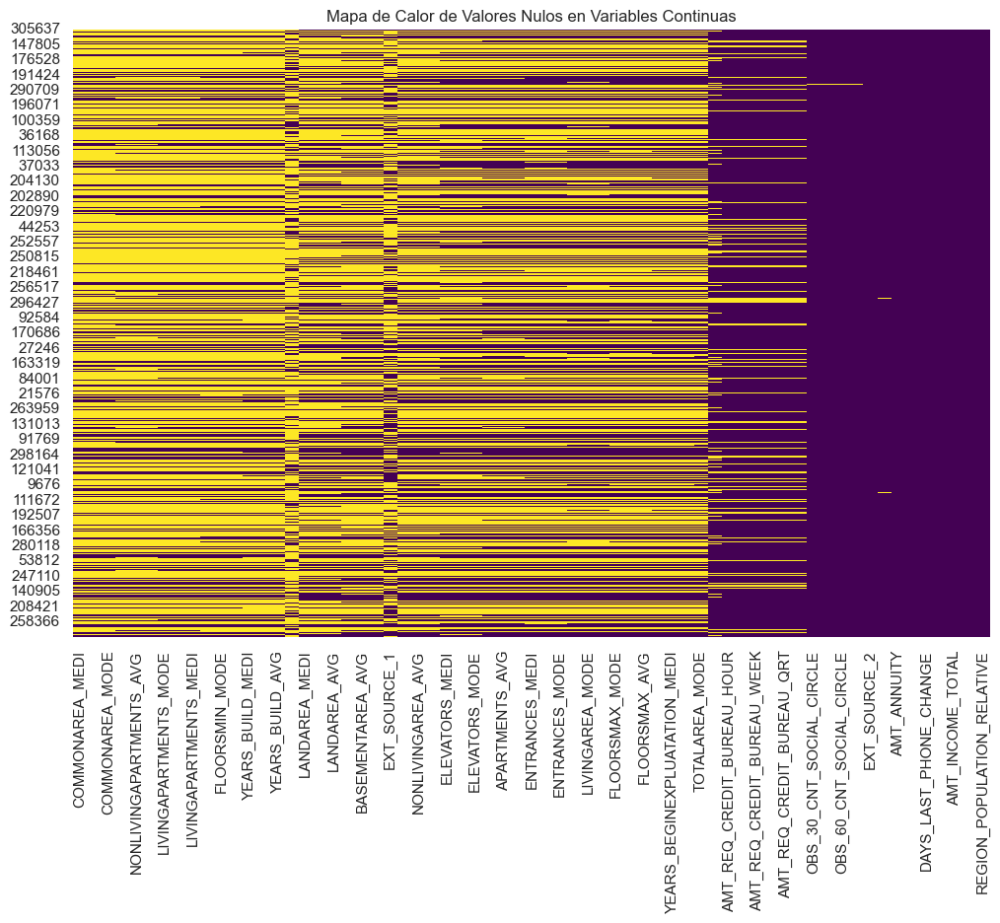

In [46]:
# Check null values and proportion
null_summary = df_application_train[list_var_continuous].isnull().mean().sort_values(ascending=False)
print(null_summary)

# Visualize null values distribution
plt.figure(figsize=(12, 8))
sns.heatmap(df_application_train[list_var_continuous].isnull(), cbar=False, cmap='viridis')
plt.title('Heatmap of Null Values for continuous variables')
plt.show()

In [76]:
# Make a copy of Data Frames Train and Test
df_application_input_train = df_application_train.copy()
df_application_input_test = df_application_test.copy()

# Define list of continuous variables excluding our target variable
list_var_continuous = [col for col in df_application_input_train.columns if df_application_input_train[col].dtype in ['float64', 'int64'] and col != 'TARGET']

# Define columns that should remain unchanged 
protected_columns = ['OWN_CAR_AGE', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 
                     'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE', 
                     'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE']

# Exclude these columns from the list of columns to be imputed
list_vars_to_impute = [col for col in list_var_continuous if col not in protected_columns]

# Imputing null values with -99 for selected variables
df_application_input_train[list_vars_to_impute] = df_application_input_train[list_vars_to_impute].fillna(-99)
df_application_input_test[list_vars_to_impute] = df_application_input_test[list_vars_to_impute].fillna(-99)

# Checking results applied 
print("Null values in selected columns for train set:")
print(df_application_input_train[list_vars_to_impute].isnull().sum())

print("Null values in selected columns for test set:")
print(df_application_input_test[list_vars_to_impute].isnull().sum())

Null values in selected columns for train set:
COMMONAREA_MEDI                 0
COMMONAREA_AVG                  0
COMMONAREA_MODE                 0
NONLIVINGAPARTMENTS_MODE        0
NONLIVINGAPARTMENTS_AVG         0
NONLIVINGAPARTMENTS_MEDI        0
LIVINGAPARTMENTS_MODE           0
LIVINGAPARTMENTS_AVG            0
LIVINGAPARTMENTS_MEDI           0
FLOORSMIN_AVG                   0
FLOORSMIN_MODE                  0
FLOORSMIN_MEDI                  0
YEARS_BUILD_MEDI                0
YEARS_BUILD_MODE                0
YEARS_BUILD_AVG                 0
LANDAREA_MEDI                   0
LANDAREA_MODE                   0
LANDAREA_AVG                    0
BASEMENTAREA_MEDI               0
BASEMENTAREA_AVG                0
BASEMENTAREA_MODE               0
NONLIVINGAREA_MODE              0
NONLIVINGAREA_AVG               0
NONLIVINGAREA_MEDI              0
ELEVATORS_MEDI                  0
ELEVATORS_AVG                   0
ELEVATORS_MODE                  0
APARTMENTS_MEDI                 0
A

In [78]:
list_vars_to_impute

['COMMONAREA_MEDI',
 'COMMONAREA_AVG',
 'COMMONAREA_MODE',
 'NONLIVINGAPARTMENTS_MODE',
 'NONLIVINGAPARTMENTS_AVG',
 'NONLIVINGAPARTMENTS_MEDI',
 'LIVINGAPARTMENTS_MODE',
 'LIVINGAPARTMENTS_AVG',
 'LIVINGAPARTMENTS_MEDI',
 'FLOORSMIN_AVG',
 'FLOORSMIN_MODE',
 'FLOORSMIN_MEDI',
 'YEARS_BUILD_MEDI',
 'YEARS_BUILD_MODE',
 'YEARS_BUILD_AVG',
 'LANDAREA_MEDI',
 'LANDAREA_MODE',
 'LANDAREA_AVG',
 'BASEMENTAREA_MEDI',
 'BASEMENTAREA_AVG',
 'BASEMENTAREA_MODE',
 'NONLIVINGAREA_MODE',
 'NONLIVINGAREA_AVG',
 'NONLIVINGAREA_MEDI',
 'ELEVATORS_MEDI',
 'ELEVATORS_AVG',
 'ELEVATORS_MODE',
 'APARTMENTS_MEDI',
 'APARTMENTS_AVG',
 'APARTMENTS_MODE',
 'ENTRANCES_MEDI',
 'ENTRANCES_AVG',
 'ENTRANCES_MODE',
 'LIVINGAREA_AVG',
 'LIVINGAREA_MODE',
 'LIVINGAREA_MEDI',
 'FLOORSMAX_MODE',
 'FLOORSMAX_MEDI',
 'FLOORSMAX_AVG',
 'YEARS_BEGINEXPLUATATION_MODE',
 'YEARS_BEGINEXPLUATATION_MEDI',
 'YEARS_BEGINEXPLUATATION_AVG',
 'TOTALAREA_MODE',
 'AMT_REQ_CREDIT_BUREAU_HOUR',
 'AMT_REQ_CREDIT_BUREAU_DAY',
 'AMT_REQ_

In [80]:
print(df_application_train.columns)

Index(['COMMONAREA_MEDI', 'COMMONAREA_AVG', 'COMMONAREA_MODE',
       'NONLIVINGAPARTMENTS_MODE', 'NONLIVINGAPARTMENTS_AVG',
       'NONLIVINGAPARTMENTS_MEDI', 'FONDKAPREMONT_MODE',
       'LIVINGAPARTMENTS_MODE', 'LIVINGAPARTMENTS_AVG',
       'LIVINGAPARTMENTS_MEDI',
       ...
       'DAYS_REGISTRATION', 'DAYS_EMPLOYED', 'DAYS_BIRTH',
       'REGION_POPULATION_RELATIVE', 'NAME_HOUSING_TYPE', 'NAME_FAMILY_STATUS',
       'NAME_EDUCATION_TYPE', 'NAME_INCOME_TYPE', 'SK_ID_CURR', 'TARGET'],
      dtype='object', length=122)


In [82]:
print(df_application_test.columns)

Index(['COMMONAREA_MEDI', 'COMMONAREA_AVG', 'COMMONAREA_MODE',
       'NONLIVINGAPARTMENTS_MODE', 'NONLIVINGAPARTMENTS_AVG',
       'NONLIVINGAPARTMENTS_MEDI', 'FONDKAPREMONT_MODE',
       'LIVINGAPARTMENTS_MODE', 'LIVINGAPARTMENTS_AVG',
       'LIVINGAPARTMENTS_MEDI',
       ...
       'DAYS_REGISTRATION', 'DAYS_EMPLOYED', 'DAYS_BIRTH',
       'REGION_POPULATION_RELATIVE', 'NAME_HOUSING_TYPE', 'NAME_FAMILY_STATUS',
       'NAME_EDUCATION_TYPE', 'NAME_INCOME_TYPE', 'SK_ID_CURR', 'TARGET'],
      dtype='object', length=122)


### ¿Por qué imputar en ambos conjuntos (train y test)?

**Coherencia de Datos:** Si imputas valores nulos en el conjunto de entrenamiento pero no en el de prueba, puedes introducir inconsistencias entre los dos conjuntos, lo que podría afectar la performance del modelo. La idea es que ambos conjuntos de datos deben pasar por el mismo proceso de preprocesamiento para asegurar que las distribuciones de datos sean coherentes.

**Mismas Transformaciones:** Las mismas transformaciones que aplicas al conjunto de entrenamiento deben aplicarse al conjunto de prueba para que el modelo pueda hacer predicciones correctamente. Esto incluye cualquier tipo de escalado, imputación, codificación de variables, etc.

## - Tratamiento de las variables categoricas 

Para calcular la correlación de Spearman, es imprescindible convertir las variables categóricas en numéricas. Esta conversión permite medir la relación entre estas variables mediante coeficientes de correlación.

En primer lugar, se aplicará el coeficiente V de Cramer. Este método es útil para evaluar la asociación entre variables categóricas y permite una mejor comprensión de las interdependencias en el conjunto de datos. Para más detalles sobre la implementación de este método, puedes consultar este recurso en: https://stackoverflow.com/questions/46498455/categorical-features-correlation

Esta aproximación garantiza que las variables categóricas sean adecuadamente preprocesadas para su análisis y posterior utilización en modelos predictivos.

In [86]:
list_var_cat

['FONDKAPREMONT_MODE',
 'WALLSMATERIAL_MODE',
 'HOUSETYPE_MODE',
 'EMERGENCYSTATE_MODE',
 'OCCUPATION_TYPE',
 'NAME_TYPE_SUITE',
 'CNT_CHILDREN',
 'FLAG_DOCUMENT_8',
 'NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_DOCUMENT_2',
 'FLAG_DOCUMENT_3',
 'FLAG_DOCUMENT_4',
 'FLAG_DOCUMENT_5',
 'FLAG_DOCUMENT_6',
 'FLAG_DOCUMENT_7',
 'FLAG_DOCUMENT_9',
 'FLAG_DOCUMENT_21',
 'FLAG_DOCUMENT_10',
 'FLAG_DOCUMENT_11',
 'FLAG_OWN_REALTY',
 'FLAG_DOCUMENT_13',
 'FLAG_DOCUMENT_14',
 'FLAG_DOCUMENT_15',
 'FLAG_DOCUMENT_16',
 'FLAG_DOCUMENT_17',
 'FLAG_DOCUMENT_18',
 'FLAG_DOCUMENT_19',
 'FLAG_DOCUMENT_20',
 'FLAG_DOCUMENT_12',
 'FLAG_PHONE',
 'LIVE_CITY_NOT_WORK_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'TARGET',
 'REG_CITY_NOT_LIVE_CITY',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'REG_REGION_NOT_LIVE_REGION',
 'HOUR_APPR_PROCESS_START',
 'WEEKDAY_APPR_PROCESS_START',
 'REGION_RATING_CLIENT_W_CITY',
 'REGION_RATING_CLIENT',
 'FLAG_EMAIL',
 'FLAG_CONT_MOBILE',
 'ORGANIZATI

## Coeficiente V de Cramer

In [88]:
def cramers_v(x, y):
    """ Calculate Cramér's V coefficient for the association between two categorical variables """
    # Remove null values
    x = x.dropna()
    y = y.dropna()
    
    # Only calculate if both variables have data
    if x.empty or y.empty:
        return np.nan
    
    confusion_matrix = pd.crosstab(x, y)
    if confusion_matrix.shape[0] == 1 or confusion_matrix.shape[1] == 1:
        return np.nan
    
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    return np.sqrt(chi2 / (n * (min(confusion_matrix.shape) - 1)))

# Calculate Cramér's V in batches of 2
batch_size = 2
for i in range(0, len(list_var_cat), batch_size):
    current_vars = list_var_cat[i:i + batch_size]
    cramers_v_matrix = pd.DataFrame(index=current_vars, columns=current_vars)
    for var1 in current_vars:
        for var2 in current_vars:
            if var1 == var2:
                cramers_v_matrix.loc[var1, var2] = 1.0
            else:
                # Combine the data and remove rows with NaN
                combined = pd.concat([df_application_input_train[var1], df_application_input_train[var2]], axis=1).dropna()
                if combined.empty or combined[var1].nunique() < 2 or combined[var2].nunique() < 2:
                    cramers_v_matrix.loc[var1, var2] = np.nan
                else:
                    cramers_v_matrix.loc[var1, var2] = cramers_v(combined[var1], combined[var2])

    # Convert to numeric type
    cramers_v_matrix = cramers_v_matrix.astype(float)

    # Visualize the current batch matrix
    print(f"Cramér's V matrix for batch {i // batch_size + 1}:")
    print(cramers_v_matrix)

Cramér's V matrix for batch 1:
                    FONDKAPREMONT_MODE  WALLSMATERIAL_MODE
FONDKAPREMONT_MODE            1.000000            0.108775
WALLSMATERIAL_MODE            0.108775            1.000000
Cramér's V matrix for batch 2:
                     HOUSETYPE_MODE  EMERGENCYSTATE_MODE
HOUSETYPE_MODE             1.000000             0.030346
EMERGENCYSTATE_MODE        0.030346             1.000000
Cramér's V matrix for batch 3:
                 OCCUPATION_TYPE  NAME_TYPE_SUITE
OCCUPATION_TYPE         1.000000         0.023407
NAME_TYPE_SUITE         0.023407         1.000000
Cramér's V matrix for batch 4:
                 CNT_CHILDREN  FLAG_DOCUMENT_8
CNT_CHILDREN          1.00000          0.05764
FLAG_DOCUMENT_8       0.05764          1.00000
Cramér's V matrix for batch 5:
                    NAME_CONTRACT_TYPE  CODE_GENDER
NAME_CONTRACT_TYPE            1.000000     0.013891
CODE_GENDER                   0.013891     1.000000
Cramér's V matrix for batch 6:
                 FL

### Principales resultados:

* **Relación entre Variables Categóricas:** A partir de los cálculos del coeficiente V de Cramer, se puede observar que la mayoría de las asociaciones entre variables categóricas son bastante débiles, con coeficientes generalmente bajos, como por ejemplo, HOUSETYPE_MODE y EMERGENCYSTATE_MODE con un valor de 0.030346. Esto sugiere que no hay una fuerte relación entre muchas de las variables categóricas en el conjunto de datos, lo cual puede ser interpretado como una indicación de independencia entre estas variables.

* **Identificación de Relaciones Significativas:** Sin embargo, algunas combinaciones muestran una asociación más fuerte, como LIVE_CITY_NOT_WORK_CITY y REG_CITY_NOT_WORK_CITY con un coeficiente de 0.824172, lo que indica una relación significativa entre estas variables. Este resultado es lógico, ya que es probable que las personas que viven en la misma ciudad en la que trabajan también registren su residencia en esa ciudad. Otro ejemplo es LIVE_REGION_NOT_WORK_REGION y REG_REGION_NOT_WORK_REGION con un valor de 0.859511, lo que refuerza la importancia de considerar estas asociaciones durante el análisis y modelado.

In [57]:
# Mostrar los primeros valores de las columnas categóricas
for col in list_var_cat:
    print(f"Valores únicos en la columna '{col}':")
    print(df_application_input_train[col].unique())
    print("\n")

Valores únicos en la columna 'FONDKAPREMONT_MODE':
[NaN, 'reg oper account', 'org spec account', 'not specified', 'reg oper spec account']
Categories (4, object): ['reg oper account', 'org spec account', 'not specified', 'reg oper spec account']


Valores únicos en la columna 'WALLSMATERIAL_MODE':
['Panel', NaN, 'Stone, brick', 'Block', 'Others', 'Mixed', 'Wooden', 'Monolithic']
Categories (7, object): ['Panel', 'Stone, brick', 'Block', 'Others', 'Mixed', 'Wooden', 'Monolithic']


Valores únicos en la columna 'HOUSETYPE_MODE':
['block of flats', NaN, 'specific housing', 'terraced house']
Categories (3, object): ['block of flats', 'specific housing', 'terraced house']


Valores únicos en la columna 'EMERGENCYSTATE_MODE':
['No', NaN, 'Yes']
Categories (2, object): ['No', 'Yes']


Valores únicos en la columna 'OCCUPATION_TYPE':
['Drivers', 'Laborers', 'Security staff', NaN, 'High skill tech staff', ..., 'Private service staff', 'HR staff', 'Low-skill Laborers', 'IT staff', 'Realty agents'

In [90]:
# Check the number of null values in the categorical variables
print("Null values in categorical variables:")
print(df_application_input_train[list_var_cat].isnull().sum())

# Check the number of non-null values in the categorical variables
print("Non-null values in categorical variables:")
print(df_application_input_train[list_var_cat].notnull().sum())

Null values in categorical variables:
FONDKAPREMONT_MODE             168191
WALLSMATERIAL_MODE             125005
HOUSETYPE_MODE                 123367
EMERGENCYSTATE_MODE            116513
OCCUPATION_TYPE                 76942
NAME_TYPE_SUITE                  1003
CNT_CHILDREN                        0
FLAG_DOCUMENT_8                     0
NAME_CONTRACT_TYPE                  0
CODE_GENDER                         0
FLAG_OWN_CAR                        0
FLAG_DOCUMENT_2                     0
FLAG_DOCUMENT_3                     0
FLAG_DOCUMENT_4                     0
FLAG_DOCUMENT_5                     0
FLAG_DOCUMENT_6                     0
FLAG_DOCUMENT_7                     0
FLAG_DOCUMENT_9                     0
FLAG_DOCUMENT_21                    0
FLAG_DOCUMENT_10                    0
FLAG_DOCUMENT_11                    0
FLAG_OWN_REALTY                     0
FLAG_DOCUMENT_13                    0
FLAG_DOCUMENT_14                    0
FLAG_DOCUMENT_15                    0
FLAG_DOCUMEN

In [92]:
# Check the number of null values in the categorical variables
print("Null values in categorical variables:")
print(df_application_input_test[list_var_cat].isnull().sum())

# Check the number of non-null values in the categorical variables
print("Non-null values in categorical variables:")
print(df_application_input_test[list_var_cat].notnull().sum())

Null values in categorical variables:
FONDKAPREMONT_MODE             42104
WALLSMATERIAL_MODE             31336
HOUSETYPE_MODE                 30930
EMERGENCYSTATE_MODE            29242
OCCUPATION_TYPE                19449
NAME_TYPE_SUITE                  289
CNT_CHILDREN                       0
FLAG_DOCUMENT_8                    0
NAME_CONTRACT_TYPE                 0
CODE_GENDER                        0
FLAG_OWN_CAR                       0
FLAG_DOCUMENT_2                    0
FLAG_DOCUMENT_3                    0
FLAG_DOCUMENT_4                    0
FLAG_DOCUMENT_5                    0
FLAG_DOCUMENT_6                    0
FLAG_DOCUMENT_7                    0
FLAG_DOCUMENT_9                    0
FLAG_DOCUMENT_21                   0
FLAG_DOCUMENT_10                   0
FLAG_DOCUMENT_11                   0
FLAG_OWN_REALTY                    0
FLAG_DOCUMENT_13                   0
FLAG_DOCUMENT_14                   0
FLAG_DOCUMENT_15                   0
FLAG_DOCUMENT_16                   0


## Sustitución de valores nulos en variables categóricas

In [94]:
# Replace null values with "NO VALUE" in categorical variables
df_application_input_train[list_var_cat] = df_application_input_train[list_var_cat].astype("object").fillna("NO VALUE").astype("category")
df_application_input_test[list_var_cat] = df_application_input_test[list_var_cat].astype("object").fillna("NO VALUE").astype("category")

# Verify the results
print("Null values in categorical variables in the training set:")
print(df_application_input_train[list_var_cat].isnull().sum())

print("Null values in categorical variables in the test set:")
print(df_application_input_test[list_var_cat].isnull().sum())

Null values in categorical variables in the training set:
FONDKAPREMONT_MODE             0
WALLSMATERIAL_MODE             0
HOUSETYPE_MODE                 0
EMERGENCYSTATE_MODE            0
OCCUPATION_TYPE                0
NAME_TYPE_SUITE                0
CNT_CHILDREN                   0
FLAG_DOCUMENT_8                0
NAME_CONTRACT_TYPE             0
CODE_GENDER                    0
FLAG_OWN_CAR                   0
FLAG_DOCUMENT_2                0
FLAG_DOCUMENT_3                0
FLAG_DOCUMENT_4                0
FLAG_DOCUMENT_5                0
FLAG_DOCUMENT_6                0
FLAG_DOCUMENT_7                0
FLAG_DOCUMENT_9                0
FLAG_DOCUMENT_21               0
FLAG_DOCUMENT_10               0
FLAG_DOCUMENT_11               0
FLAG_OWN_REALTY                0
FLAG_DOCUMENT_13               0
FLAG_DOCUMENT_14               0
FLAG_DOCUMENT_15               0
FLAG_DOCUMENT_16               0
FLAG_DOCUMENT_17               0
FLAG_DOCUMENT_18               0
FLAG_DOCUMENT_19  

Cuando se reemplazaron los valores nulos con "SIN VALOR", las columnas que antes tenían valores nulos ahora tienen un valor no nulo (específicamente el texto "SIN VALOR"). Así, el conteo de valores nulos se volvió 0 para esas columnas.

In [96]:
# To check

# View the first rows of the training set
print("First rows of the training set:")
print(df_application_input_train[list_var_cat].head())

# View the first rows of the test set
print("First rows of the test set:")
print(df_application_input_test[list_var_cat].head())

First rows of the training set:
       FONDKAPREMONT_MODE WALLSMATERIAL_MODE  HOUSETYPE_MODE  \
305637           NO VALUE              Panel  block of flats   
152596   reg oper account              Panel  block of flats   
64100            NO VALUE           NO VALUE        NO VALUE   
24351            NO VALUE              Panel  block of flats   
118194   reg oper account       Stone, brick  block of flats   

       EMERGENCYSTATE_MODE OCCUPATION_TYPE  NAME_TYPE_SUITE CNT_CHILDREN  \
305637                  No         Drivers  Spouse, partner            0   
152596                  No        Laborers    Unaccompanied            0   
64100             NO VALUE  Security staff    Unaccompanied            0   
24351                   No        Laborers    Unaccompanied            0   
118194                  No        NO VALUE    Unaccompanied            0   

       FLAG_DOCUMENT_8 NAME_CONTRACT_TYPE CODE_GENDER FLAG_OWN_CAR  \
305637               0         Cash loans           M   

## Guardado de las tablas

In [98]:
# Save the preprocessed DataFrames to CSV files
df_application_input_train.to_csv("../data/preprocessed_data/train_preprocessed_missing_outlier.csv", index=False)
df_application_input_test.to_csv("../data/preprocessed_data/test_preprocessed_missing_outlier.csv", index=False)

# Verify the results of the operation
print("CSV files successfully created and saved.")

CSV files successfully created and saved.


In [100]:
print(df_application_input_train.shape, df_application_input_test.shape)

(246008, 122) (61503, 122)


Por último, en esta sección se guardaron los DataFrames preprocesados en archivos CSV, indicando que el tratamiento de datos, análisis de correlaciones, manejo de valores missing y outliers se realizó con éxito. Este paso es crucial, ya que asegura que los datos están listos para futuras fases de modelado, manteniendo la calidad y la integridad de la información.